Random search for parameter sets where A affects k4 and B affects k3. Note that it is not required that A is stronger. Run on an interactive session on the cluster, took about 30 minutes to get 10 million points.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys, os
sys.path.append("../../../work2/ownutils/scriptssyn") #rosamc/scriptssyn repo
sys.path.append("./bin/")
import PolAB_A_allpars

import networkx as nx
import matplotlib as mpl
mpl.rcParams['font.size']=12
import fluxes
import clusteringaux
import basic
import glob
import itertools
import matplotlib.colors as colors
import seaborn as sns

In [2]:
rhofunc=PolAB_A_allpars.interface_rhos_GRF_PolAB_A_A
parsliststr='ktia0,ktan0,ktin0,ktni0,ktiaA,ktanA,ktinA,ktniA,ktiaB,ktanB,ktinB,ktniB,kbBa,kuBa,kbBi,kuBi,kbBn,kuBn,kbAa,kuAa,kbAi,kuAi,kbAn,kuAn'
parslist=parsliststr.split(',')
parslist_order=['ktni0','ktin0','ktia0','ktan0','ktniA','ktinA','ktiaA','ktanA','ktniB','ktinB','ktiaB','ktanB','kbBa','kuBa','kbBi','kuBi','kbBn','kuBn','kbAa','kuAa','kbAi','kuAi','kbAn','kuAn']
flux_order_labs=['2-1','1-2','1-0','0-2','5-4','4-5','4-3','3-5','8-7','7-8','7-6','6-8','2-5','5-2','2-8','8-2','1-4','4-1','1-7','7-1','0-3','3-0','0-6','6-0']

#labls=np.array(parslist[:18])

#copied from 2019_05_14_prepare_3statepol-equalb

edges=[(2,'ktia0',1),(1,'ktan0',3),(2,'ktin0',3),(3,'ktni0',2),
       (8,'ktiaA',7),(7,'ktanA',9),(8,'ktinA',9),(9,'ktniA',8),
       (5,'ktiaB',4),(4,'ktanB',6),(5,'ktinB',6),(6,'ktniB',5),
      (1,'kbBa-B',4),(4,'kuBa',1),(2,'kbBi-B',5),(5,'kuBi',2),(3,'kbBn-B',6),(6,'kuBn',3),
       (1,'kbAa-A',7),(7,'kuAa',1),(2,'kbAi-A',8),(8,'kuAi',2),(3,'kbAn-A',9),(9,'kuAn',3)]
edges_=[]
for tuple_ in edges:
    edges_.append((tuple_[0]-1,tuple_[1],tuple_[2]-1))
    
graph_edges_dict=dict()
for x in edges:
    graph_edges_dict['%s-%s'%(x[0],x[2])]=x[1]
#note that A is to the left, B is to the right
#coords=fluxes.get_G_coords_9nodes()
basiccoords={0: [0,-1],
         1: [0.,1],
         2: [-1, 0]}

dx=2.5
coords=dict()
coords[0]=basiccoords[0]
coords[1]=basiccoords[1]
coords[2]=basiccoords[2]
coords[3]=[basiccoords[0][0]+dx,basiccoords[0][1]] #B
coords[4]=[basiccoords[1][0]+dx,basiccoords[1][1]] #B
coords[5]=[basiccoords[2][0]+dx,basiccoords[2][1]] #B
coords[6]=[basiccoords[0][0]-dx,basiccoords[0][1]] #A
coords[7]=[basiccoords[1][0]-dx,basiccoords[1][1]] #A
coords[8]=[basiccoords[2][0]-dx,basiccoords[2][1]] #A


#connectstyles

#these are the labels corresponding to the flux matrix, then flattened so that it is a row
nnodes=9
flux_names_mat=np.empty((nnodes,nnodes),dtype=object)
for i in np.arange(nnodes):
    for j in np.arange(nnodes):
        flux_names_mat[i,j]='%d-%d'%(i,j)
#print(flux_names_mat)
flux_names_flat=flux_names_mat.flatten()
#print(flux_names_flat)

#names of transitions for the fluxes, appending an extension to distinguish the different TF states
#for this analysis I only look at the situation where both TFs are present, but could also look at the situation where, nothing, or only A or B are bound
all_fnames=[]
flux_order_labs_AB=[]
for i in [3]:
    if i==0:
        ext='0'
    elif i==1:
        ext='A'
    elif i==2:
        ext='B'
    else:
        ext='AB'
    all_fnames.extend(['%s.%s'%(x,ext) for x in flux_names_flat]) #add extension to the labls obtained above
    flux_order_labs_AB.extend(['%s.%s'%(x,ext) for x in flux_order_labs]) #add extension to the order
all_fnames=np.array(all_fnames)

#find the edges that are mirror images of each other
edges_sym=dict()
for edge_ in edges:
    edge=edge_[1]
    if "A" in edge:
        e2=edge.replace("A","B")
    elif "B" in edge:
        e2=edge.replace("B","A")
    else:
        continue
    for e_ in edges:
        if e_[1]==e2:
            nodes1="%d-%d"%(edge_[0]-1,edge_[2]-1)
            nodes="%d-%d"%(e_[0]-1,e_[2]-1)
            print(nodes1, edge_, "symmetric of", e_,nodes)
            edges_sym[nodes1]=nodes

7-6 (8, 'ktiaA', 7) symmetric of (5, 'ktiaB', 4) 4-3
6-8 (7, 'ktanA', 9) symmetric of (4, 'ktanB', 6) 3-5
7-8 (8, 'ktinA', 9) symmetric of (5, 'ktinB', 6) 4-5
8-7 (9, 'ktniA', 8) symmetric of (6, 'ktniB', 5) 5-4
4-3 (5, 'ktiaB', 4) symmetric of (8, 'ktiaA', 7) 7-6
3-5 (4, 'ktanB', 6) symmetric of (7, 'ktanA', 9) 6-8
4-5 (5, 'ktinB', 6) symmetric of (8, 'ktinA', 9) 7-8
5-4 (6, 'ktniB', 5) symmetric of (9, 'ktniA', 8) 8-7
0-3 (1, 'kbBa-B', 4) symmetric of (1, 'kbAa-A', 7) 0-6
3-0 (4, 'kuBa', 1) symmetric of (7, 'kuAa', 1) 6-0
1-4 (2, 'kbBi-B', 5) symmetric of (2, 'kbAi-A', 8) 1-7
4-1 (5, 'kuBi', 2) symmetric of (8, 'kuAi', 2) 7-1
2-5 (3, 'kbBn-B', 6) symmetric of (3, 'kbAn-A', 9) 2-8
5-2 (6, 'kuBn', 3) symmetric of (9, 'kuAn', 3) 8-2
0-6 (1, 'kbAa-A', 7) symmetric of (1, 'kbBa-B', 4) 0-3
6-0 (7, 'kuAa', 1) symmetric of (4, 'kuBa', 1) 3-0
1-7 (2, 'kbAi-A', 8) symmetric of (2, 'kbBi-B', 5) 1-4
7-1 (8, 'kuAi', 2) symmetric of (5, 'kuBi', 2) 4-1
2-8 (3, 'kbAn-A', 9) symmetric of (3, 'kbBn-B'

In [3]:
def check_constraints(df,minb=None,maxb=None,parfc=None,fc1=None,fc2=None):
    for par in ["p1","p2","p4"]:
        minb_=10**minb
        maxb_=10**maxb
        print(minb_,maxb_)
        mask=(df[par].values>=minb_) & (df[par].values<=maxb_)
        checkb1=np.all(mask)
        print("base clockwise", checkb1)
        if not checkb1:
            display(df[~mask])
        
    ktinlim=4-(maxb-minb)
    print("ktin>%d? "%ktinlim, np.all(df["p3"].values >=ktinlim))
    
    
    r1A=df["p5"]/df["p1"]
    r2A=df["p6"]/df["p2"]
    r3A=df["p8"]/df["p4"]
    r1B=df["p9"]/df["p1"]
    r2B=df["p10"]/df["p2"]
    r3B=df["p12"]/df["p4"]
    
    r4A=df["p7"]/df["p3"]
    r4B=df["p11"]/df["p3"]
    
    
    if parfc is None:
        for r_,r in enumerate([r1A,r2A,r3A,r1B,r2B,r3B]):
            print("clockwise par",r_,"gt1",np.all(r.values>1-1e-10),"gteq1",np.all(r.values>=1))
        for r_,r in enumerate([r4A,r4B]):
            print("anticlockwise par", r_,"lt1",np.all(r.values<1),"lteq1",np.all(r.values<=1))
    else:
        parfc_=10**parfc
        titles=["r1A","r2A","r3A","r1B","r2B","r3B"]
        for r_,r in enumerate([r1A,r2A,r3A,r1B,r2B,r3B]):
            print("clockwise par",titles[r_],"eq1",np.all(r.values==1),"gt1",np.all(r.values>1),"eqgt1",np.all(r.values>=1-1e-10),"eqgt1 and fc",np.all((r.values>=1)&(r.values<=parfc_)))
        for r_,r in enumerate([r4A,r4B]):
            print("anticlockwise par", r_,"lt1",np.all(r.values<1),"leq1",np.all(r.values<=1+1e-10),np.all((r.values<1)&(r.values>=1/parfc_)))
    print("fc1 A", np.all((df["mA"]/df["m0"]).values<fc1))
    print("fc1 B", np.all((df["mB"]/df["m0"]).values<fc1))
    print("fc2", np.all((df["mA"]/df["mB"]).values<=fc2))
    
    return 
        
        
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

# Read data

In [4]:
def return_fullparset(parset,case):
    if case=="any":
        parset2=parset.copy()
    elif case=="difAD_difbnp":
        parset2=np.concatenate((parset[0:12],parset[12:14],parset[12:14],parset[12:14],parset[14:16],parset[14:16],parset[14:16]))
    elif case=="difADsbnp" or case=="difAD_samebnp":
        parset2=np.concatenate((parset[0:12],parset[12:14],parset[12:14],parset[12:14],parset[12:14],parset[12:14],parset[12:14]))
    elif case=="difAD_samebnp_step12":#ni,ia
        parset2=np.concatenate((parset[0:4],parset[0:3],parset[4:5],parset[5:6],parset[1:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))
    elif case=="difAD_samebnp_step13": #ni,an
        parset2=np.concatenate((parset[0:4],parset[0:3],parset[4:5],parset[0:1],parset[5:6],parset[2:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step42": #in,ia #4,2
        parset2=np.concatenate((parset[0:4],parset[0:2],parset[4:5],parset[3:4],parset[5:6],parset[1:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step43": #in,an #4,3
        parset2=np.concatenate((parset[0:4],parset[0:2],parset[4:5],parset[3:4],parset[0:1],parset[5:6],parset[2:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step23":#ia,an
        parset2=np.concatenate((parset[0:4],parset[4:5],parset[1:4],parset[0:1],parset[5:6],parset[2:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step11":
        parset2=np.concatenate((parset[0:4],parset[0:3],parset[4:5],parset[0:3],parset[5:6],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))
    elif case=="difAD_samebnp_step22":
        parset2=np.concatenate((parset[0:4],parset[4:5],parset[1:4],parset[5:6],parset[1:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))
    elif case=="sameAD_difbp":
        parset2=np.concatenate((parset[0:8],parset[4:8],parset[8:20]))
    elif case=="sameAD_difbp_kuonly":
        kb=parset[8]
        ku1,ku2,ku3,ku4,ku5,ku6=parset[9:]
        bindingar=np.array([kb,ku1,kb,ku2,kb,ku3,kb,ku4,kb,ku5,kb,ku6])
        parset2=np.concatenate((parset[0:8],parset[4:8],bindingar))
    elif case=="sameAD_difbnp":
        parset2=np.concatenate((parset[0:8],parset[4:8],parset[8:10],parset[8:10],parset[8:10],parset[10:12],parset[10:12],parset[10:12]))
    elif case=="empty":
         parset2=np.concatenate((parset[0:8],parset[0:4],parset[8:10],parset[8:10],parset[8:10],parset[8:10],parset[8:10],parset[8:10]))
    else:
        print("unrecognised case, ", case)
        raise ValueError
    return parset2

In [5]:
colnames=["p%d"%i for i in range(1,25)]
colnames=colnames+["SAB","SBA","m0","mA","mB","mAB","quadrant"]
colnames

['p1',
 'p2',
 'p3',
 'p4',
 'p5',
 'p6',
 'p7',
 'p8',
 'p9',
 'p10',
 'p11',
 'p12',
 'p13',
 'p14',
 'p15',
 'p16',
 'p17',
 'p18',
 'p19',
 'p20',
 'p21',
 'p22',
 'p23',
 'p24',
 'SAB',
 'SBA',
 'm0',
 'mA',
 'mB',
 'mAB',
 'quadrant']

In [6]:
fc1=10
fc2=10
minb=0
maxb=4
parfc=3
alldfs=[]


green="#c6cdad"
blue="#d3dbe4"
red="#e3cbc8"

green2="#b1bc8c"
blue2="#a6bed8"

In [8]:
f="/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-kinsynsub1/random_k2k4_k3k4/2022_03_14_k3k4/final_results/2022_03_14_randompoints_nit=10000000_minb=0_maxb=4_parfc=3_fc1=10_fc2=10_seed=0.df"
df=pd.read_csv(f)

display(df.head())
ok=check_constraints(df,minb=minb,maxb=maxb,parfc=parfc,fc1=fc1,fc2=fc2)
alldfs=[df]

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p22,p23,p24,SAB,SBA,m0,mA,mB,mAB,quadrant
0,7155.682162,34.179529,1468.588599,130.490736,7155.682162,34.179529,187.145007,130.490736,7155.682162,5039.489599,...,2.231091,1.923731,2.231091,-0.570149,0.957032,25.884478,76.347055,26.488965,51.423360,2
1,27.417737,55.992237,617.340520,1.741413,27.417737,55.992237,464.586795,1.741413,27.417737,481.450319,...,3.278726,6.942729,3.278726,-0.151100,0.168804,0.073755,0.092155,0.073828,0.082992,2
2,221.846070,1.203456,2068.998219,1.044196,221.846070,1.203456,514.358768,1.044196,221.846070,12.023527,...,7059.178773,872.521402,7059.178773,-0.051385,0.092336,0.093243,0.108388,0.098110,0.104595,2
3,9.885817,201.664446,233.435942,194.539423,9.885817,201.664446,7.804167,194.539423,9.885817,6471.367240,...,2430.159002,61.447117,2430.159002,-0.013369,0.014961,4.298594,4.414037,4.328207,4.373324,2
4,796.190735,101.227271,6673.206112,376.669796,796.190735,101.227271,49.592979,376.669796,796.190735,266.423701,...,16.080490,1.193364,16.080490,-0.116598,0.127133,27.746217,33.772883,28.523173,31.150766,2


1 10000
base clockwise True
1 10000
base clockwise True
1 10000
base clockwise True
ktin>0?  True
clockwise par r1A eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r2A eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r3A eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r1B eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r2B eq1 False gt1 True eqgt1 True eqgt1 and fc True
clockwise par r3B eq1 True gt1 False eqgt1 True eqgt1 and fc True
anticlockwise par 0 lt1 True leq1 True True
anticlockwise par 1 lt1 False leq1 True False
fc1 A True
fc1 B True
fc2 True


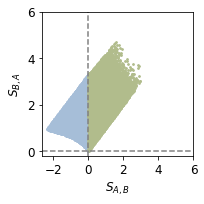

In [10]:
for df in alldfs:
    fig,ax=plt.subplots(1,1,figsize=(3,3))
    mask1=df["quadrant"]==1
    mask2=df["quadrant"]==2
    mask3=df["quadrant"]==3
    ax.scatter(df["SAB"].values[mask2],df["SBA"].values[mask2],s=3,color=blue2)
    ax.scatter(df["SAB"].values[mask1],df["SBA"].values[mask1],s=3,color=green2)
    ax.scatter(df["SAB"].values[mask3],df["SBA"].values[mask3],s=3,color="red")
    ax.set_xlabel('$S_{A,B}$')
    ax.set_ylabel('$S_{B,A}$')
    ax.axhline(y=0,linestyle="--",color="gray")
    ax.axvline(x=0,linestyle="--",color="gray")
    ax.set_xticks(np.arange(-2,7,2))
    ax.set_yticks(np.arange(0,7,2))
    plt.tight_layout()
    plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/Figs1_scatter_k32k4.pdf")
    plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/Figs1_scatter_k3k4.svg")
    plt.show()

In [12]:
all_fnames

array(['0-0.AB', '0-1.AB', '0-2.AB', '0-3.AB', '0-4.AB', '0-5.AB',
       '0-6.AB', '0-7.AB', '0-8.AB', '1-0.AB', '1-1.AB', '1-2.AB',
       '1-3.AB', '1-4.AB', '1-5.AB', '1-6.AB', '1-7.AB', '1-8.AB',
       '2-0.AB', '2-1.AB', '2-2.AB', '2-3.AB', '2-4.AB', '2-5.AB',
       '2-6.AB', '2-7.AB', '2-8.AB', '3-0.AB', '3-1.AB', '3-2.AB',
       '3-3.AB', '3-4.AB', '3-5.AB', '3-6.AB', '3-7.AB', '3-8.AB',
       '4-0.AB', '4-1.AB', '4-2.AB', '4-3.AB', '4-4.AB', '4-5.AB',
       '4-6.AB', '4-7.AB', '4-8.AB', '5-0.AB', '5-1.AB', '5-2.AB',
       '5-3.AB', '5-4.AB', '5-5.AB', '5-6.AB', '5-7.AB', '5-8.AB',
       '6-0.AB', '6-1.AB', '6-2.AB', '6-3.AB', '6-4.AB', '6-5.AB',
       '6-6.AB', '6-7.AB', '6-8.AB', '7-0.AB', '7-1.AB', '7-2.AB',
       '7-3.AB', '7-4.AB', '7-5.AB', '7-6.AB', '7-7.AB', '7-8.AB',
       '8-0.AB', '8-1.AB', '8-2.AB', '8-3.AB', '8-4.AB', '8-5.AB',
       '8-6.AB', '8-7.AB', '8-8.AB'], dtype='<U6')

In [13]:
min_nflog=-13
node0=2
plotting=True
paths_dict=dict()

constraints=[0,4,3]
minb,maxb,parfc=constraints
fc1,fc2=[10,10]
alllabls=[]
allsubsets=[]
allmatd=[]
for i in range(1):
    df=alldfs[i]
    
    #Plot distribution of synergies per most dominant paths, irrespective of the quadrant.



    subset=df[(np.abs(df["SAB"])>0.001)&(np.abs(df["SBA"])>0.001)]
    
    allsubsets.append(subset)
    print("npoints subset", len(subset))
    smatall,labls_=fluxes.get_mat_fluxes_abonly(subset,all_fnames,netJ=True,rhofunc=rhofunc,graph_edges=edges_)
    alllabls.append(labls_)
    mat_dominant_paths_all=fluxes.get_dominant_paths_mat_v4(smatall,labls_,node0)
    allmatd.append(mat_dominant_paths_all)


    #2. select sample, in this case all points
    subset2=subset
    SAB_values=subset2['SAB'].values
    SBA_values=subset2['SBA'].values
    quadrants=subset2["quadrant"].values
    #plt.scatter(subset2["SAB"],subset2["SBA"])
    #plt.show()
    smat=smatall #[mask]
    mat_dominant_paths=mat_dominant_paths_all #[mask]

    result=np.unique(mat_dominant_paths,axis=0,return_inverse=True,return_counts=True)
    #do not take mirrors
    
    #alluniques=fluxes.merge_mirrored_unique_paths(mat_dominant_paths,result,idxs_rev)
    #paths_dict[i]=[title,alluniques,smat,quadrants,SAB_values,SBA_values]
    paths_dict[i]=["title",result,smat,quadrants,SAB_values,SBA_values]

npoints subset 14300


In [14]:
#Check the dominant path for a random parameter set
print(",".join(map(str,subset.iloc[10].values[0:24])))
print(smatall[10])
print(mat_dominant_paths[10])


4.99612782951347,20.509355056847195,526.4955005734334,1.789907028289614,4.99612782951347,20.509355056847195,268.5328963170421,1.789907028289614,4.99612782951347,81.39280422981845,526.4955005734334,1.789907028289614,13.677285328623045,8.987794286691539,13.677285328623045,8.987794286691539,13.677285328623045,8.987794286691539,13.677285328623045,8.987794286691539,13.677285328623045,8.987794286691539,13.677285328623045,8.987794286691539
[0.004131   0.00185328 0.00423554 0.00556183 0.00024099 0.
 0.         0.0117871  0.0081648  0.         0.00631152 0.
 0.00209428 0.00607052 0.00174874 0.01027686 0.01003836 0.0120256
 0.02206396]
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1.]


['0-2.AB' '0-3.AB' '1-0.AB' '1-2.AB' '1-4.AB' '1-7.AB' '2-1.AB' '2-8.AB'
 '3-5.AB' '4-1.AB' '4-3.AB' '4-5.AB' '5-2.AB' '5-4.AB' '6-0.AB' '6-8.AB'
 '7-1.AB' '7-6.AB' '8-7.AB']
[0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1.]
['0-3.AB' '2-8.AB' '3-5.AB' '5-2.AB' '6-0.AB' '7-6.AB' '8-7.AB']


<ipython-input-15-bdaa898a33f1>:56: RuntimeWarning: divide by zero encountered in log10
  matnfi=np.log10(smat_)


path 5, 4575 instances
percentage of positive synergy points 0.9014207650273224
[0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1.]
['1-2.AB' '2-8.AB' '7-1.AB' '8-7.AB']
path 4, 4100 instances
percentage of positive synergy points 0.7251219512195122
[0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1.]
['1-4.AB' '2-8.AB' '4-5.AB' '5-2.AB' '7-1.AB' '8-7.AB']
path 2, 2690 instances
percentage of positive synergy points 0.28810408921933084
[0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 0. 1. 1.]
['0-3.AB' '2-8.AB' '3-5.AB' '4-3.AB' '5-4.AB' '6-0.AB' '7-6.AB' '8-7.AB']
path 6, 753 instances
percentage of positive synergy points 0.0849933598937583
[0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
['0-3.AB' '1-0.AB' '2-1.AB' '3-5.AB' '5-2.AB']
path 14, 640 instances
percentage of positive synergy points 0.109375
0 0.9014207650273224 path generates more than 50% positive synergy
1 0.7251219512195122 path generates more than 50% positive synergy
first items 2
0 0 0
1 0 1

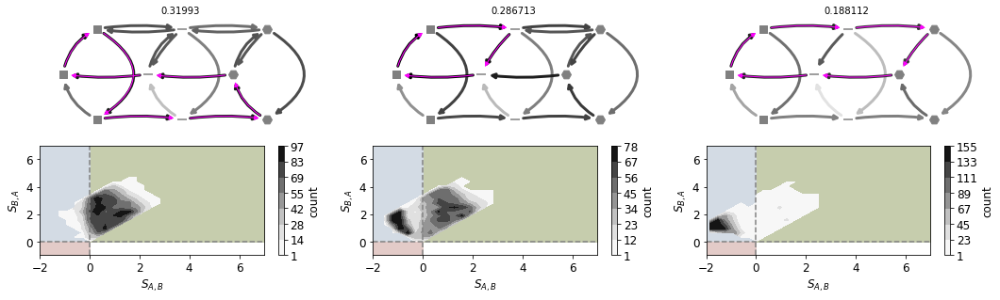

3 1 0
4 1 1


<ipython-input-15-bdaa898a33f1>:207: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


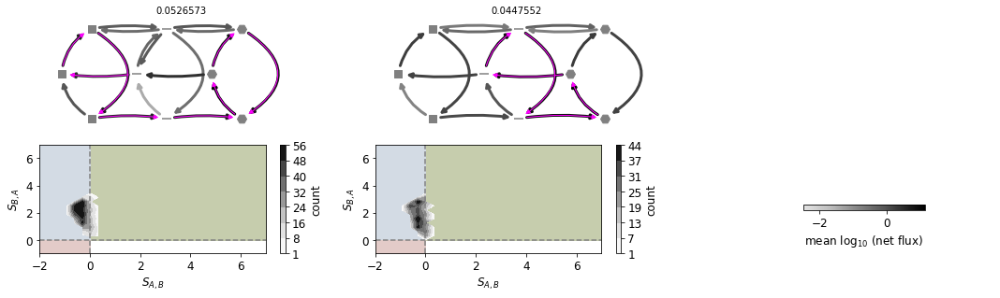

In [15]:
green="#c6cdad"
blue="#d3dbe4"
red="#e3cbc8"

xlim=7
ylim=7
cmapgreys=truncate_colormap(plt.cm.Greys,minval=0.2,maxval=1.0)


percent=0.9
for key in [0]:
    labls_=alllabls[key]
    print(labls_)
    #Now sort according to fluxes

    
    title,alluniques,smat,quadrants,SAB_values,SBA_values=paths_dict[key]


    #print("seed", seed, "percent", percent)
    #for q in range(3):

    unique_paths,idxsup,countup=alluniques
    total=np.sum(countup)
    argsort=np.argsort(countup)[::-1]
    counts_sorted=countup[argsort]
    #print(countup[argsort])


    m_allGs=[] #graphs for each instance with the dominant path
    dominantG=[] #dominant graphs
    corresponding_synergies=[] #corresponding synergies for each path
    percentage_positive=[]
    cumsum=np.cumsum(counts_sorted)
    threshold=np.where(cumsum>percent*total)[0][0]
    #print(cumsum)
    #print('total', total,percent*total,'threshold',threshold,countup[argsort[0:threshold]], '+1?', countup[argsort[0:threshold+1]])
    if threshold==0:
        threshold=1

    for inum,i in enumerate(argsort[0:threshold]):
        #print(inum)
        #get correaponding graph for each path

        path=unique_paths[i]

        print(path)
        print(np.array(labls_)[np.asarray(path,dtype=bool)])
        original_idxs=np.where(idxsup==i)[0] #positions where this path was
        quadrants_p=quadrants[original_idxs]
        #print("count is,", countup[i], "original indexes len is", len(original_idxs))
        #find fluxes corresponding to this path
        #smat_=smat[quadrants==q+1].copy()
        smat_=smat[original_idxs].copy()
        
        matnfi=np.log10(smat_)
        matnfi[matnfi<min_nflog]=min_nflog


        #get graphs that share this dominant path
        all_Gs=[]
        for row in matnfi:
            #Gs=[]
            J=row
            edgelabls=labls_
            G=fluxes.get_graph_fromJarray(J,edgelabls,min_=min_nflog)

            #Gs.append(G)
            #all_Gs.append(Gs)

            all_Gs.append(G)
        common_U=fluxes.merge_graphs(all_Gs)
        dominant=fluxes.get_dominant_path_G(G,node0) #since all have the same dominant path, use the last one
        m_allGs.append(common_U)
        dominantG.append(dominant)
        #allranks[q][pc].append([path,countup[i],all_Gs])
        #mask=(quadrants==q+1)
        SABoriginal=SAB_values[original_idxs]
        SBAoriginal=SBA_values[original_idxs]
        print('path %d, %d instances'%(i,len(original_idxs)))

        corresponding_synergies.append([SABoriginal,SBAoriginal])
        percentage_positive.append(np.sum(SABoriginal>0)/len(SABoriginal))
        print("percentage of positive synergy points", percentage_positive[-1])


    #plot
    m=5
    max_nflog=np.log10(np.max(smat))
    #cmap=plt.cm.summer_r
    cmap=plt.cm.Greys



    #gs=mpl.gridspec.GridSpec(6*nr,nc)

    #fig.suptitle("%s,percent %g"%(title,percent),y=1.05)


    mins=[min([G[e[0]][e[1]]["weight"] for e in G.edges]) for G in m_allGs]
    minv=min(mins)

    maxs=[max([G[e[0]][e[1]]["weight"] for e in G.edges]) for G in m_allGs]
    maxv=max(maxs)


    nr=2
    nc=3

    neworder=[]
    #first find the ones with percentage_positive < 0.5
    for i,item_ in enumerate(percentage_positive):
        if item_>=0.5:
            neworder.append(i)
            print(i, item_, "path generates more than 50% positive synergy")
    print("first items", len(neworder))
    for i,item_ in enumerate(percentage_positive):
        if item_<0.5:
            neworder.append(i)
    pltnum=1
    for i,inum in enumerate(neworder):

        row=i//nc
        col=i%nc
        if col==0:
            if i>0:
                plt.tight_layout()
                plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/fluxessupplk3k4_%d.pdf"%pltnum,bbox_inches="tight")
                plt.show()
                pltnum+=1
            fig,axes=plt.subplots(nr,nc,figsize=(5*nc,2.3*nr))
        print(i,row,col)
        ax=axes[0,col]
        #ax=fig.add_subplot(gs[row:row+5,col:col+1]) #axes_[2*row][col]
        ax.set_title("%g"%(counts_sorted[inum]/total),fontsize=10)
        #print(inum)

        #In this case graphs may have different connectivity
        G=m_allGs[inum]
        colors_=[G[e[0]][e[1]]["weight"] for e in G.edges]
        G2=dominantG[inum]
        #print(minv,colors_w)
        fluxes.plot_graphs([G],[ax],coords=coords,color_lists=[colors_],dominant=[G2],color_args={"edge_cmap":cmapgreys,"edge_vmin":minv,"edge_vmax":maxv,"width":3},colord="magenta")
        ax.set_frame_on(False)
        #cax=fig.add_axes([1,0.6,0.01,0.3])
        #norm = mpl.colors.Normalize(vmin=minv,vmax=maxv)
        #cwidth=0.85/nc
        #cax=fig.add_axes([(col)*(1/nc)+cwidth,1-row*1/nr,0.01,0.9/nr])
        #cb=mpl.colorbar.ColorbarBase(cmap=cmapgreys,norm=norm,ax=cax,orientation='vertical',label="mean\n$\log_{10}$ (net flux)",ticks=[-0.5,0,1])
        #cb.ax.set_yticks()
        #cb.yaxes.set_ylabel()

        ax=axes[1,col]
        #ax=fig.add_subplot(gs[6*row+5:,col:col+1])
        #patch=plt.Polygon([[0,0],[5,0],[5,5],[0,5]],color=green)
        #ax.add_patch(patch)
        ax.fill_between([0,xlim],0,ylim,color=green)
        ax.fill_between([-2,0],0,ylim,color=blue)
        ax.fill_between([-2,0],0,-1,color=red)
        x=corresponding_synergies[inum][0]
        y=corresponding_synergies[inum][1]
        H,xbins,ybins=np.histogram2d(y,x,bins=[np.linspace(-2,xlim,30),np.linspace(-2,ylim,30)])
        mask=H<1
        #mask1=
        cmap1=plt.cm.Greys
        #cmap1.set_under(green)
        #cmap1.set_bad(green)
        #ax.contourf(H,8,extent=[xbins[0],xbins[-1],ybins[0],ybins[-1]],origin="lower",cmap=cmap1,zorder=2)
        levels=list(map(int,np.linspace(1,np.max(H),8)))
        cf=ax.contourf(np.ma.masked_array(H,mask=mask),levels,extent=[xbins[0],xbins[-1],ybins[0],ybins[-1]],vmin=1,origin="lower",cmap=cmap1,zorder=2)
        plt.colorbar(cf,ax=ax,label="count")
        #contours.append(cf)
        #ax.imshow(np.ma.masked_array(H,mask=mask),extent=[xbins[0],xbins[-1],ybins[0],ybins[-1]],origin="lower",cmap=cmap1,zorder=2)
        #sns.kdeplot(*corresponding_synergies[inum],ax=ax,shade=True,cbar=True,cmap=plt.cm.Greys)
        ax.axvline(x=0,linestyle="--",color="gray",zorder=2)
        ax.axhline(y=0,linestyle="--",color="gray",zorder=2)
        ax.set_xlabel(r'$S_{A,B}$')
        ax.set_ylabel(r'$S_{B,A}$')
        ax.set_xlim(-2,xlim)
        ax.set_ylim(-1,ylim)

    #plt.tight_layout()
    #plt.show()
    #norm = mpl.colors.Normalize(vmin=minv,vmax=maxv)
    #mpl.colorbar.ColorbarBase(cmap=cmap,norm=norm,ax=cax,orientation='vertical')
    #cax.set_ylabel()
    #inum=11
    #row=inum//nc
    #col=inum%nc
    #fig,ax=plt.subplots(1,1,)
    ax=axes[0,2]
    ax.set_frame_on(False)
    ax.set_xticks([])
    ax.set_yticks([])

    ax=axes[1,2]
    ax.set_frame_on(False)
    ax.set_xticks([])
    ax.set_yticks([])


    cax=fig.add_axes([0.8,0.3,0.12,0.02])
    norm = mpl.colors.Normalize(vmin=minv,vmax=maxv)
    mpl.colorbar.ColorbarBase(cmap=cmapgreys,norm=norm,ax=cax,orientation='horizontal',label="mean $\log_{10}$ (net flux)")
    #cax.set_ylabel("count")

    plt.tight_layout()
    plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/fluxessupplk3k4_%d.pdf"%pltnum,bbox_inches="tight")
    plt.show()

Print parameter sets for this path, which is the one that we would expect for A acting on k4 and B acting on k3

#path
[0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1]
10951
[1.19204203e+02 2.19767253e+00 5.57172913e+03 9.99697269e+01]
[119.20420331   2.19767253 396.05090404  99.96972686]
[ 119.20420331   62.85977655 5571.72913074   99.96972686]
[1.5318938808522045, 1.5020955264872595, [1.062732187321063, 1.9481880227423758, 1.9888455937955416, 5.633481563190958]]


<ipython-input-21-b23b32980ad1>:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


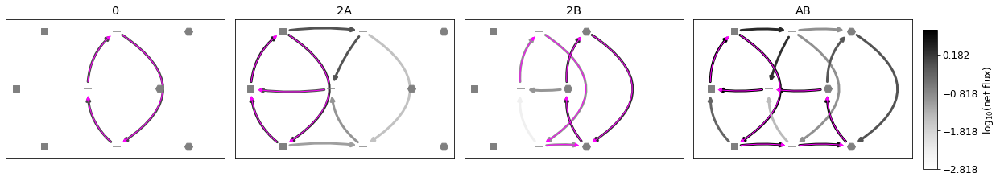

13357
[5.90208790e+02 1.35977286e+00 5.90753635e+03 6.59378057e+01]
[590.20879033   1.35977286   6.66259907  65.93780567]
[ 590.20879033 1068.42160039 5907.53635424   65.93780567]
[3.138463110549475, 0.9875672574940328, [1.1061027645664563, 1.3276181663494317, 5.895998382774863, 11.690813246133956]]


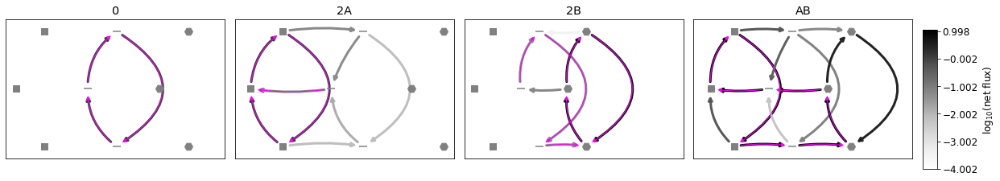

11210
[ 143.44526363    2.28332394 1763.28123972   17.41944888]
[143.44526363   2.28332394  36.91437236  17.41944888]
[ 143.44526363 1188.33120822 1763.28123972   17.41944888]
[1.2673479565212715, 1.8348838282058602, [0.8278109512579, 1.9224311833955243, 1.2971956435015033, 4.627650506191626]]


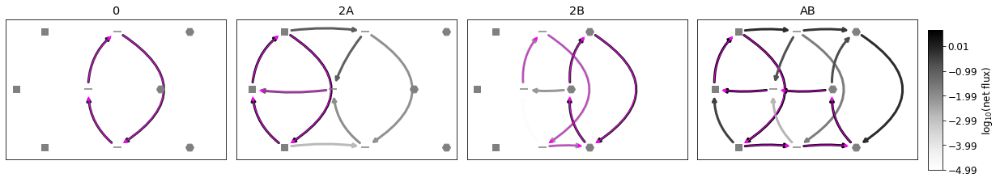

9416
[362.12442804   1.29747198 684.32030387  28.0977804 ]
[362.12442804   1.29747198  95.16747077  28.0977804 ]
[362.12442804 207.33655044 684.32030387  28.0977804 ]
[3.17555788920501, 0.2826275269778763, [1.1411137641078792, 1.2064644818857768, 8.961348257340223, 10.900658107959572]]


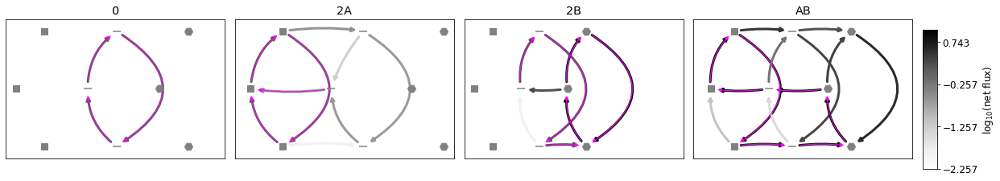

10082
[147.3935495    1.2781261  984.46890825   3.31277169]
[147.3935495    1.2781261    3.10734948   3.31277169]
[147.3935495   29.51398225 984.46890825   3.31277169]
[0.5756898587356276, 1.6396641916601156, [0.321829574646375, 0.8860627068167714, 0.4238149470114584, 1.3205789603524858]]


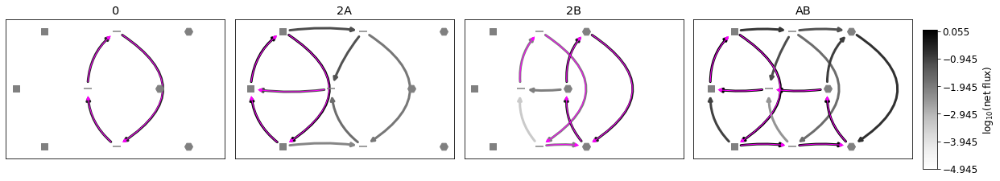

13912
[8.64599047e+01 1.57816235e+00 5.50332313e+03 6.87256245e+02]
[ 86.45990469   1.57816235  22.49062772 687.25624508]
[  86.45990469  584.3475626  5503.32313413  687.25624508]
[3.724980543730403, 1.1324608286901414, [1.3526552571764914, 1.5442691109881568, 9.314277724917872, 20.41991178349006]]


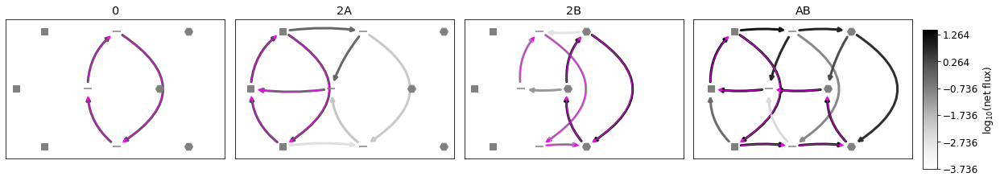

9304
[5.17007241e+02 2.68000503e+00 5.54523421e+03 1.23849716e+02]
[ 517.0072406     2.68000503 1293.54240742  123.84971608]
[ 517.0072406   342.47534757 5545.23421203  123.84971608]
[2.7373275696047, 0.7143642121172946, [2.1288181708098888, 2.4697660027657506, 10.037567038431957, 16.46923833579348]]


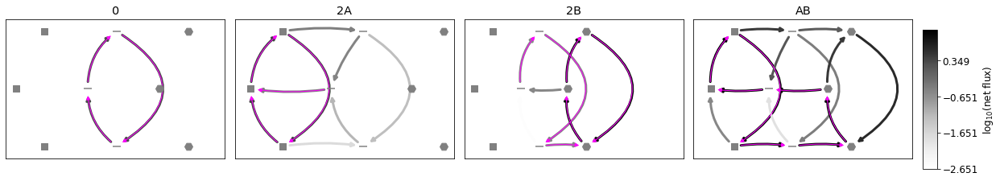

11419
[1.63969560e+03 1.56272950e+00 7.53512070e+03 5.67445685e+01]
[1.63969560e+03 1.56272950e+00 5.30541987e+01 5.67445685e+01]
[1639.69559973 1528.34787357 7535.12069953   56.74456849]
[3.561365301996867, 0.8334095181076888, [1.3529541335600923, 1.5005633133406742, 9.94147539895289, 17.71463081514521]]


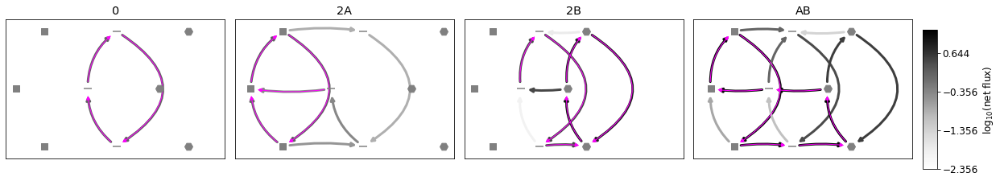

6509
[1791.78490446    2.450498    465.34506907   17.22374686]
[1791.78490446    2.450498    135.59759152   17.22374686]
[1791.78490446  320.65245698  465.34506907   17.22374686]
[2.625460013609113, 0.01349897044428579, [2.075651623488303, 2.1166633382908993, 12.93988477632986, 13.061528553902708]]


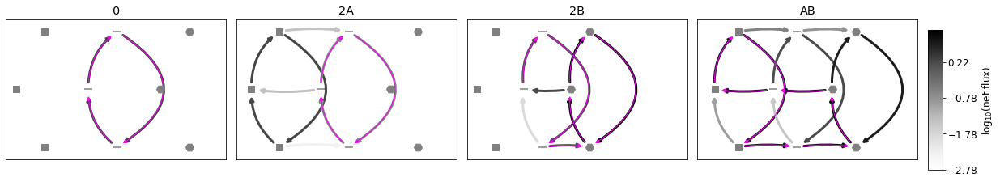

13398
[1.04045449e+02 1.02439584e+00 6.98263210e+03 5.86005106e+02]
[104.04544943   1.02439584  57.56554926 586.0051057 ]
[ 104.04544943  233.71961889 6982.6320956   586.0051057 ]
[3.7892716373788042, 0.8638145348495508, [0.9074193468967039, 1.010715098063197, 7.678547799538523, 13.973756713460503]]


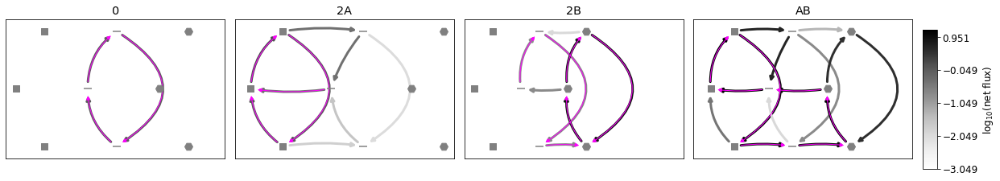

10807
[ 494.42630217    1.85821922 1415.65793807   29.88596773]
[494.42630217   1.85821922   4.6814768   29.88596773]
[ 494.42630217  174.25575843 1415.65793807   29.88596773]
[2.8263238497989023, 0.7559631571153376, [1.4937903565846002, 1.735751868749582, 7.290013152116245, 12.311072751408664]]


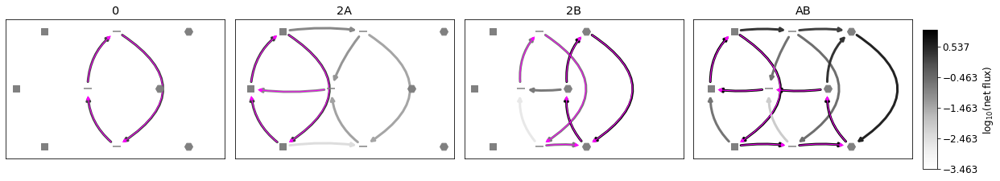

2412
[ 54.10820094   3.80389169 378.83632421  21.47736999]
[ 54.10820094   3.80389169 129.87770065  21.47736999]
[ 54.10820094  72.59827662 378.83632421  21.47736999]
[0.4181544196943039, 0.2971350962184564, [1.529231696212516, 2.2713264364456256, 2.4700742154605093, 3.034985209301659]]


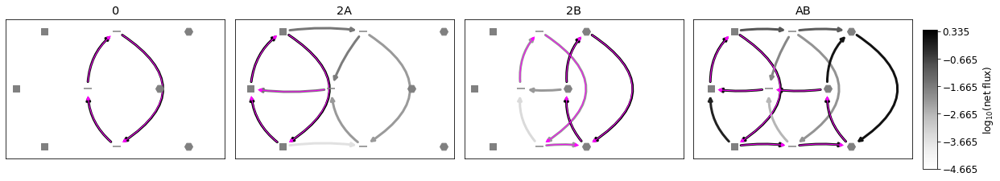

11672
[ 160.44969853    2.69389513 2210.89737896  205.37326437]
[160.44969853   2.69389513   5.61005399 205.37326437]
[ 160.44969853 2459.54645177 2210.89737896  205.37326437]
[3.241470756181143, 0.9464976369080195, [2.225160979452983, 2.5883168401031447, 12.702031519715025, 24.479208173902954]]


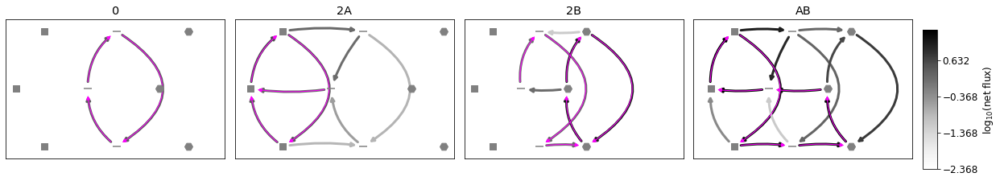

216
[1675.93966413   17.26127861 7269.70992141  544.71125277]
[1675.93966413   17.26127861  788.1534363   544.71125277]
[1675.93966413 8908.1995446  7269.70992141  544.71125277]
[2.6888952632049197, 0.1437610418439968, [14.635087715715288, 16.141463300016568, 94.21165795088051, 104.08329501571606]]


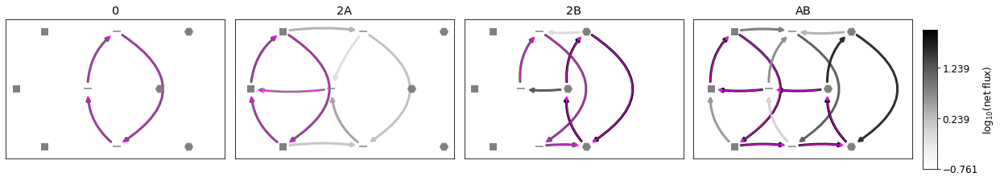

10993
[ 159.58666874    2.26761391 2061.57148933   35.41172938]
[159.58666874   2.26761391  35.54304036  35.41172938]
[ 159.58666874  318.29548469 2061.57148933   35.41172938]
[1.8431463210407264, 1.512720514469579, [1.1900547848013643, 1.973042330958319, 2.480872711672708, 7.079111161917139]]


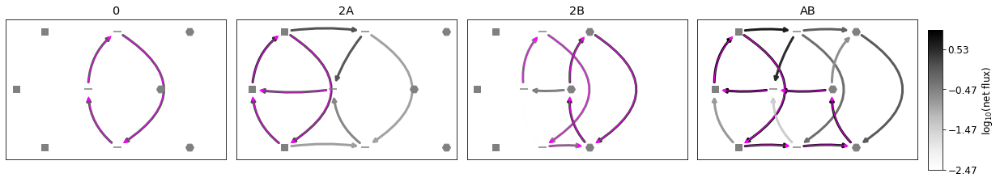

13665
[1.91490602e+02 1.12882643e+00 2.89680545e+03 7.37846988e+01]
[191.49060164   1.12882643   3.06292769  73.78469884]
[ 191.49060164  171.22044389 2896.80545046   73.78469884]
[3.3676372332548565, 1.3881743903107584, [0.9011644948658146, 1.1041367683786614, 4.354121697656767, 11.396793888127704]]


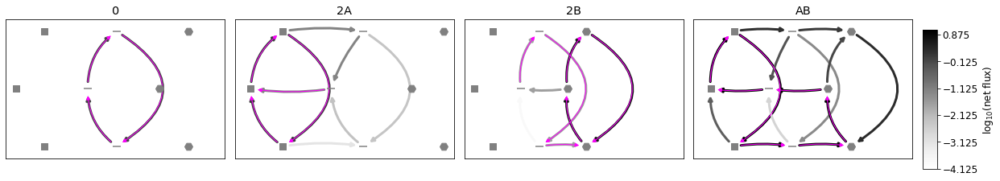

8516
[ 131.4343254    21.45328204 8386.75411955  293.7214049 ]
[131.4343254   21.45328204  31.59692374 293.7214049 ]
[ 131.4343254  8536.66675011 8386.75411955  293.7214049 ]
[0.3951595810581054, 2.312723676707673, [3.638073854916779, 16.541951063620974, 4.378672063245255, 21.75412495021065]]


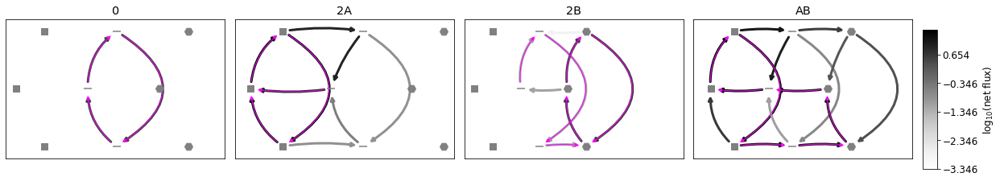

13933
[8.70123846e+01 1.35366347e+00 3.84440196e+03 5.01431188e+01]
[87.01238456  1.35366347 28.46297572 50.14311878]
[  87.01238456   21.72883594 3844.40196361   50.14311878]
[1.6781059250300865, 1.9751488425285375, [0.6055855867459174, 1.2812921185343655, 1.0428679641186807, 4.100231464948569]]


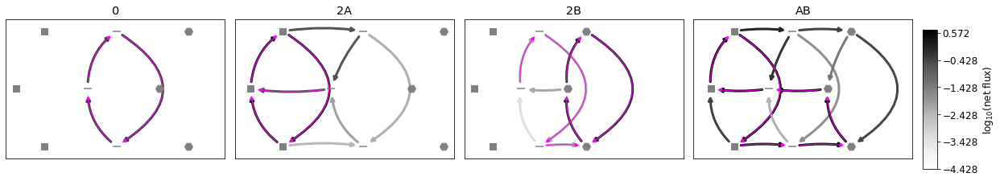

8976
[4.24026813e+02 4.07107222e+00 9.39725997e+03 2.04243419e+02]
[424.02681276   4.07107222  44.00977138 204.24341854]
[ 424.02681276  312.83538585 9397.25997021  204.24341854]
[1.9358320054938738, 0.8421841917367839, [2.7670361616610797, 3.934236292065179, 8.396170263450443, 15.052337261166105]]


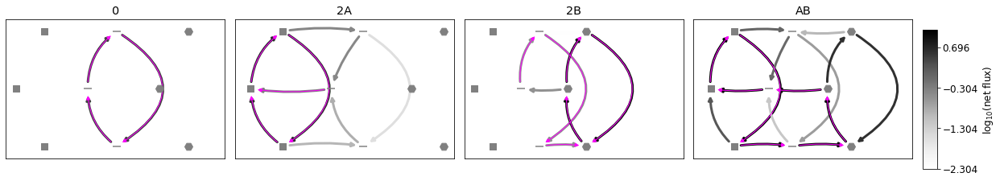

3395
[ 13.79910337   1.1121872  213.76302212   7.10799435]
[13.79910337  1.1121872   2.41565605  7.10799435]
[ 13.79910337  76.94130561 213.76302212   7.10799435]
[0.34126428162244504, 1.4188097644874549, [0.3037969052935668, 0.877318766057655, 0.41570371636215936, 1.111445583214416]]


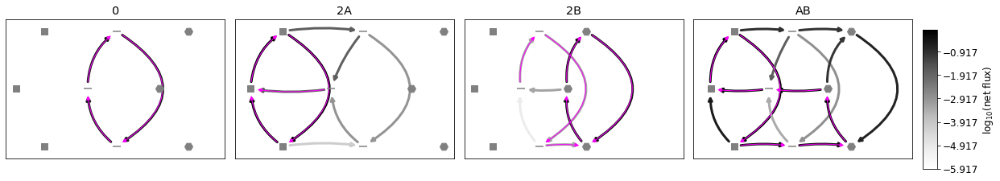

6793
[3.67485618e+02 3.86951326e+00 7.78168728e+03 2.52869503e+02]
[367.48561795   3.86951326  10.95350088 252.8695032 ]
[ 367.48561795   21.84190313 7781.68727637  252.8695032 ]
[1.1756758700403824, 0.21664350497104257, [2.866586095725004, 3.763971787227361, 7.317182183008927, 8.50276275633754]]


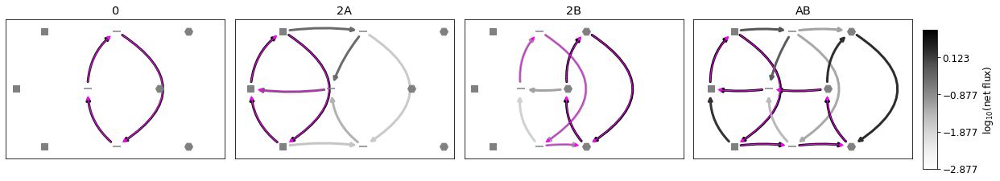

9867
[2.84596593e+01 1.45996333e+00 6.60865498e+03 4.74423655e+01]
[28.45965925  1.45996333 18.64418495 47.44236546]
[  28.45965925  279.08589024 6608.65497622   47.44236546]
[1.0996361370047834, 3.788126703248116, [0.17743827614345048, 1.3011109334135524, 0.20183571748413115, 2.788289015736279]]


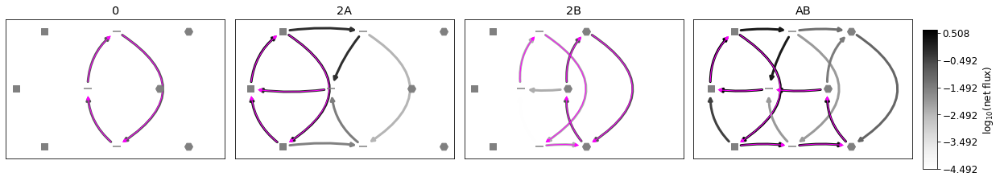

13179
[7.12803461e+01 1.08025348e+00 5.51950656e+03 6.34258982e+02]
[ 71.28034607   1.08025348 162.3080235  634.25898231]
[  71.28034607  248.92373416 5519.50656399  634.25898231]
[3.765513210121646, 1.0275517708924495, [0.9403800542588747, 1.057525344132313, 7.055037141233241, 14.38212998525334]]


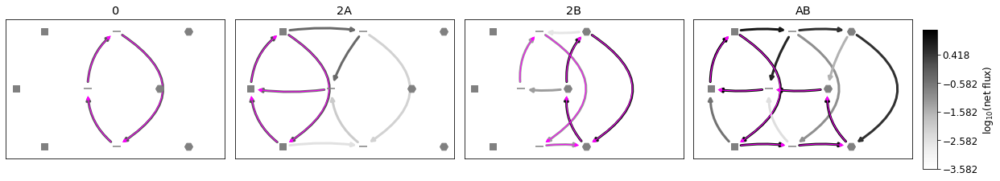

12738
[4.88466337e+01 2.05537100e+00 8.79391437e+03 1.09894566e+02]
[ 48.84663369   2.055371   164.63094358 109.89456626]
[  48.84663369  633.59034747 8793.9143685   109.89456626]
[1.2485119159844993, 2.8501114277611515, [0.46418384526163875, 1.8179234165031768, 0.599026574999715, 4.3193174158968235]]


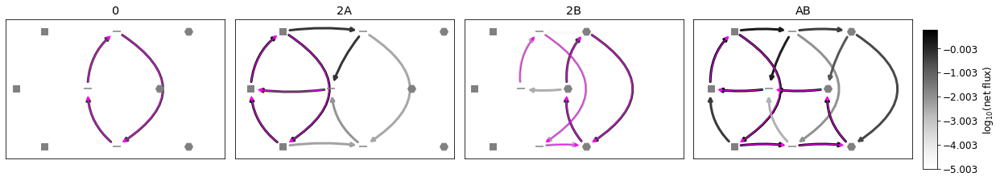

12119
[3.25008627e+01 1.72649200e+00 3.06316861e+03 1.93062511e+01]
[32.5008627   1.726492    5.47620052 19.30625114]
[  32.5008627  1164.96130248 3063.16860971   19.30625114]
[0.812957301258956, 3.6735222955985893, [0.18038973478190118, 1.462778255756659, 0.20140146628510494, 2.5698219173757653]]


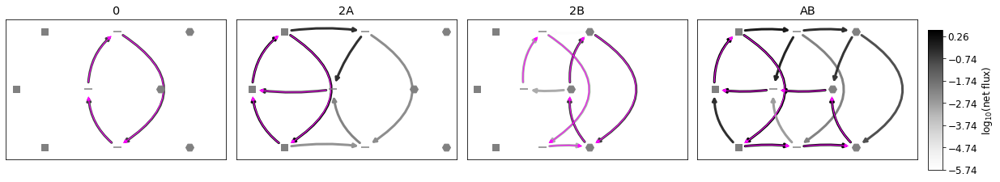

6646
[661.89069311  11.25050972 900.8315685  188.1784658 ]
[661.89069311  11.25050972   6.57210319 188.1784658 ]
[ 661.89069311 1674.81065662  900.8315685   188.1784658 ]
[2.8627649818157312, 0.15305322136407493, [9.714182326306505, 10.330079171347577, 67.57844114463619, 75.14183215519432]]


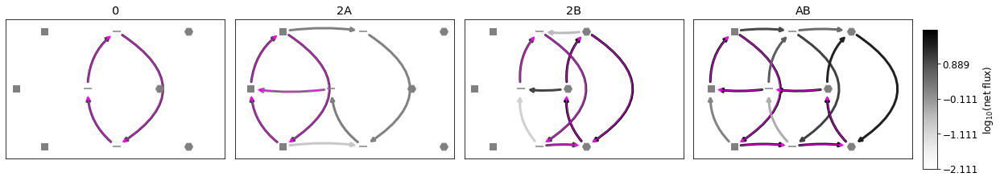

11669
[ 653.38820856    1.80287932 1013.43411535   32.23272728]
[653.38820856   1.80287932   1.38557231  32.23272728]
[ 653.38820856  590.50156872 1013.43411535   32.23272728]
[3.1091250155383987, 0.25962163264270505, [1.5739521771681635, 1.6561751535993539, 11.936919248723314, 14.290458231039947]]


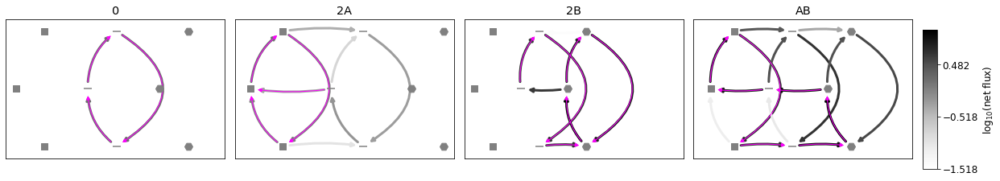

13090
[ 432.9759349     9.43619493 5229.89903094  240.89933585]
[432.9759349    9.43619493  16.14093469 240.89933585]
[ 432.9759349  1029.0364339  5229.89903094  240.89933585]
[2.1967029129724445, 1.212493400051105, [6.150941462755287, 8.77196194859699, 17.35295036310433, 40.21334571036086]]


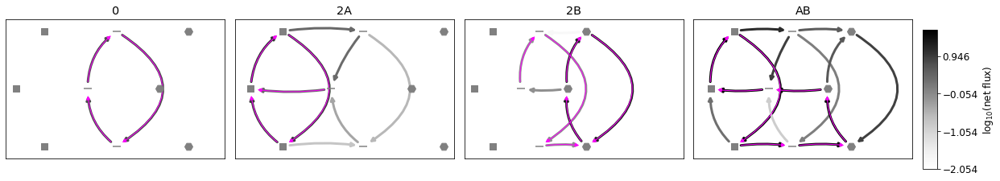

10777
[5.65386202e+02 1.11553697e+00 1.59598435e+03 1.21475258e+01]
[565.38620223   1.11553697 102.8453712   12.14752576]
[ 565.38620223  553.96265098 1595.98434675   12.14752576]
[2.406566285259042, 0.7329402080933755, [0.8244719204354282, 0.9833651620241556, 3.1370863214218065, 5.213909116947901]]


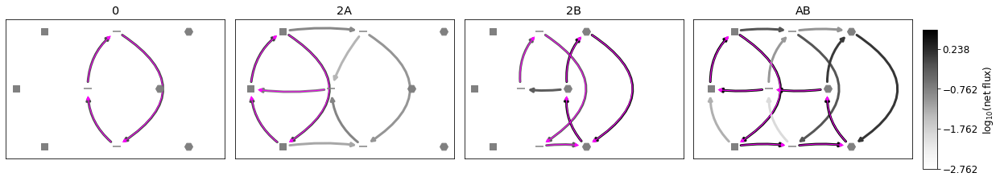

6998
[2.33966491e+03 1.67455611e+00 4.02548824e+03 1.74974609e+01]
[2.33966491e+03 1.67455611e+00 1.88891996e+02 1.74974609e+01]
[2339.66490591  632.20589672 4025.48823666   17.49746093]
[2.689787154009309, 0.6126754819474952, [1.3278755687326973, 1.5030798043317999, 6.34241940485655, 9.698144593219663]]


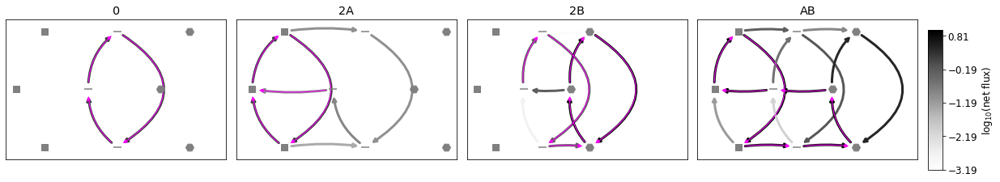

8704
[  79.31023304    1.18494374 1075.86912765   71.33166663]
[79.31023304  1.18494374 13.88597527 71.33166663]
[  79.31023304   31.82088603 1075.86912765   71.33166663]
[2.572670125544796, 0.7565901842596734, [0.9427538955702728, 1.1407083112152332, 4.016697654548725, 6.7861816823888]]


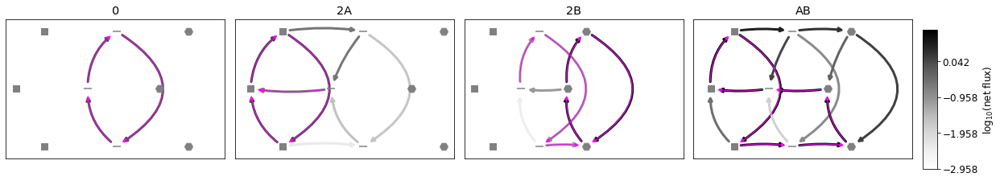

13858
[1.03297828e+02 2.92114980e+00 9.83088665e+03 2.41326109e+02]
[103.29782757   2.9211498   24.47293    241.32610906]
[ 103.29782757  514.75871684 9830.88664793  241.32610906]
[2.40553841061955, 2.590405032647838, [1.33241058736275, 2.7711446980301098, 2.4378602440085873, 14.682446289414028]]


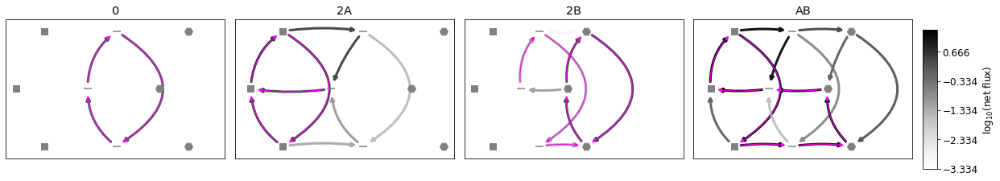

13773
[1.22869284e+02 1.77588509e+00 8.32518606e+03 1.13337952e+03]
[ 122.86928426    1.77588509  503.52025743 1133.37952139]
[ 122.86928426  450.60180228 8325.18606275 1133.37952139]
[3.681734498252365, 0.6646083275524555, [1.5825208465141742, 1.7312903330482192, 14.015719012430395, 22.21684699623851]]


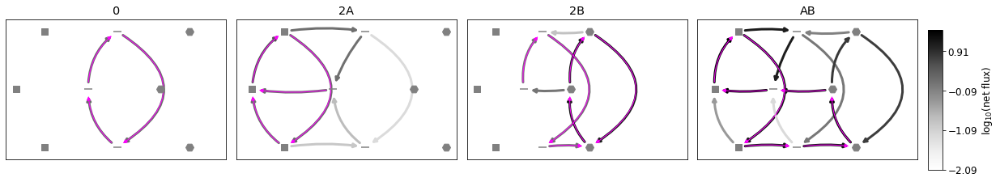

4840
[ 90.27186157   1.17214119 445.07352528   1.95582678]
[90.27186157  1.17214119  7.32437585  1.95582678]
[ 90.27186157 645.27873001 445.07352528   1.95582678]
[0.33443866631694635, 1.3343336333741884, [0.25664904873906075, 0.6567660066132398, 0.32840691153931784, 0.8281075351787035]]


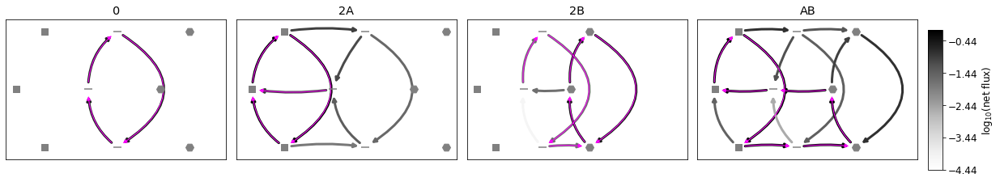

5624
[4.69612401e+01 1.19816237e+00 2.41663331e+03 2.38706352e+02]
[  46.9612401     1.19816237 1015.73928718  238.706352  ]
[  46.9612401   100.74681742 2416.63330846  238.706352  ]
[2.1087745000882565, 0.18683720360374403, [0.9296495102329082, 1.0512081723043665, 3.9833595100615162, 4.534121014381796]]


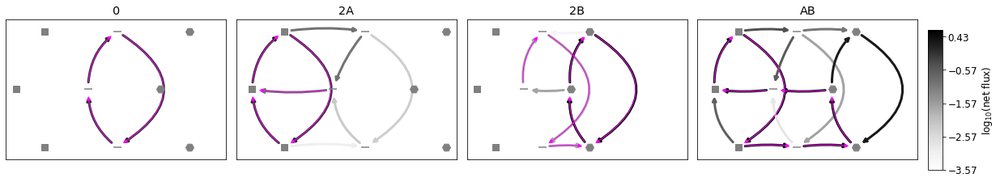

9432
[2.21289702e+02 1.56429240e+00 9.40072489e+03 7.43880879e+01]
[221.28970195   1.5642924  180.6105764   74.38808787]
[ 221.28970195  270.61208899 9400.72489405   74.38808787]
[1.3705360280608647, 1.0259685516679875, [0.8141278014504689, 1.2781686387138993, 1.6229805057238509, 3.3049174184275723]]


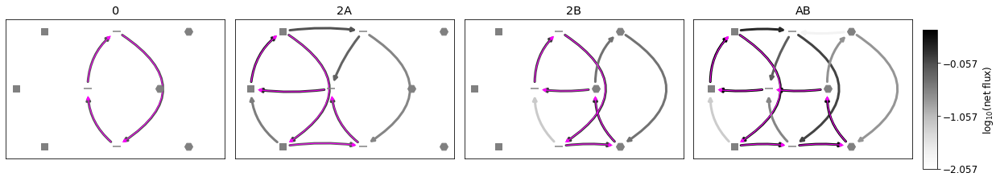

9124
[1.25851615e+03 6.33543990e+00 9.80768150e+03 2.79138016e+01]
[1258.5161517     6.3354399    52.55838967   27.91380157]
[1258.5161517   104.826697   9807.68150071   27.91380157]
[0.5715466740504422, 1.299448873152443, [2.111289712690141, 5.09034856589828, 3.073456892473172, 7.564848150671136]]


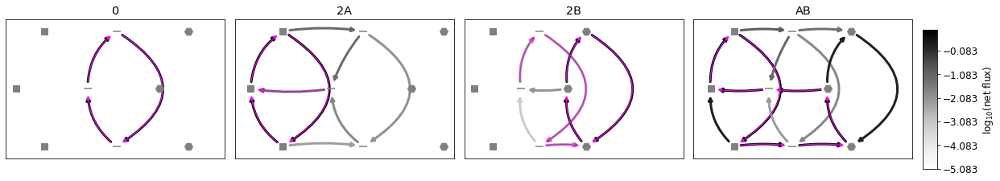

14169
[7.22553242e+01 1.45719422e+00 3.63065366e+03 1.98235073e+01]
[72.25532424  1.45719422  7.21269728 19.82350734]
[  72.25532424 1006.38957773 3630.65366367   19.82350734]
[1.5487361284590246, 3.2880710647785887, [0.3043879244982589, 1.2841231517420046, 0.3846047890337282, 3.7568400586008743]]


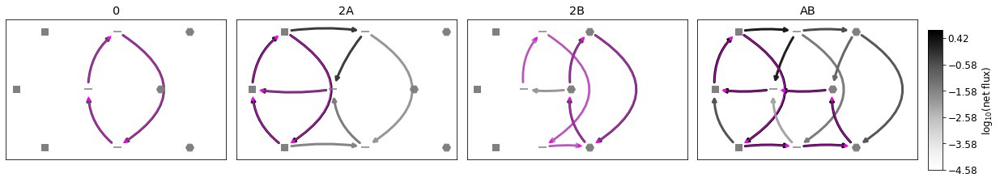

10739
[6.69021174e+01 1.00819857e+00 6.19870949e+03 1.13486102e+02]
[ 66.90211738   1.00819857  20.84608843 113.48610177]
[  66.90211738  386.27247187 6198.70949209  113.48610177]
[2.9945418069096226, 2.717963771142488, [0.5458346749746378, 0.979540461495235, 1.1865353044389528, 7.806732296744741]]


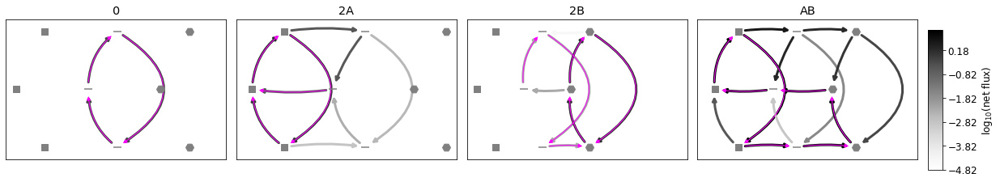

7820
[1.48157417e+03 1.16937658e+00 4.03071482e+03 9.85027733e+00]
[1.48157417e+03 1.16937658e+00 1.82565914e+02 9.85027733e+00]
[1481.57417417   39.14046007 4030.71482109    9.85027733]
[1.9489056486752137, 0.671859640691998, [0.8106730620975497, 1.0155051086936444, 2.460998034186351, 3.9206779618495182]]


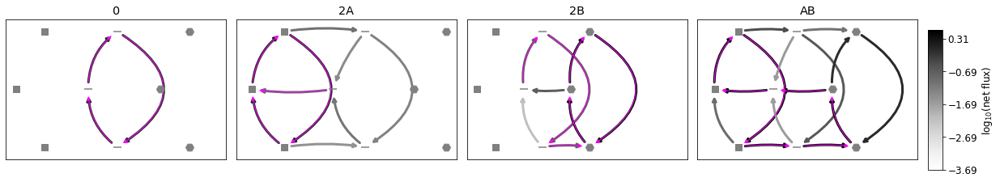

9132
[3.42178491e+03 2.40210144e+00 3.09864120e+03 2.36424608e+01]
[3.42178491e+03 2.40210144e+00 1.60590573e+01 2.36424608e+01]
[3421.78490506 1129.6852398  3098.64120456   23.64246084]
[2.804172634390084, 0.3137902855561243, [2.011289076388425, 2.1757343906511917, 12.226035827459233, 15.196583209798234]]


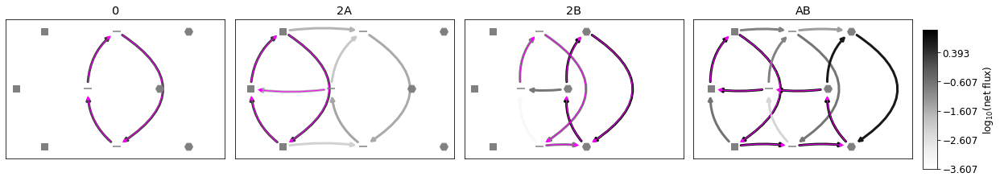

13284
[4.25335089e+01 1.77133326e+00 5.78656408e+03 2.50132966e+01]
[42.53350889  1.77133326 11.63797865 25.01329657]
[  42.53350889  109.86108424 5786.56407798   25.01329657]
[0.7928309613179725, 3.840765877761165, [0.16482527580589135, 1.5001688227735683, 0.18139290698672833, 2.5989985448972326]]


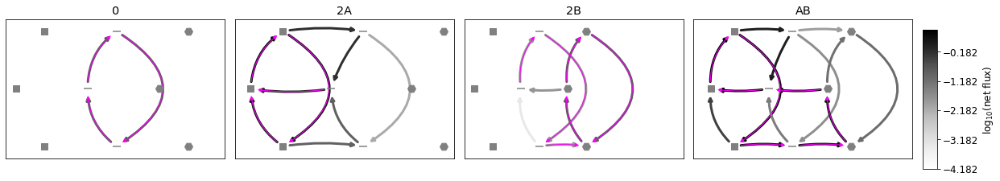

4043
[2160.00050288   21.174818   4857.07217893  649.10693119]
[2160.00050288   21.174818    664.2085826   649.10693119]
[2160.00050288 3431.39618587 4857.07217893  649.10693119]
[3.132162146055574, 0.03140577399632748, [18.97761488552036, 19.974675045957863, 171.35642781176506, 175.12755323966184]]


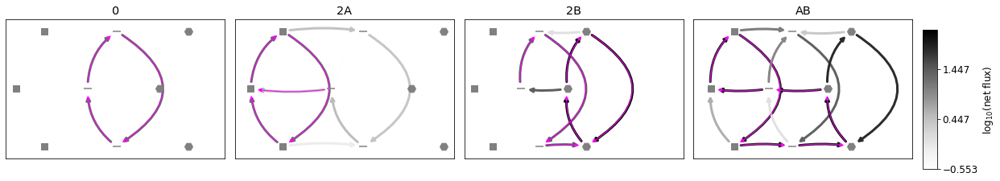

6454
[3.66879871e+02 1.70921333e+00 2.54290201e+03 6.73218776e+01]
[366.87987132   1.70921333   4.42612786  67.32187761]
[ 366.87987132 1131.28270429 2542.90201476   67.32187761]
[3.3617897366853176, 1.0388793489270078, [1.4172342297659926, 1.6425512810097689, 8.21835015762902, 16.885677372000767]]


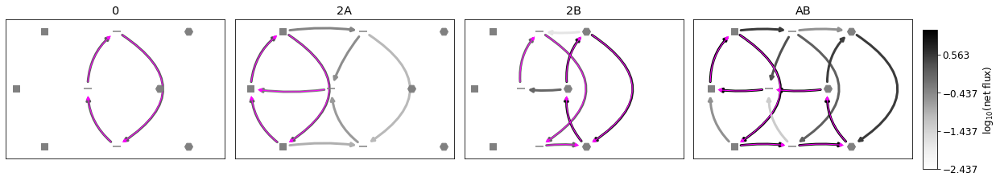

9559
[2.98500340e+01 1.62443695e+00 2.22849552e+03 1.62351682e+02]
[ 29.85003405   1.62443695   2.6302049  162.35168193]
[  29.85003405   35.42188669 2228.49552019  162.35168193]
[1.550938529525186, 1.2319249680951554, [0.8967791263307402, 1.518011341264298, 1.8936846866815242, 4.447889967395384]]


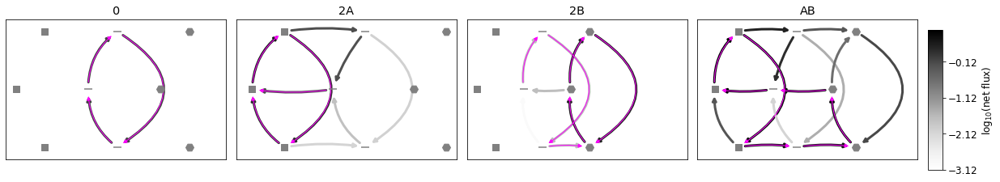

6218
[ 453.59499464    5.07139775 2753.29709674   53.4085919 ]
[453.59499464   5.07139775 256.06036301  53.4085919 ]
[ 453.59499464 2805.18152591 2753.29709674   53.4085919 ]
[1.1939102620931703, 0.4066291350578378, [3.01419444696052, 4.273663339877867, 7.375569193118932, 9.776943566840623]]


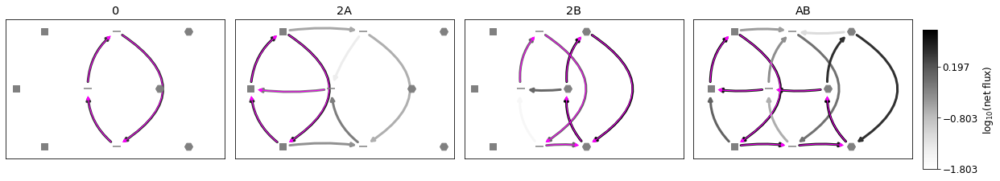

11870
[ 101.0214406     1.32368634 1278.06523254   97.28903232]
[101.0214406    1.32368634   9.06698112  97.28903232]
[ 101.0214406   104.82012437 1278.06523254   97.28903232]
[3.3119885645850013, 1.0291636690457366, [1.1041389573369729, 1.285396813220209, 6.255124919074622, 12.765714344726145]]


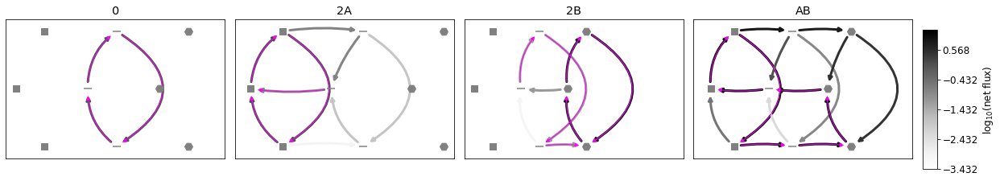

14083
[1.82398830e+02 1.06976904e+00 8.07569494e+03 1.98413490e+02]
[182.39883005   1.06976904 628.76869552 198.41349019]
[ 182.39883005  143.84804535 8075.69493913  198.41349019]
[3.3593168253232086, 1.357947026818504, [0.8558358034933436, 1.0378176028488695, 4.1552137980684085, 10.650651197430292]]


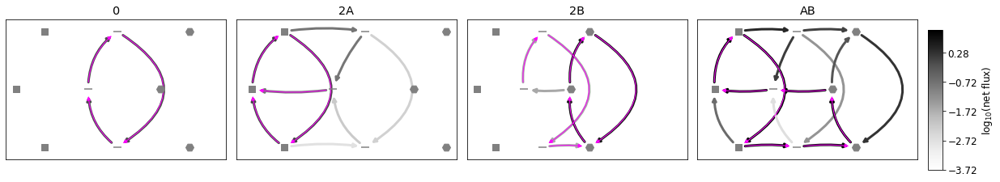

13527
[4.41375706e+02 1.29653392e+00 8.49540329e+03 1.14600792e+02]
[441.37570582   1.29653392  70.03190522 114.60079232]
[ 441.37570582   74.35677032 8495.40329421  114.60079232]
[3.436986492868752, 1.4097831806734529, [1.0523747442155833, 1.274256193721782, 5.194045592798795, 13.800435202252698]]


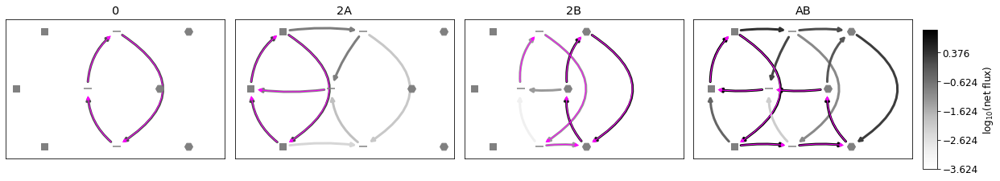

12996
[6.10770715e+01 1.18715063e+00 6.10606206e+03 1.00531837e+02]
[ 61.07707152   1.18715063 237.50942152 100.53183667]
[  61.07707152  412.66227569 6106.06205898  100.53183667]
[2.1301899929150636, 2.287609714073288, [0.5367355806003696, 1.0898113591670295, 0.9771545807921229, 4.770923079654065]]


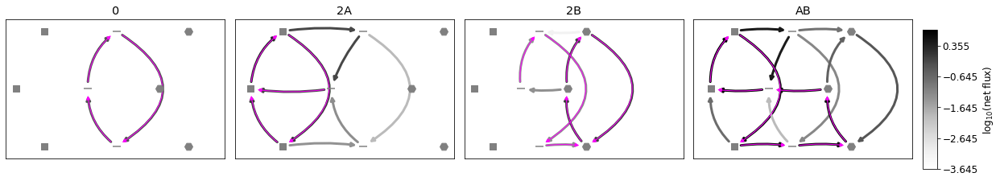

6744
[1.05937333e+03 2.69129281e+00 6.93474585e+03 2.86486872e+00]
[1059.37332985    2.69129281  107.56048125    2.86486872]
[1.05937333e+03 2.58214677e+01 6.93474585e+03 2.86486872e+00]
*****negative SAB
[-0.07827291248560309, 1.7329080193881607, [0.33261055068567097, 1.3124798021250568, 0.3740010665236711, 1.2431688921353394]]


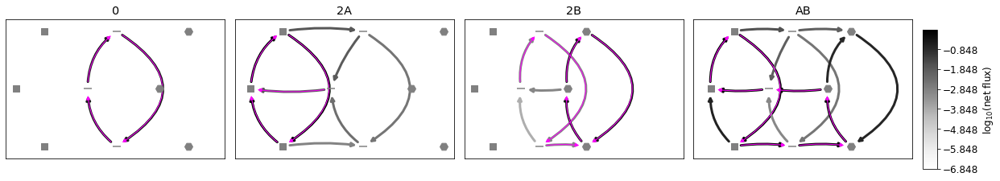

6431
[5.44735568e+02 2.10359825e+00 9.69530117e+03 8.68085337e+01]
[544.73556789   2.10359825  30.86249506  86.80853368]
[ 544.73556789   52.61271338 9695.30116938   86.80853368]
[2.5238193646647864, 1.467653814833619, [1.4414221443577218, 2.0137770130751353, 4.18744282280839, 11.581283997292097]]


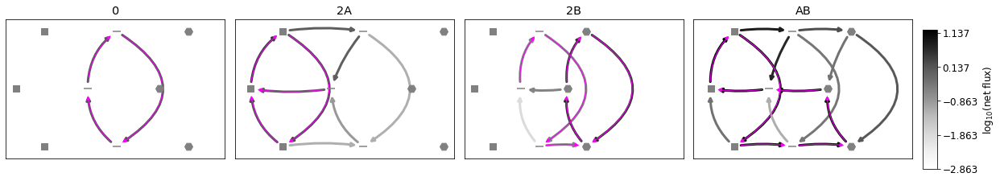

8779
[3.00615308e+03 1.14700328e+00 1.84884549e+03 1.36317050e+01]
[3.00615308e+03 1.14700328e+00 4.14547363e+02 1.36317050e+01]
[3006.15308206 1042.22631784 1848.84548825   13.63170497]
[3.002837730978424, 0.012732564018393481, [1.0094432932626878, 1.0355894626585251, 8.228088764152627, 8.301027486064818]]


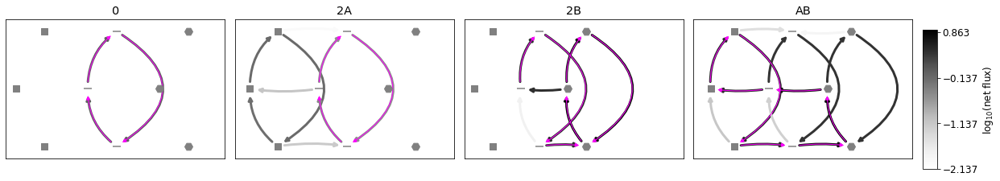

14160
[4.67917760e+02 1.15066364e+00 3.33790094e+03 9.04887728e+01]
[467.91776      1.15066364  16.6500624   90.48877276]
[ 467.91776     175.61156398 3337.90094447   90.48877276]
[4.032237300150736, 0.8606058566148496, [1.040490552101451, 1.123242168189251, 10.12114388261243, 18.37798006645394]]


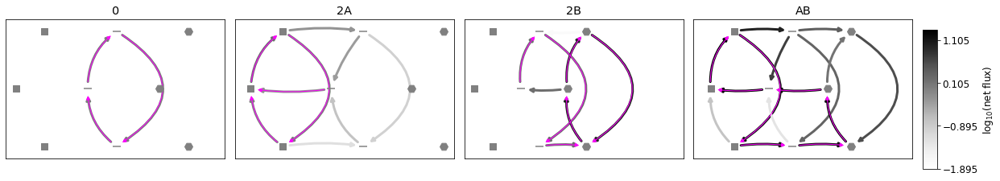

10118
[1.37137780e+02 1.07238418e+00 7.74264810e+03 6.65312100e+01]
[137.13778036   1.07238418  68.19795132  66.53120996]
[ 137.13778036  324.2706839  7742.64810394   66.53120996]
[2.6859002545948285, 2.529129241878696, [0.5544983607864423, 1.025042237604241, 1.1427060808340372, 6.595964402806112]]


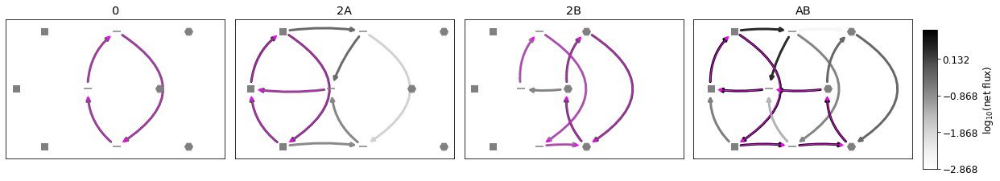

1710
[ 39.84803624   2.41519047 544.58214088  10.92052563]
[39.84803624  2.41519047 29.11062197 10.92052563]
[ 39.84803624  47.58350079 544.58214088  10.92052563]
[0.010621470323088524, 0.6805492884761924, [0.5611167246065168, 1.1055050334791543, 0.6948520707586193, 1.1136740635882285]]


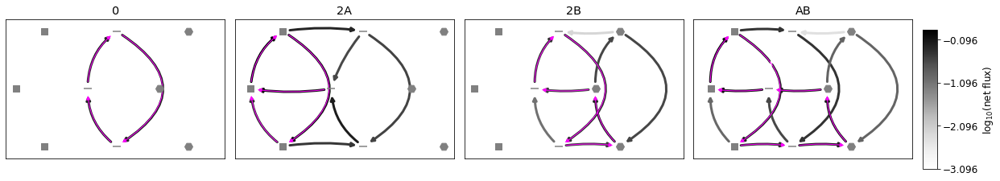

8272
[2.94566596e+03 3.09751757e+00 5.41578391e+03 5.12316429e+00]
[2945.66595876    3.09751757    5.83810808    5.12316429]
[2.94566596e+03 2.65819793e+03 5.41578391e+03 5.12316429e+00]
[0.7593962661308852, 0.8483903018045938, [1.139935655317383, 1.9171930120873766, 1.8025028630078561, 3.245389988334644]]


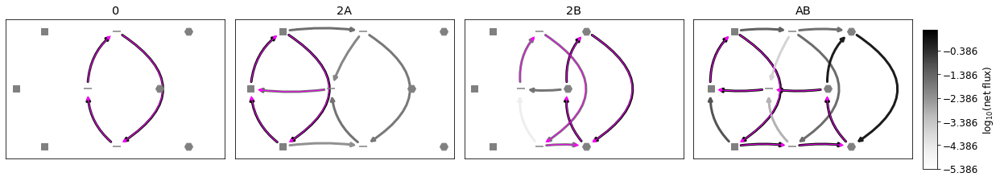

4487
[208.03777929  16.81015619 209.16195949 158.52873491]
[208.03777929  16.81015619  29.81469707 158.52873491]
[ 208.03777929 4339.48352132  209.16195949  158.52873491]
[2.1575307311979404, 0.13150044121864832, [12.996336191261628, 13.845171451717631, 56.388978538877026, 61.770313409158724]]


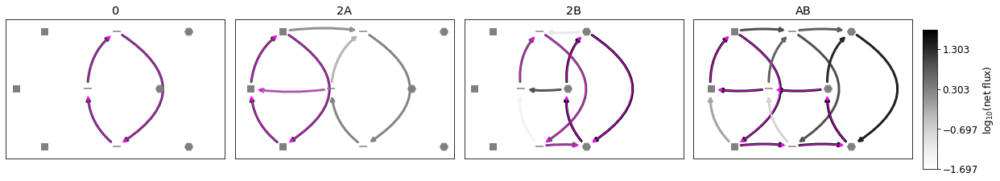

13128
[6.72870538e+01 1.05309994e+00 5.52286702e+03 2.59188453e+01]
[67.28705383  1.05309994 75.64768041 25.91884535]
[  67.28705383  826.98199902 5522.86701946   25.91884535]
[1.649003103445413, 3.255059490864699, [0.23981978637853194, 0.9449742871335396, 0.31041939212313063, 2.9635986518182103]]


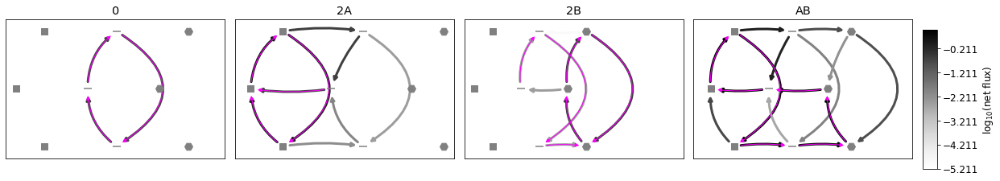

14240
[1.76392371e+02 1.21813720e+00 6.51690858e+03 1.91965275e+02]
[176.39237124   1.2181372   58.09245718 191.96527518]
[ 176.39237124   99.57022253 6516.90857679  191.96527518]
[3.6101638371110782, 1.6414649119611617, [0.9763113106117304, 1.1955493568699018, 4.67955912741721, 14.59940358682964]]


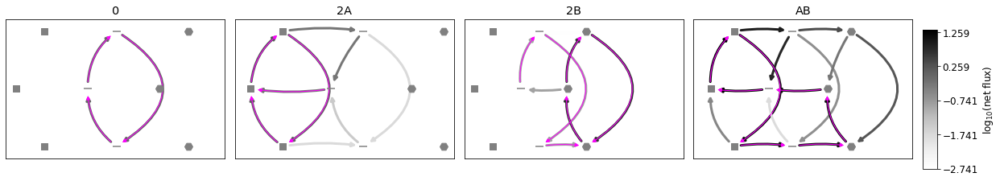

13349
[3.38795572e+02 1.28711914e+00 4.86736125e+03 1.48417029e+02]
[338.79557238   1.28711914 186.11052821 148.41702893]
[ 338.79557238  263.15893663 4867.36125486  148.41702893]
[3.8376800054032327, 0.9954979127466485, [1.131967568754429, 1.2629916259404885, 9.05696175983154, 18.05748515218102]]


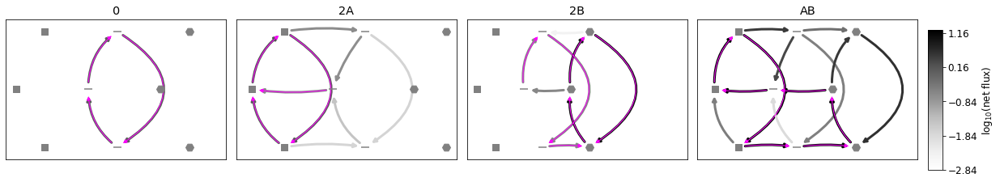

6384
[1.23265365e+01 1.20841332e+00 3.26642490e+03 3.13828763e+02]
[ 12.32653645   1.20841332  11.25703749 313.82876333]
[  12.32653645 1044.2053507  3266.4248982   313.82876333]
[1.4031386303536564, 1.420995502982033, [0.5694029701596149, 1.0890366779043485, 1.0756402684298563, 2.880244278000065]]


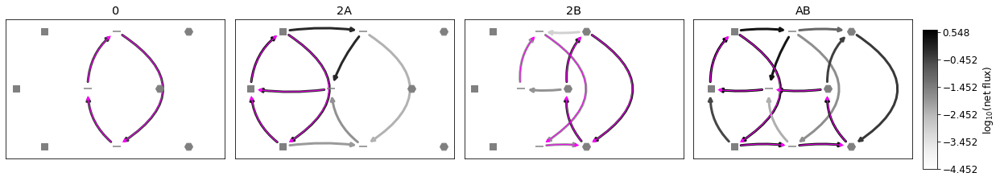

9948
[7.99650616e+02 4.65391263e+00 5.89628688e+03 2.99149986e+01]
[799.65061582   4.65391263  33.05910256  29.91499859]
[ 799.65061582 4095.56375409 5896.28687746   29.91499859]
[1.5481118541278296, 1.6672491888384036, [2.0159831024215165, 3.8590901469345886, 3.5532111176076717, 11.285297917474141]]


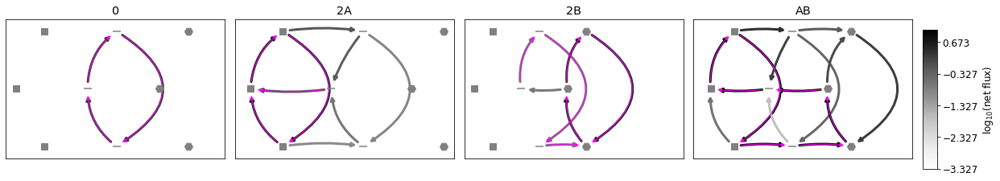

613
[7.61163741e+03 1.38443346e+00 2.73968112e+00 1.10038315e+00]
[7.61163741e+03 1.38443346e+00 1.01082758e+00 1.10038315e+00]
[7.61163741e+03 5.70751788e+02 2.73968112e+00 1.10038315e+00]
[0.834702602864555, -0.005735027224076424, [0.6129141108748263, 0.6129882828816063, 1.097612664323113, 1.093258075710673]]


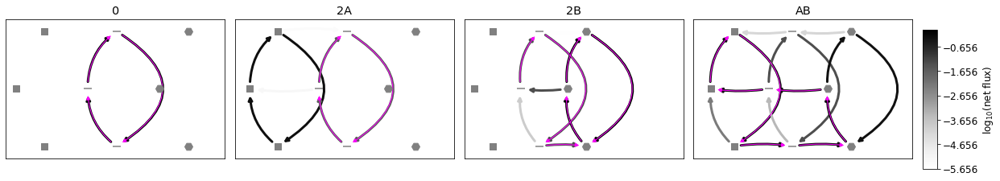

12278
[2.26680708e+02 3.00722263e+00 6.66997403e+03 1.07061862e+02]
[226.68070783   3.00722263  29.74799883 107.06186172]
[ 226.68070783  501.95101574 6669.97403134  107.06186172]
[2.4335759034720827, 2.148424603802673, [1.6099912873499325, 2.821733281379073, 3.438389366477744, 15.243872379024673]]


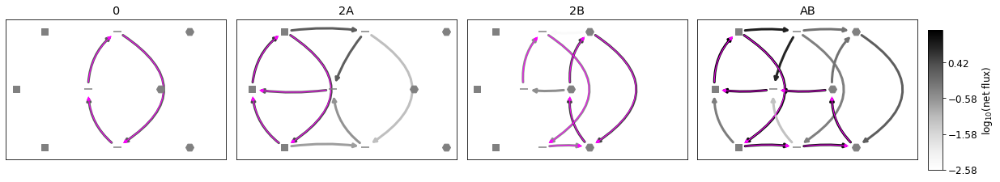

9149
[7.97805533e+02 2.11305465e+00 5.19539065e+03 1.18670977e+01]
[797.80553261   2.11305465   7.34806395  11.86709768]
[ 797.80553261   48.59817848 5195.39065177   11.86709768]
[0.923259680259745, 1.1460706361658126, [0.9029172215462915, 1.7816698897380991, 1.5267026498386878, 3.3787503058306436]]


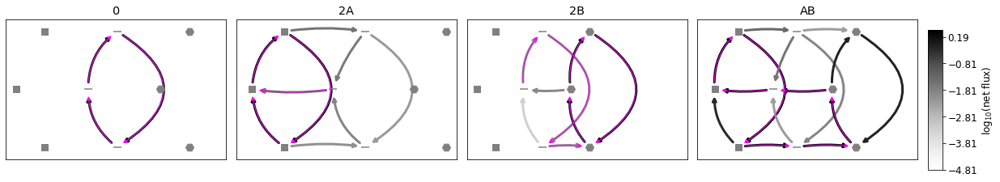

9397
[3.83949927e+02 1.66148096e+00 3.51469348e+03 8.15784727e+01]
[383.94992667   1.66148096  21.42720548  81.57847271]
[ 383.94992667  490.5689056  3514.69348087   81.57847271]
[2.992880438456802, 0.7345659867308092, [1.3718422151791736, 1.6187685372545382, 7.744709716247343, 12.88639798946795]]


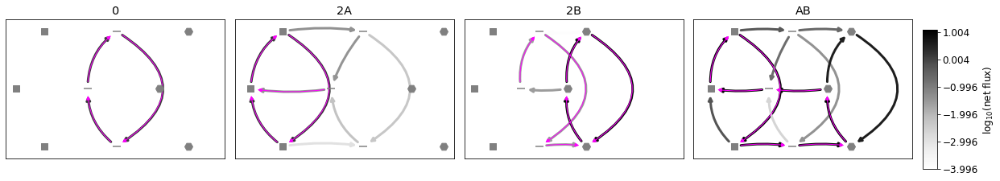

9824
[4.16918710e+01 1.20564031e+00 1.58918280e+03 1.38807564e+01]
[41.69187104  1.20564031 11.5270885  13.88075638]
[  41.69187104    3.7012303  1589.18279677   13.88075638]
[0.3570328293223014, 2.0448218622950725, [0.27236689773993394, 1.0344628995045606, 0.32109962195230857, 1.3249287088616082]]


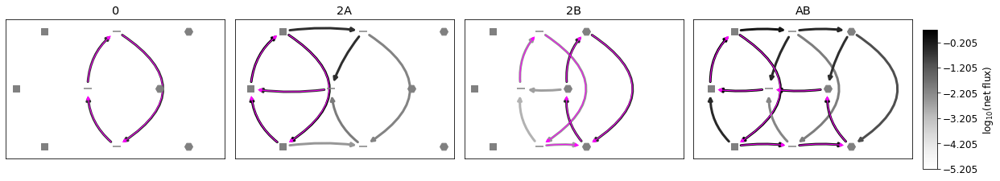

7045
[8.38373376e+02 2.24803242e+00 7.41160467e+03 1.00341154e+02]
[838.37337554   2.24803242  15.37795652 100.34115356]
[ 838.37337554  613.28965271 7411.6046673   100.34115356]
[2.334480724004911, 0.1571831590406374, [1.837910147819518, 2.1910629615490556, 9.91029846096836, 11.051050911559951]]


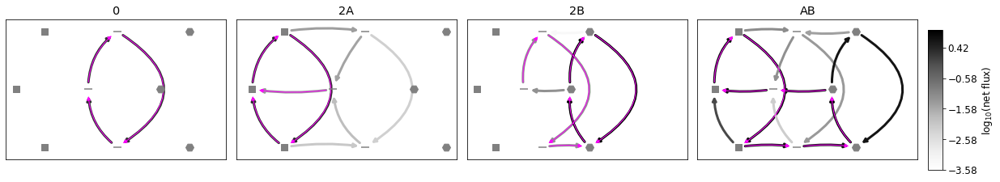

5742
[4.23945199e+02 1.26274436e+00 1.60346521e+03 2.36311764e+01]
[423.94519869   1.26274436  84.3419697   23.63117637]
[ 423.94519869  609.99852388 1603.4652088    23.63117637]
[2.5360397290376366, 0.49640981341101226, [1.0033562800877698, 1.1772697113351396, 4.840227283108582, 6.828101987742739]]


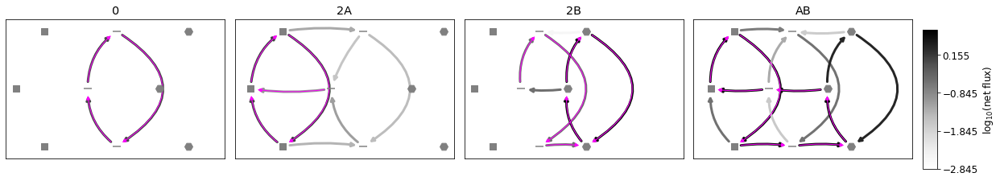

2520
[ 481.79375522    2.29502882 1743.93661625   96.2668354 ]
[481.79375522   2.29502882  18.46433997  96.2668354 ]
[ 481.79375522  153.03672147 1743.93661625   96.2668354 ]
[3.1617213720611184, 0.1755329183676645, [2.0585103645244205, 2.2281416151267543, 17.655299422688707, 19.939568738728575]]


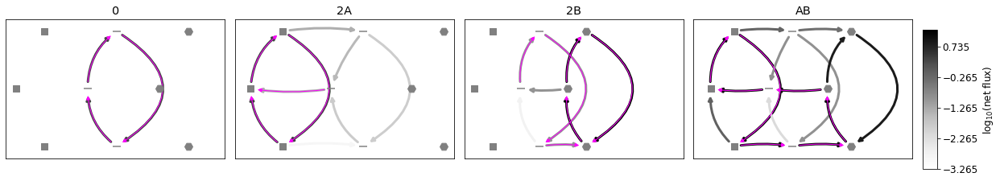

9040
[2.71269332e+01 1.75303552e+00 3.53552816e+03 6.44297398e+01]
[27.12693321  1.75303552 73.7168415  64.42973975]
[  27.12693321 1493.38370976 3535.52816367   64.42973975]
[0.73011160024467, 2.321535301418394, [0.37797321345035817, 1.4507245205600767, 0.4814139622849081, 2.406414542933243]]


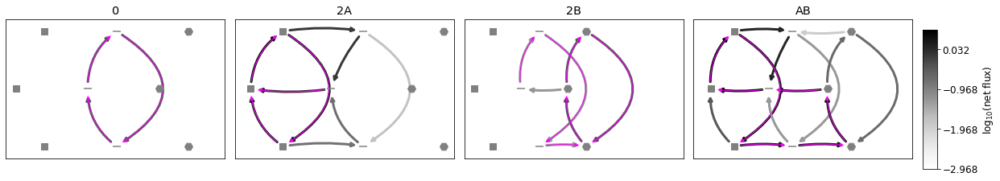

5263
[ 30.78919311   1.45742462 158.88503675  21.41363369]
[30.78919311  1.45742462  6.81450457 21.41363369]
[  30.78919311 1449.84589823  158.88503675   21.41363369]
[1.6401021874522708, 0.2847018525731862, [0.9937321577215389, 1.1920659184945799, 3.050116505810173, 3.715525326093432]]


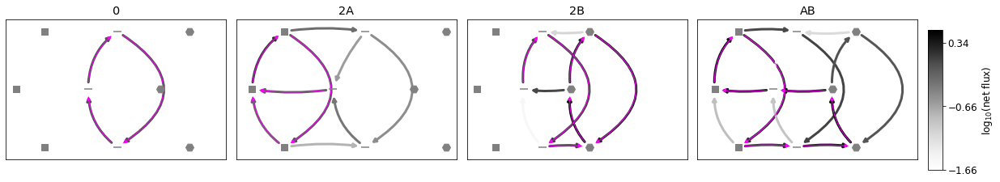

11648
[6.28316302e+02 1.50387048e+00 6.67976071e+03 4.08608569e+01]
[628.31630205   1.50387048 126.85244027  40.86085692]
[ 628.31630205  138.25802062 6679.76070994   40.86085692]
[2.7364127218581835, 1.4636111125126074, [1.0513075389925015, 1.4066079796543263, 3.398791627635445, 9.373793599807623]]


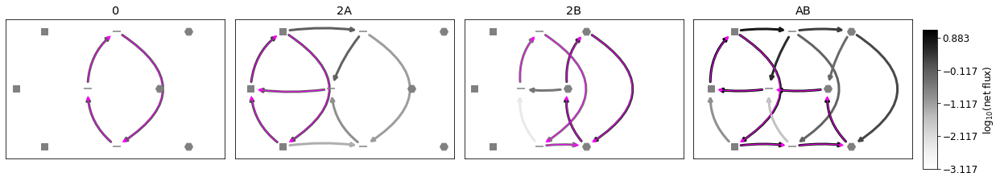

5610
[5.42666476e+03 5.97301277e+00 7.14629275e+03 5.41722489e+01]
[5426.66475873    5.97301277 1231.3002879    54.17224888]
[5426.66475873 5863.30468818 7146.2927535    54.17224888]
[2.5132492534883997, 0.34668180795763315, [4.753465645198046, 5.15790273691666, 23.1566076372429, 29.446695145652846]]


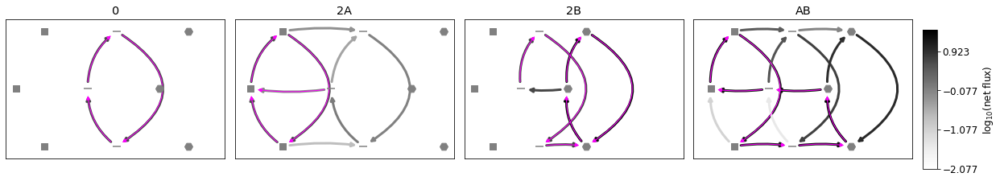

5047
[ 259.08280455   14.62189598 1487.37732168  749.47079483]
[259.08280455  14.62189598 208.51479642 749.47079483]
[ 259.08280455 3338.64945205 1487.37732168  749.47079483]
[2.6740239834825705, 0.1624913926056815, [12.308508513575052, 13.265775001018422, 75.64483361438694, 84.66307830989052]]


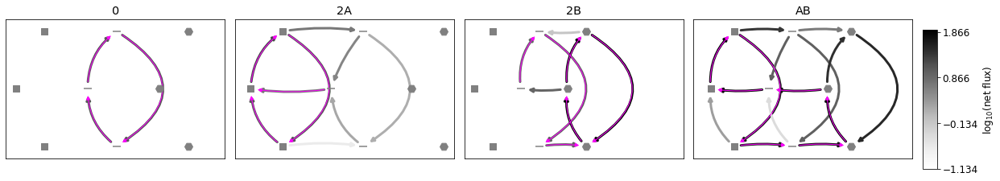

8880
[ 98.6386925    1.27635994 654.60745951  34.31847569]
[98.6386925   1.27635994  4.02397236 34.31847569]
[ 98.6386925   18.85736742 654.60745951  34.31847569]
[1.9137949487210906, 0.3919384101175877, [0.9841238581555145, 1.196011082946973, 3.4344695582432845, 4.506557215000482]]


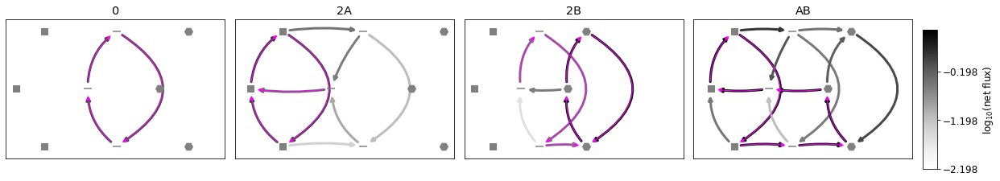

10578
[  65.55262888    1.47307146 1214.07394595  163.84005867]
[ 65.55262888   1.47307146  12.01135017 163.84005867]
[  65.55262888  519.40838339 1214.07394595  163.84005867]
[3.3390383793867686, 0.9743666381012314, [1.2296298784798827, 1.4240792535146918, 7.334513014900688, 14.41069307197289]]


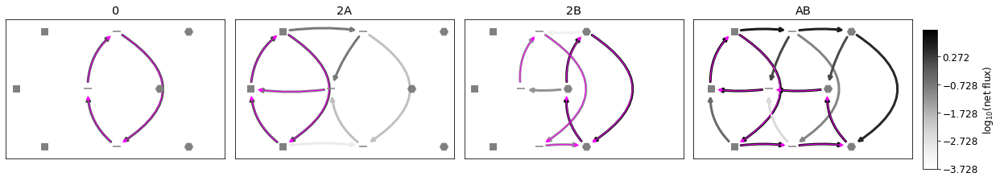

4633
[1.46944851e+03 1.01365189e+00 2.08172432e+03 1.01840151e+01]
[1.46944851e+03 1.01365189e+00 2.11851766e+00 1.01840151e+01]
[1469.44850909   79.3527247  2081.72432403   10.18401507]
[2.547091419164465, 0.4230442790060437, [0.8166512804787379, 0.9088836931295611, 3.9619611526114498, 5.312014237797249]]


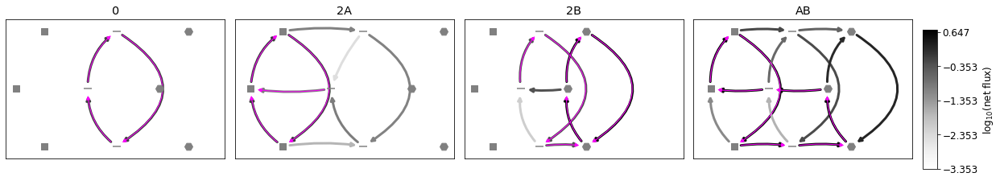

11782
[2.44089569e+01 1.96866437e+00 2.17620833e+03 5.87628363e+01]
[24.40895692  1.96866437 23.45382932 58.76283634]
[  24.40895692   26.36453894 2176.20832744   58.76283634]
[0.7925830408685806, 2.258228927527944, [0.48003889957633306, 1.7120630604087768, 0.6198925002652761, 2.96558943855458]]


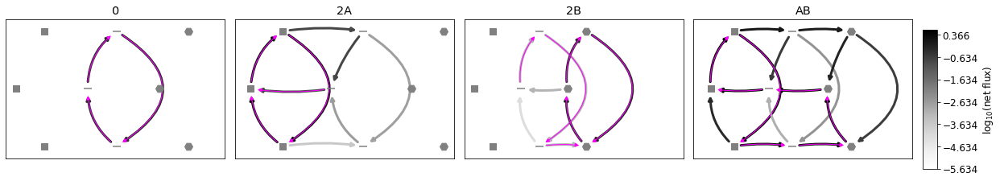

846
[  86.80450328   25.25824567 8629.18988256   80.35990372]
[ 86.80450328  25.25824567 518.38682247  80.35990372]
[  86.80450328 9569.19410962 8629.18988256   80.35990372]
*****negative SAB
[-0.6122776344261841, 2.4177417266755827, [0.7688709707078928, 6.476655194154067, 0.7929103037017877, 4.236789069138235]]


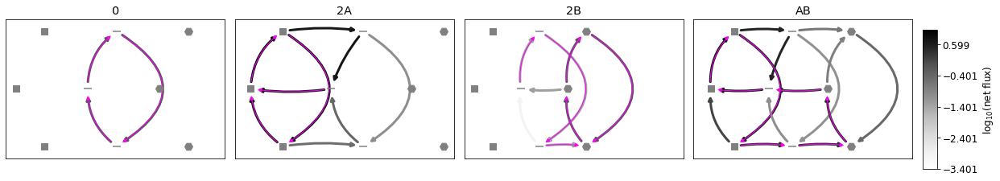

12922
[8.10798303e+01 1.59678047e+00 6.17345702e+03 9.92245697e+02]
[ 81.07983033   1.59678047  41.06598275 992.24569746]
[  81.07983033  849.03843684 6173.45701903  992.24569746]
[3.6943835713551767, 0.8827920347845419, [1.3959909697551498, 1.5605283085568822, 10.955823810530205, 20.20188626801938]]


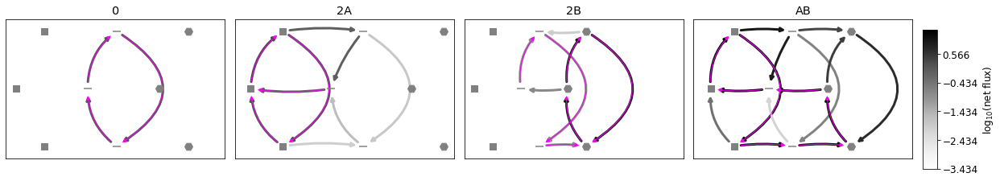

3560
[68.92791997  7.30823125 68.1701843  30.06266701]
[68.92791997  7.30823125  6.25775731 30.06266701]
[ 68.92791997 271.22699676  68.1701843   30.06266701]
[1.2511565958897155, 0.08156788102850687, [4.597660031715692, 5.235457559851814, 11.77703400905158, 12.4620734916721]]


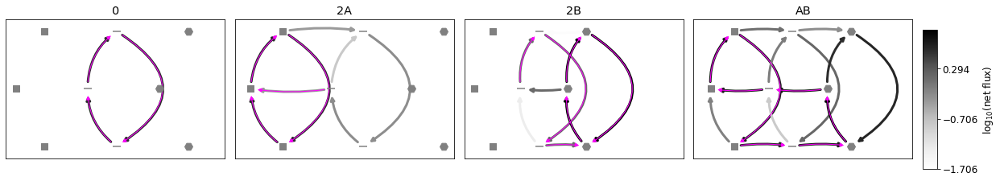

9309
[ 332.6631722     6.25413575 2463.14139459  267.53207395]
[332.6631722    6.25413575   4.77652037 267.53207395]
[ 332.6631722  1562.15131366 2463.14139459  267.53207395]
[2.585867540174808, 0.33231721509227524, [5.146297542828734, 5.975044263737035, 28.492291016260033, 35.872762425522815]]


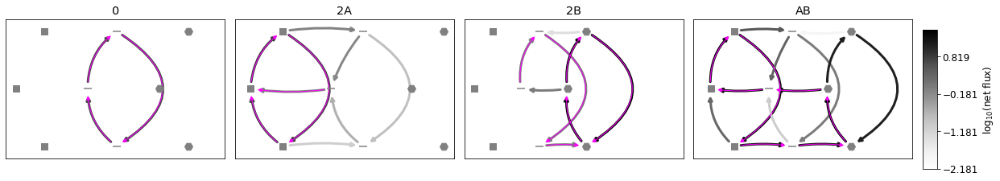

7389
[  98.08056515   10.91236012 5897.5109699    73.68490851]
[98.08056515 10.91236012 18.48988961 73.68490851]
[  98.08056515 1674.79390743 5897.5109699    73.68490851]
*****negative SAB
[-0.056807120139801943, 2.4589507717182575, [1.0736083996775083, 6.783900645271881, 1.1862081169544167, 6.521970523269881]]


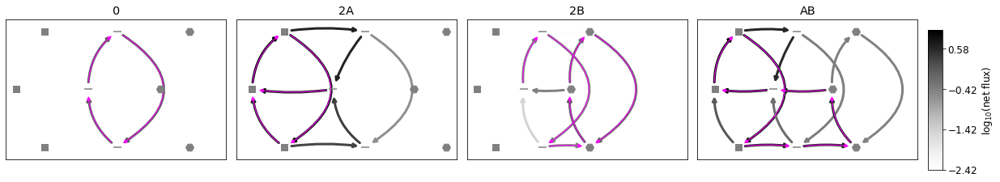

8528
[43.11931237  2.31544373 81.783557   10.59915366]
[43.11931237  2.31544373 28.71779222 10.59915366]
[ 43.11931237 187.87876738  81.783557    10.59915366]
[1.29141993313114, 0.25505681862443147, [1.3729329528949494, 1.613482121708549, 3.309333543906243, 3.9493015384802375]]


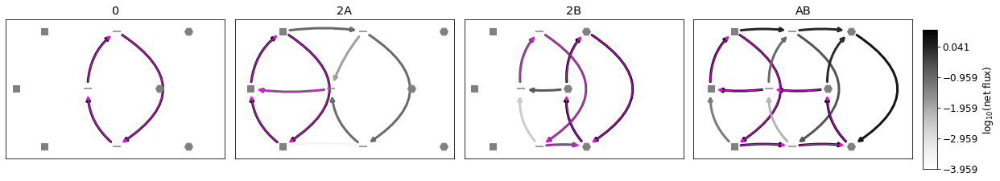

13432
[3.52642420e+02 1.09055368e+00 9.06299334e+03 1.11416138e+01]
[352.64241986   1.09055368  25.81052118  11.1416138 ]
[ 352.64241986   53.55572541 9062.99333832   11.1416138 ]
[1.6216181987977893, 2.8194277865267754, [0.30154600723305625, 0.9475045627496784, 0.4130519673293686, 2.915661010866527]]


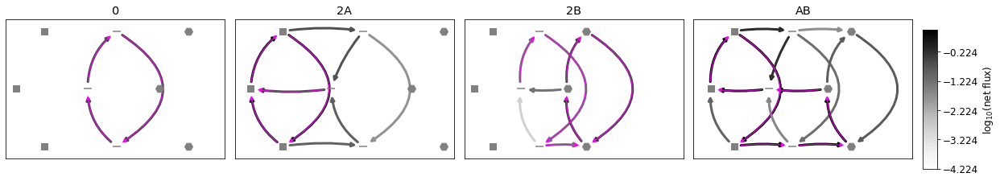

12614
[1.49262939e+02 5.72557771e+00 8.93473386e+03 1.96121805e+02]
[149.26293931   5.72557771  60.55604048 196.12180523]
[ 149.26293931  792.91140252 8934.7338631   196.12180523]
[1.852522270292772, 2.5910466409091177, [2.0338976276346936, 5.242017700573062, 3.1418141765481273, 18.930550964444485]]


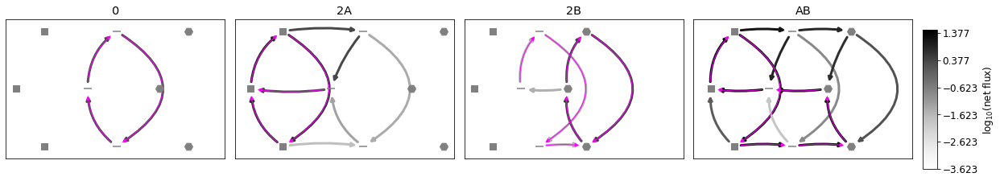

2459
[470.61068241   5.75204243  11.93945281  63.75712515]
[470.61068241   5.75204243   6.6835525   63.75712515]
[470.61068241 193.32423729  11.93945281  63.75712515]
[2.5562529550655095, -0.3566183916407442, [5.206743408521942, 5.210104703992448, 39.23811177366675, 30.644692447187143]]


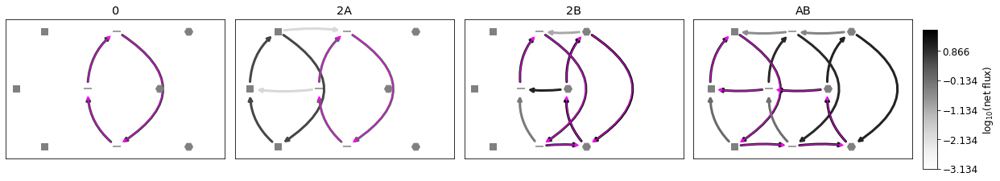

6044
[1.93864771e+02 2.62332572e+00 8.93844758e+03 4.96640746e+02]
[1.93864771e+02 2.62332572e+00 2.80740626e+03 4.96640746e+02]
[ 193.86477082  121.34220455 8938.44757662  496.64074581]
[1.9944045443563532, 0.04771922453036719, [2.078119737529459, 2.3895110134803264, 9.21127418800248, 9.521045221558008]]


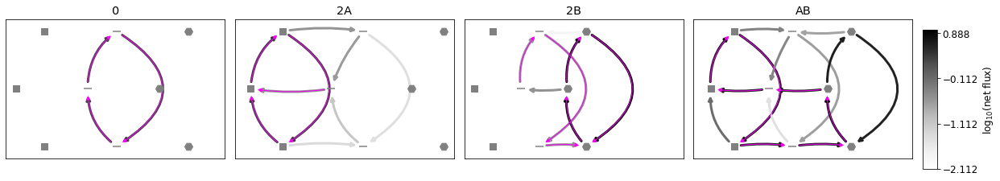

3334
[ 270.52072587    4.38123943 1444.21552905   61.10660511]
[270.52072587   4.38123943  12.26515832  61.10660511]
[ 270.52072587   91.69911442 1444.21552905   61.10660511]
[1.226212096881927, 0.14976514384794093, [2.9790852937117065, 3.9972189682119232, 8.429479546796554, 9.351570705558592]]


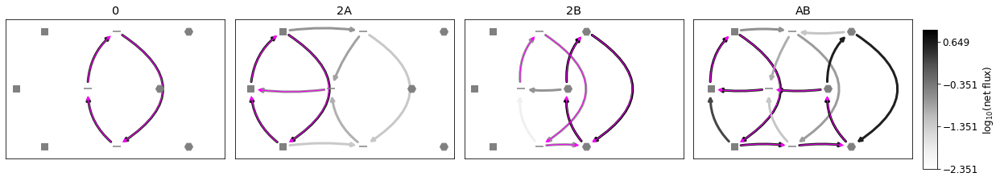

5910
[ 45.73646789   1.36882124 191.08843024   5.01749565]
[45.73646789  1.36882124  1.72267691  5.01749565]
[ 45.73646789 176.88183973 191.08843024   5.01749565]
[0.8760377432601736, 1.0180836216137448, [0.5604076573671728, 1.041480168114961, 0.9438238213220338, 1.911457483994961]]


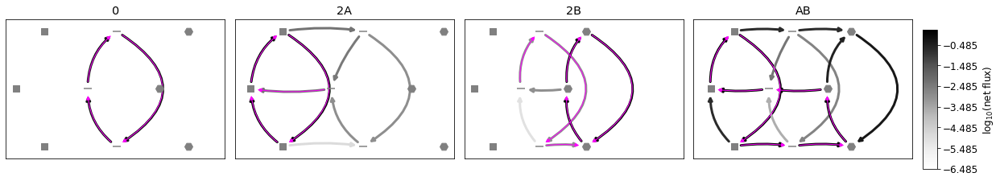

8773
[4.08367350e+02 1.73839878e+00 2.18383098e+03 5.33781425e+00]
[408.36734976   1.73839878   2.54014062   5.33781425]
[ 408.36734976   78.53245082 2183.83098346    5.33781425]
[0.8685857393999464, 1.4846802771117382, [0.5659669409462609, 1.27202355506396, 0.8299123311466022, 2.3225523671877073]]


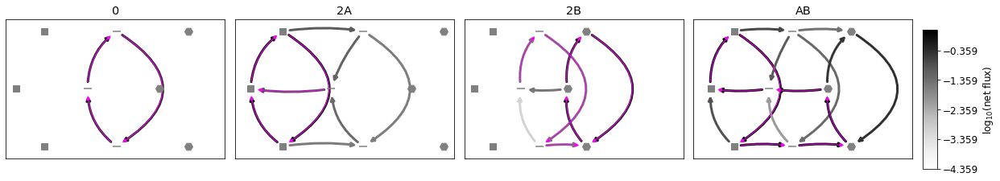

5282
[ 464.49382365    1.87458935 1173.76360041    2.98091982]
[464.49382365   1.87458935  51.90364008   2.98091982]
[ 464.49382365  429.78518264 1173.76360041    2.98091982]
[0.46842731081009636, 0.7543581215483227, [0.5818059933948216, 1.0252447608677486, 0.8409183082906417, 1.418529036557172]]


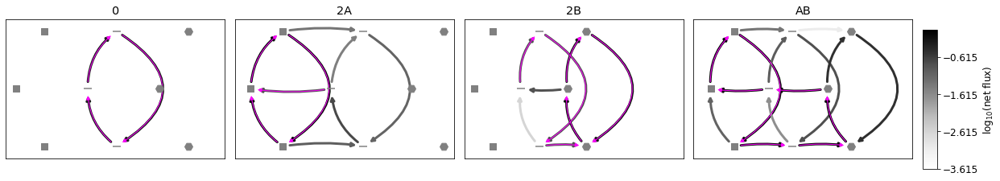

4124
[  67.95253652    4.01117316 1413.40607393  283.6639985 ]
[ 67.95253652   4.01117316   6.64318214 283.6639985 ]
[  67.95253652  788.76590453 1413.40607393  283.6639985 ]
[2.2703312684882486, 0.7275060120307987, [2.9336618386083884, 3.692287203517456, 10.758015245632052, 17.812844925381278]]


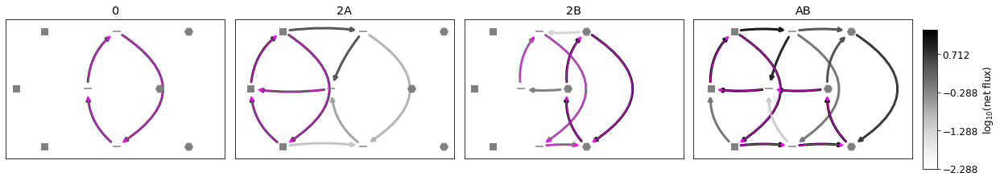

5853
[611.76946759   1.11296105  20.06465541  10.27442485]
[611.76946759   1.11296105   2.05151285  10.27442485]
[611.76946759 523.08076212  20.06465541  10.27442485]
[3.2279343612865277, -0.025001925581151295, [0.99934057264557, 1.0014774520781349, 9.547124192835291, 9.383097789854666]]


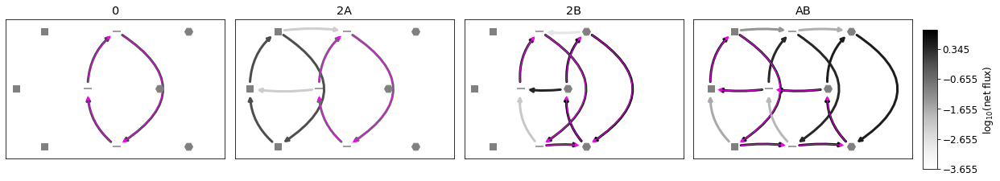

13502
[9.80582780e+02 1.43330468e+00 6.54821461e+03 1.58303793e+01]
[980.58278037   1.43330468  17.3205228   15.83037933]
[ 980.58278037  959.15615559 6548.21460532   15.83037933]
[1.9835320484911998, 1.3322600233207673, [0.8447962159392528, 1.3071899967352099, 2.0530103115173755, 5.169414536337149]]


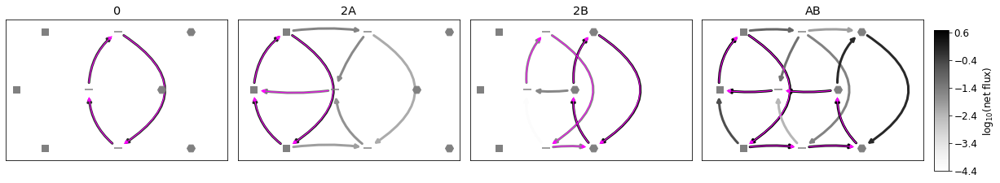

9084
[ 383.60378911   13.21686083 6176.75370721   83.12149743]
[383.60378911  13.21686083  56.83087167  83.12149743]
[ 383.60378911 7558.60452518 6176.75370721   83.12149743]
[0.5876029648888829, 1.706201121297707, [3.520956652448802, 10.409853448123888, 4.794165444903316, 15.643384984591284]]


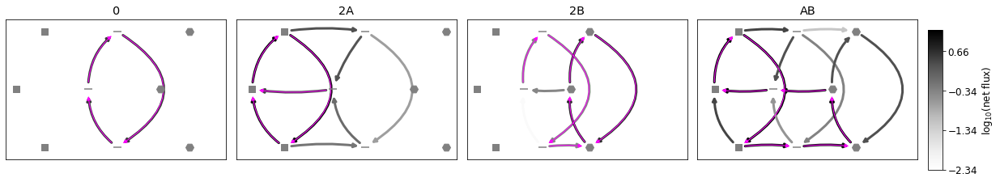

10478
[2.57547603e+02 2.28479925e+00 4.59102298e+03 2.20530679e+02]
[257.54760297   2.28479925 303.3708361  220.53067924]
[ 257.54760297 1398.77219922 4591.02297815  220.53067924]
[3.1021550946542384, 0.7575758957866287, [1.8978053247282156, 2.1551498742803776, 10.946269679268802, 18.5062835522092]]


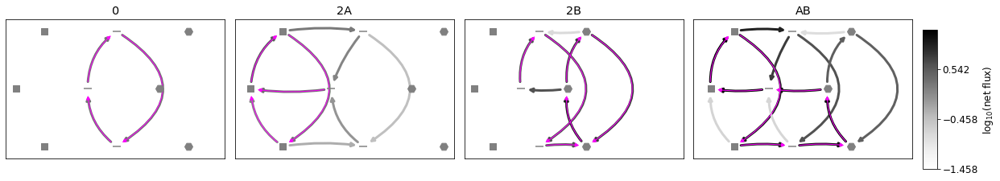

8009
[ 196.07950979    4.0320773  2011.15974745   48.55786284]
[196.07950979   4.0320773    6.21947663  48.55786284]
[ 196.07950979   17.99054547 2011.15974745   48.55786284]
[0.7796808710967962, 0.8619307030310819, [2.062133380397662, 3.6122511326722235, 3.4120726481203545, 6.201336032769633]]


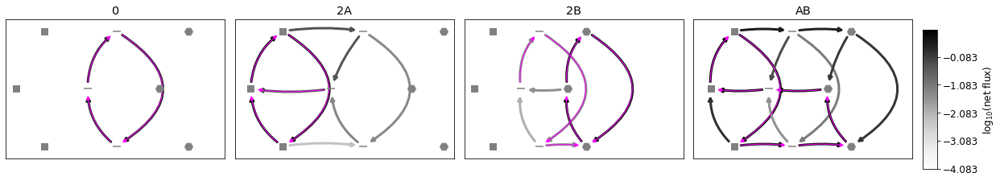

#path
[0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]
11580
[7.68752264e+01 6.42526648e+00 8.23182162e+03 1.01075240e+03]
[  76.8752264     6.42526648   10.14601638 1010.75240077]
[  76.8752264  1699.73459141 8231.82161912 1010.75240077]
[1.8713990974091137, 1.3261879922380866, [3.628786846077958, 5.667316714657363, 8.269940410596432, 20.73598861722283]]


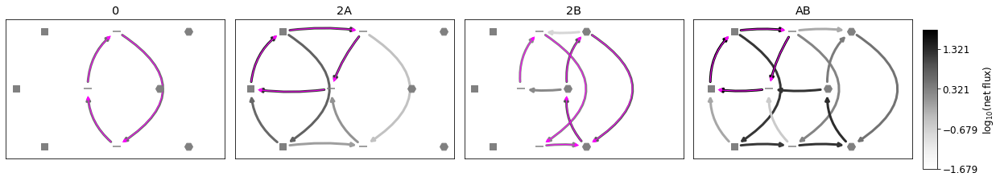

11206
[6.49188157e+02 3.05619647e+00 7.85790209e+03 4.06917088e+02]
[649.1881565    3.05619647   8.44202986 406.91708825]
[ 649.1881565   455.16724052 7857.90209139  406.91708825]
[3.825904091826023, 0.642515183470306, [2.7704815013759085, 2.9680548930325554, 26.962954452142135, 42.09047442644971]]


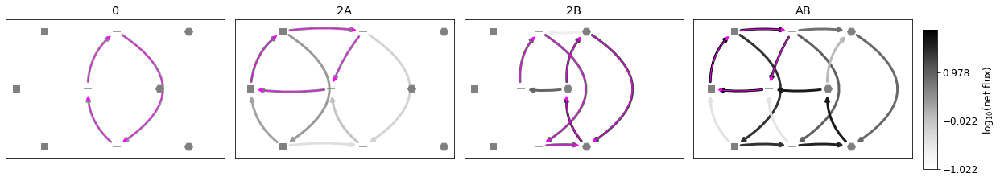

12546
[1.13049633e+02 3.12122081e+00 7.28556980e+03 2.98669180e+02]
[113.04963304   3.12122081  18.99741861 298.66917953]
[ 113.04963304 2501.84526636 7285.56980098  298.66917953]
[2.808308436677365, 2.2526832057186894, [1.8236270908710668, 2.979081569569598, 4.378670402233643, 20.86735820929095]]


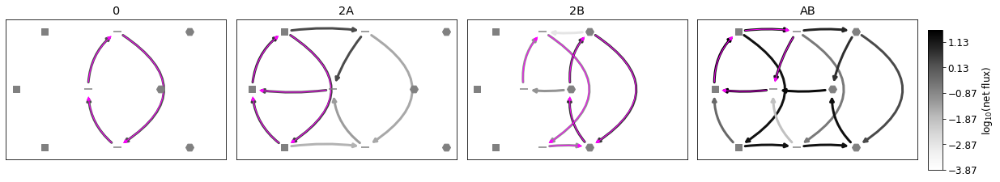

6978
[ 103.54420142    7.60258116 2708.7555083   451.29809219]
[103.54420142   7.60258116  18.52971428 451.29809219]
[ 103.54420142  305.42413853 2708.7555083   451.29809219]
[1.619096237341593, 0.5461546050045355, [4.96586522187524, 6.413375315172016, 13.491935950028111, 19.700769473335374]]


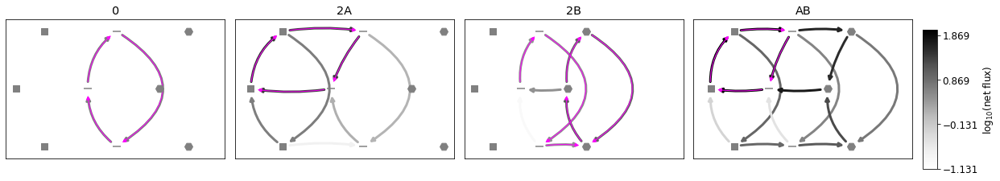

6806
[7.16320470e+02 4.58334554e+00 8.76105536e+03 1.69473246e+02]
[ 716.32047017    4.58334554 1485.48803494  169.47324612]
[ 716.32047017  224.65126327 8761.05535575  169.47324612]
[2.000076910185419, 0.44405580903148617, [3.359690824061523, 3.968372213945891, 11.66867181718489, 15.874335095271793]]


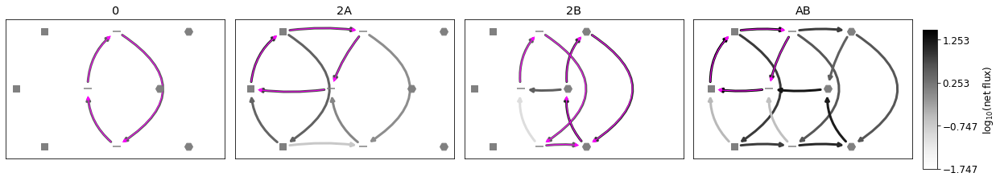

11044
[1.58852130e+02 1.36470352e+00 6.10416123e+03 9.86733321e+01]
[158.85212955   1.36470352 206.7537687   98.67333212]
[ 158.85212955   75.59178015 6104.16122712   98.67333212]
[2.155058842357536, 1.2156651497223405, [0.8782539188191144, 1.2344281219802364, 2.3672901236037176, 5.497980066968368]]


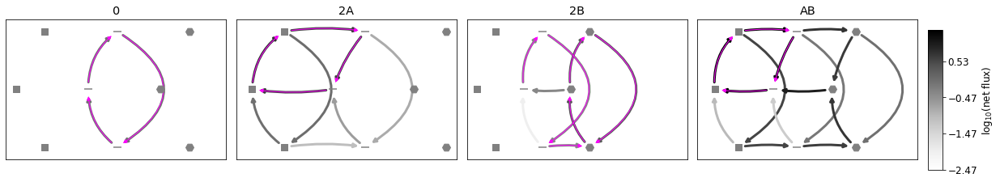

10034
[2.23368509e+02 6.89160393e+00 9.82219045e+03 3.11451939e+02]
[223.36850859   6.89160393 733.18191498 311.45193902]
[ 223.36850859 5966.44900513 9822.19045029  311.45193902]
[1.7604239570376492, 1.5609574258158605, [3.401603623230516, 5.841208170375894, 6.707305581553999, 19.78987723764984]]


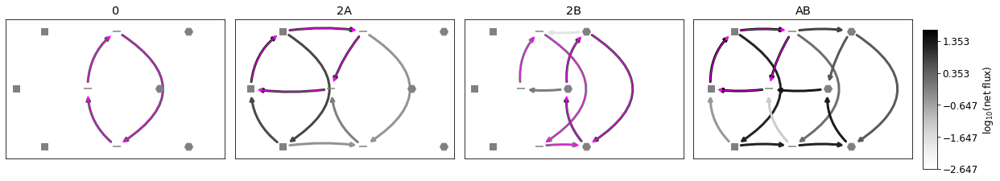

5560
[  33.7772981     7.00946578 3591.12961114  491.72897626]
[ 33.7772981    7.00946578  18.22597504 491.72897626]
[  33.7772981   752.95973504 3591.12961114  491.72897626]
[0.8965936661011923, 1.3522381523298108, [2.5607156130538593, 5.4988056222099875, 4.009643032745753, 10.236935229538828]]


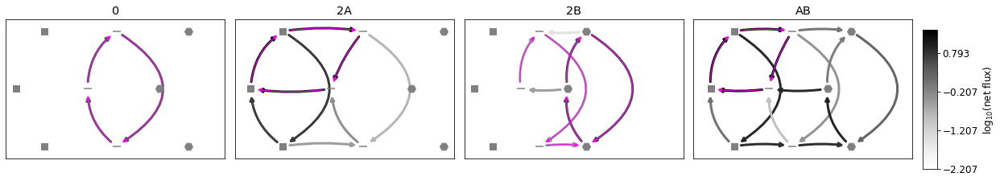

2848
[1.60635427e+02 2.55683931e+02 5.44217490e+03 1.96585926e+00]
[160.63542725 255.68393131  36.00737075   1.96585926]
[1.60635427e+02 3.31172758e+03 5.44217490e+03 1.96585926e+00]
*****negative SAB
[-0.9160547970109677, 2.2995137657070814, [0.05633000511459088, 0.5233653685384414, 0.05634071980303196, 0.2773607545325979]]


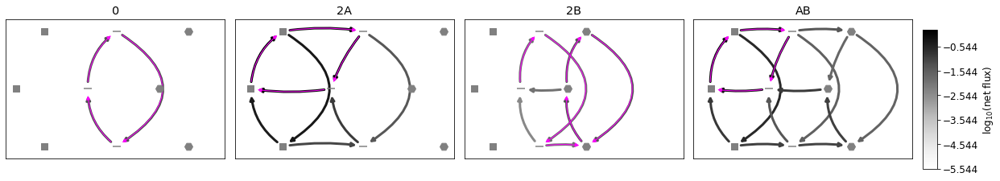

12515
[8.66284570e+01 3.45303306e+00 4.25590197e+03 1.50319924e+02]
[ 86.62845696   3.45303306  22.70200415 150.31992383]
[  86.62845696 1320.3152779  4255.9019698   150.31992383]
[1.9666455818588506, 2.0539167321184064, [1.5757438477275778, 3.0714575906165558, 2.891167738837333, 12.005046155643864]]


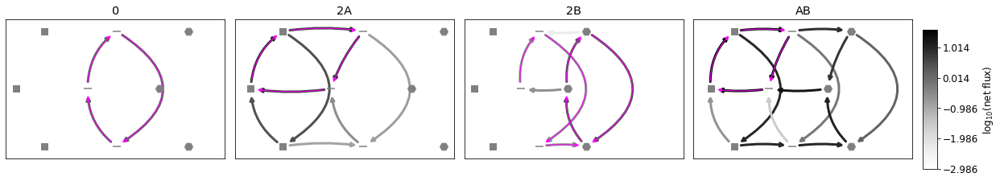

2196
[  18.31584777   10.07965435 4035.47445312  489.29242161]
[ 18.31584777  10.07965435 202.15274916 489.29242161]
[  18.31584777  170.5183182  4035.47445312  489.29242161]
*****negative SAB
[-0.0254818610956838, 1.2747019458847726, [1.6497618822042321, 4.782841011889956, 1.9421895756590173, 4.699104899778128]]


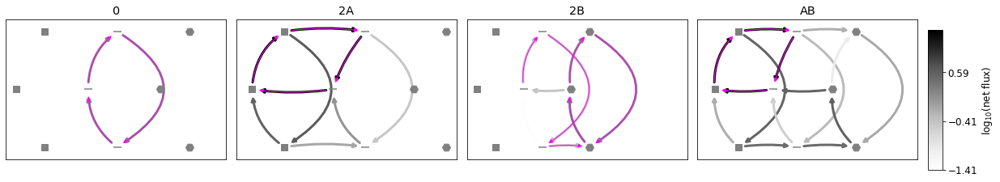

7871
[2.95488029e+02 6.62184941e+01 8.80988250e+03 3.51260188e+00]
[295.48802881  66.21849409 917.89588326   3.51260188]
[2.95488029e+02 4.43797171e+03 8.80988250e+03 3.51260188e+00]
*****negative SAB
[-0.9286349972077026, 1.595207833717253, [0.11375146770441301, 0.6553058922299894, 0.1139440564699015, 0.3442683386739359]]


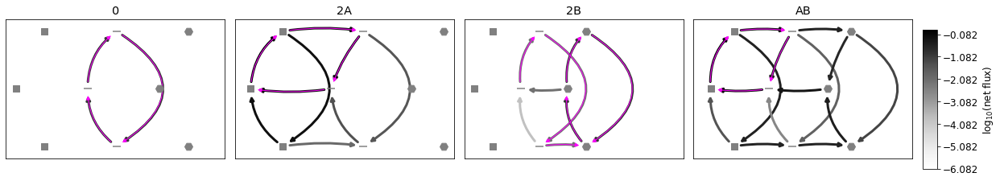

5232
[ 43.71143055  36.34695129 786.5697992    8.55645933]
[43.71143055 36.34695129 11.83302034  8.55645933]
[4.37114306e+01 8.63554953e+03 7.86569799e+02 8.55645933e+00]
*****negative SAB
[-0.9845860916280218, 1.758578940444064, [0.4404696993282397, 2.9850222777994073, 0.44583341855651654, 1.5085427771691022]]


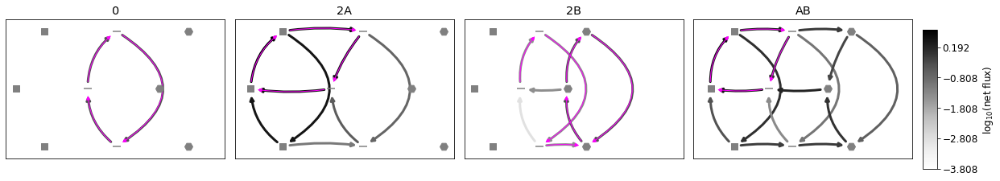

13564
[1.38216631e+01 1.23163043e+00 9.16237374e+03 4.17365251e+02]
[ 13.82166311   1.23163043  80.6759898  417.36525109]
[  13.82166311  305.22446713 9162.37374231  417.36525109]
[1.9687840152909475, 2.843574560656653, [0.4040446584368192, 1.1004536114573067, 0.600113706284224, 4.307594200731259]]


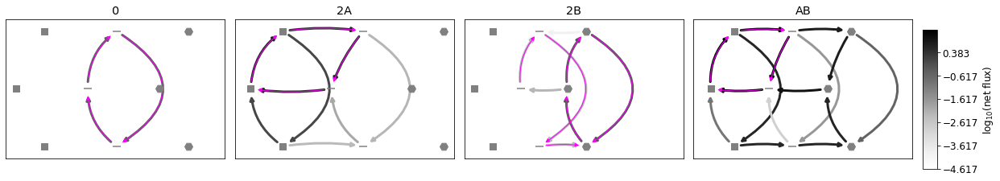

612
[  89.74785746   61.3927136  1941.0145972  2487.8328622 ]
[  89.74785746   61.3927136     5.43271159 2487.8328622 ]
[  89.74785746 4110.62308261 1941.0145972  2487.8328622 ]
[0.6541406648806811, -0.016536294859298407, [27.377654615128947, 29.060569758155587, 46.25918819617417, 45.731988571122955]]


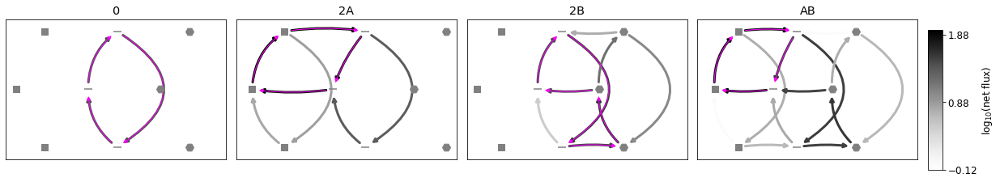

6694
[5.22676066e+00 3.02923087e+02 9.28125019e+03 8.04433135e+00]
[  5.22676066 302.92308707  86.93864427   8.04433135]
[5.22676066e+00 2.00661482e+03 9.28125019e+03 8.04433135e+00]
*****negative SAB
[-1.196251348876023, 1.4474247717560769, [0.004523650593472493, 0.028269631061767577, 0.004523705558326491, 0.012337086288924522]]


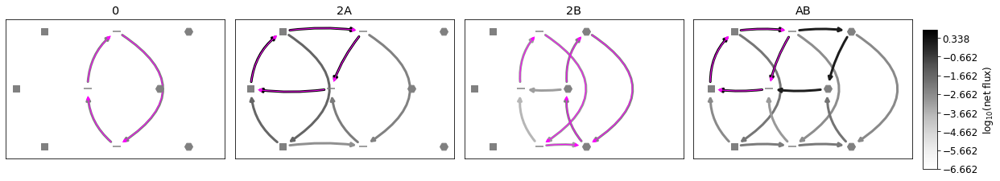

3683
[2.35818353e+01 3.69824938e+00 6.90682162e+03 6.91893350e+03]
[2.35818353e+01 3.69824938e+00 7.67008704e+00 6.91893350e+03]
[  23.58183534  271.47547863 6906.82162141 6918.93349808]
[2.0751814427337925, 0.2352449673244751, [2.814684978485116, 3.0934265794823386, 11.074289742192972, 13.035619447051243]]


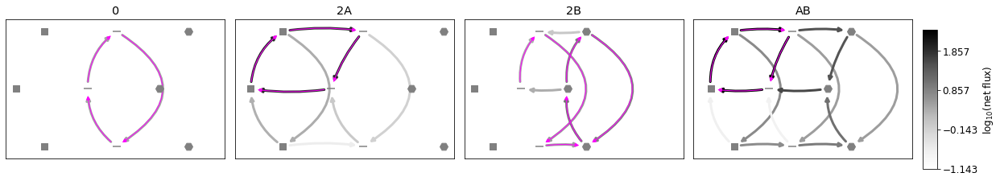

13293
[5.07060358e+01 1.30845093e+00 1.38088609e+03 7.99593067e+01]
[50.70603581  1.30845093 99.98847225 79.95930665]
[  50.70603581  727.88198724 1380.88609131   79.95930665]
[2.355058204394118, 1.1743816558248965, [0.8794469403454834, 1.1771189287686614, 2.6683291445083577, 6.022315510046076]]


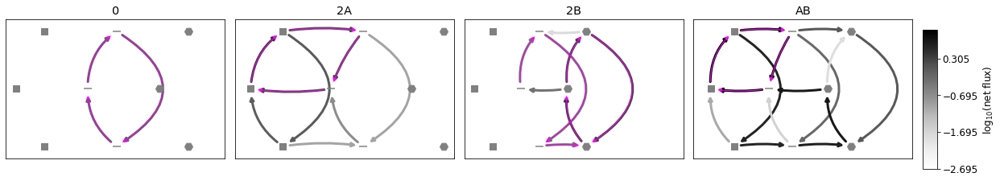

9710
[3.16978188e+01 2.13687965e+00 8.55853252e+03 2.20471939e+03]
[3.16978188e+01 2.13687965e+00 1.55620675e+02 2.20471939e+03]
[  31.69781881 1716.29138449 8558.53251974 2204.71939351]
[2.5717736859251485, 0.8716428568054828, [1.6065809159968552, 1.9843804083872907, 6.4478556577497645, 11.797933724190921]]


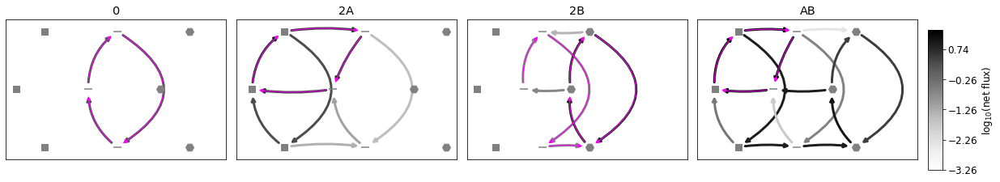

11628
[ 16.61483584   1.53624139 938.78036058  17.25651789]
[16.61483584  1.53624139  1.04446293 17.25651789]
[ 16.61483584 260.44995307 938.78036058  17.25651789]
[0.6294017484395616, 2.5878046057948554, [0.24731980665755784, 1.1438138177263366, 0.2943183465677032, 1.769392346075977]]


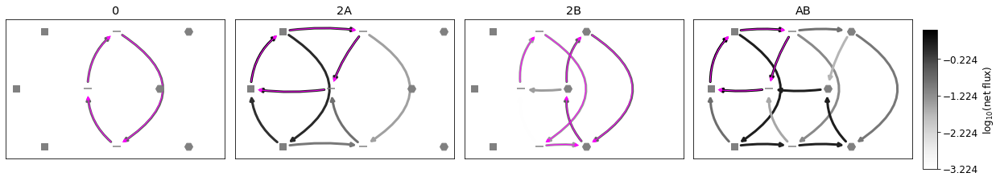

6905
[   7.39396849  272.06616165 2014.63074092    4.47212238]
[  7.39396849 272.06616165  95.45244762   4.47212238]
[   7.39396849 1028.99603582 2014.63074092    4.47212238]
*****negative SAB
[-1.1581841076952297, 1.43922963597099, [0.016316210519440856, 0.09874994692991279, 0.016316891395774445, 0.044247497560256005]]


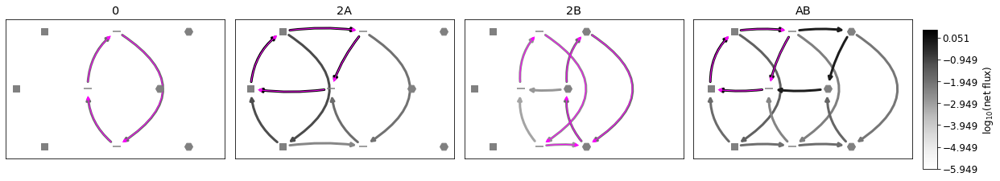

11188
[  25.24558496    1.28409642 1045.70229678   34.86653064]
[25.24558496  1.28409642  3.9560863  34.86653064]
[  25.24558496 1037.92726007 1045.70229678   34.86653064]
[1.7256581952695955, 2.260224194360315, [0.49139024651010615, 1.1520972915350707, 0.7953691742982514, 3.810342674189867]]


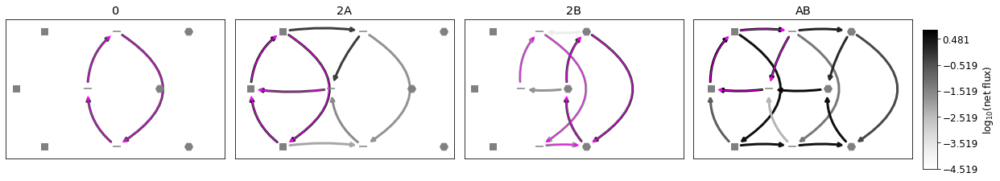

10422
[1.61477080e+01 1.93676055e+00 5.83892259e+03 1.26457861e+02]
[ 16.147708     1.93676055  32.62695648 126.45786088]
[  16.147708     58.15108567 5838.92259322  126.45786088]
[0.7241305444119503, 2.8023925069992, [0.290227799913407, 1.432417693991315, 0.33919581666765797, 2.366217661698881]]


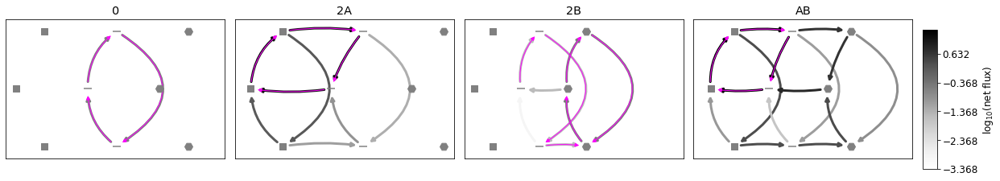

12813
[7.81081997e+01 1.37861868e+00 5.95094889e+03 4.33361918e+01]
[78.10819972  1.37861868  8.86229652 43.33619177]
[  78.10819972  518.26608202 5950.94888633   43.33619177]
[2.179774917446053, 3.367703359252483, [0.3969320704815141, 1.2685616480727662, 0.55681315059273, 5.747635405190552]]


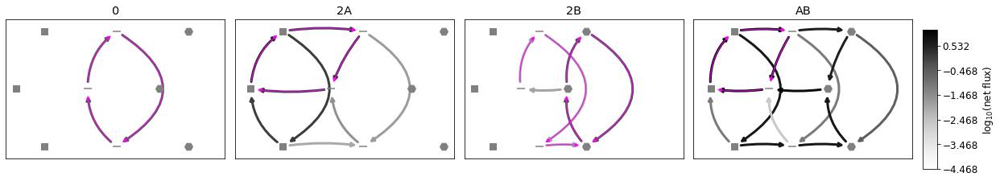

4690
[1.56547123e+02 2.27951030e+00 4.05485696e+03 1.13344353e+03]
[ 156.5471232     2.2795103     5.27807624 1133.44352822]
[ 156.5471232    28.21918856 4054.85696188 1133.44352822]
[2.3756170524618274, -0.3483791768583529, [2.133045892055034, 2.2372412464805693, 14.781461978917099, 11.610336540961493]]


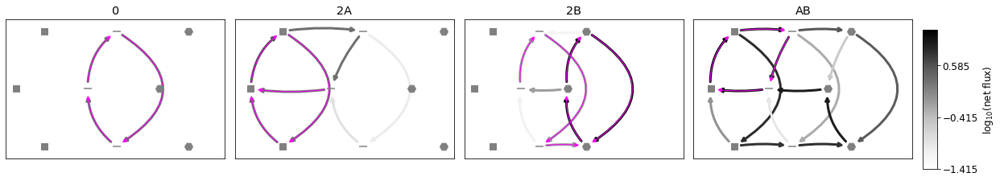

12195
[6.83132173e+01 1.10645359e+00 7.11704583e+03 5.30560113e+01]
[68.31321734  1.10645359 27.17155003 53.05601133]
[  68.31321734  123.88452231 7117.04582974   53.05601133]
[2.1426729709955437, 3.154027238960565, [0.34471960560822695, 1.004334626687881, 0.49823067811779875, 4.434935126178989]]


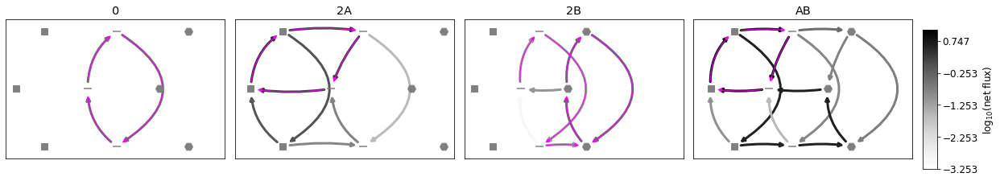

8318
[2.47144429e+02 4.73891549e+00 7.58939437e+03 1.60414764e+02]
[247.1444293    4.73891549 483.72121572 160.41476441]
[ 247.1444293   259.52292748 7589.39436867  160.41476441]
[1.6908420425816713, 1.4390399760368153, [2.422893444639968, 4.076792734411902, 4.854210522327706, 13.161724776621352]]


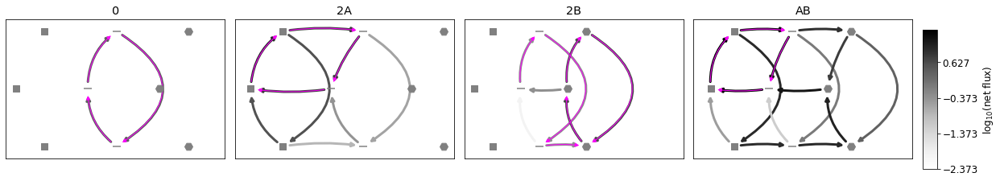

2220
[1.29607163e+01 3.45736893e+00 1.28543173e+03 5.00486460e+03]
[1.29607163e+01 3.45736893e+00 6.53984698e+00 5.00486460e+03]
[  12.96071631  498.80818002 1285.43172964 5004.86460196]
[1.9530499547796838, 0.06575196822621265, [2.5879257330613656, 2.7244505424649947, 10.07887904138266, 10.548860468665909]]


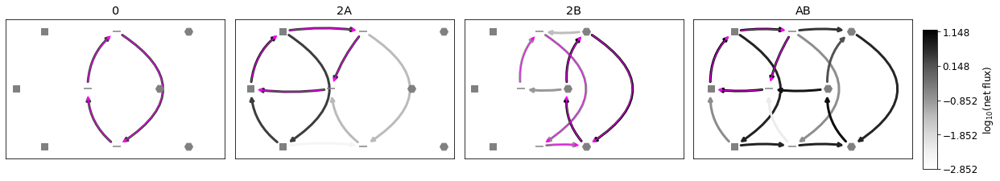

13449
[2.62937527e+01 1.21851712e+00 4.92137215e+03 5.09119964e+02]
[ 26.29375274   1.21851712 217.62795687 509.11996434]
[  26.29375274  236.51719567 4921.37215432  509.11996434]
[2.4886195895407575, 1.3559203998954632, [0.8141347985684455, 1.1045932234949336, 2.422026032415662, 6.199426548760878]]


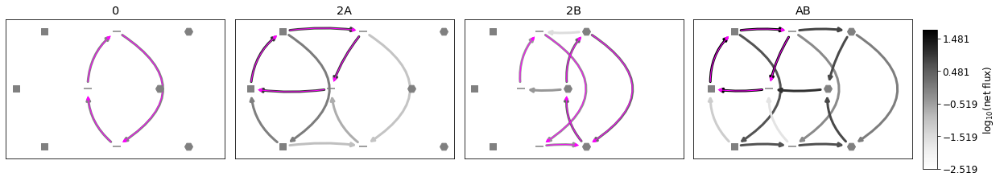

4313
[6.26243088e+00 1.05918336e+00 3.40262618e+03 7.58890456e+02]
[  6.26243088   1.05918336   4.8357429  758.89045586]
[   6.26243088  915.90563277 3402.62618029  758.89045586]
[1.7898204528793245, 1.4322507376859273, [0.5491218644308101, 0.8888002825382754, 1.1387893417345667, 3.0732212476898173]]


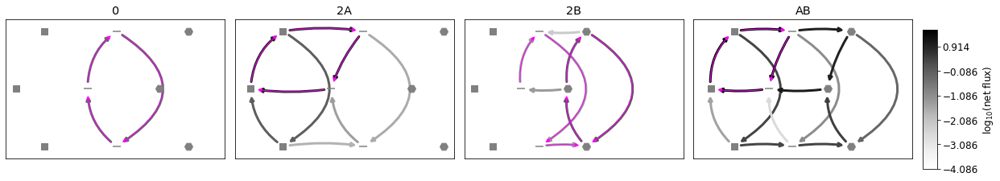

2679
[4.05925890e+01 1.00593173e+00 1.48234890e+03 5.00946581e+00]
[ 40.59258898   1.00593173 102.34397429   5.00946581]
[  40.59258898  570.45188287 1482.34890268    5.00946581]
*****negative SAB
[-0.014861006294712958, 1.8823926907630295, [0.11753499656416845, 0.49561948634280273, 0.13305098714497313, 0.4905403816102727]]


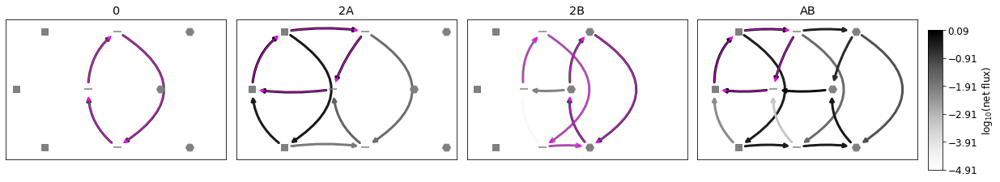

6753
[1.73430379e+00 1.96470851e+02 1.88916552e+03 8.23776747e+00]
[  1.73430379 196.47085086 111.97170684   8.23776747]
[1.73430379e+00 1.41219428e+03 1.88916552e+03 8.23776747e+00]
*****negative SAB
[-1.2066746574929075, 1.6886640046557202, [0.0075224904407322855, 0.0559705368085662, 0.007522733681862239, 0.024250137492669434]]


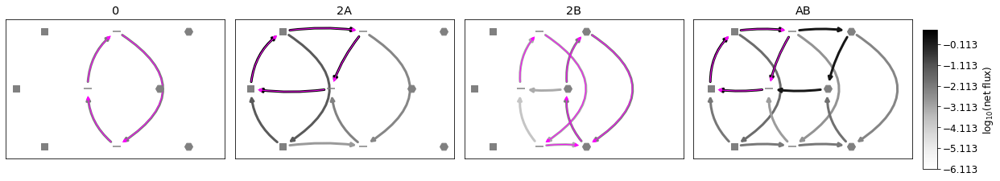

923
[  13.60479092    6.34458041 4188.84466214 1378.35413072]
[  13.60479092    6.34458041  174.73544904 1378.35413072]
[  13.60479092 5471.2650753  4188.84466214 1378.35413072]
[0.5314301793776671, 0.2467056508428324, [2.1967281634466786, 2.731084587976884, 3.326946177650478, 3.94740399254264]]


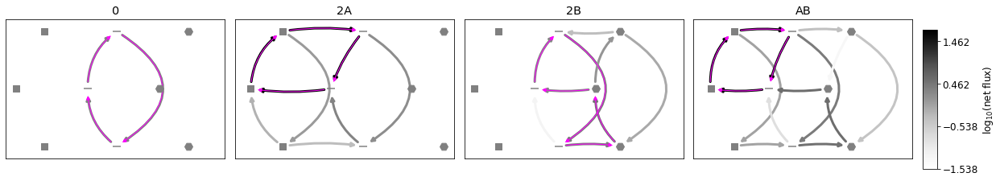

10720
[1.09347443e+01 1.02682466e+00 4.67541463e+03 5.91283815e+01]
[10.93474432  1.02682466  6.21200284 59.12838147]
[  10.93474432  360.25451225 4675.4146265    59.12838147]
[0.9567074590211345, 3.5041942495892453, [0.12028591162371471, 0.7957671205657452, 0.13611815489334306, 1.5444847812190314]]


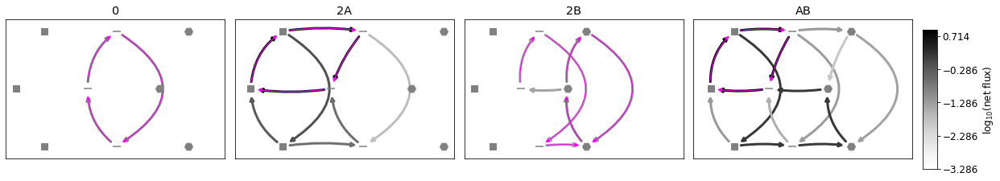

3492
[2.33210037e+00 2.11783575e+01 2.65691930e+03 3.82661792e+01]
[ 2.33210037 21.17835752 30.39588109 38.26617917]
[2.33210037e+00 4.46896293e+02 2.65691930e+03 3.82661792e+01]
*****negative SAB
[-1.1352403966886762, 0.9341436108501732, [0.033030882469811784, 0.13883611461372372, 0.0330792605211852, 0.06320639771819589]]


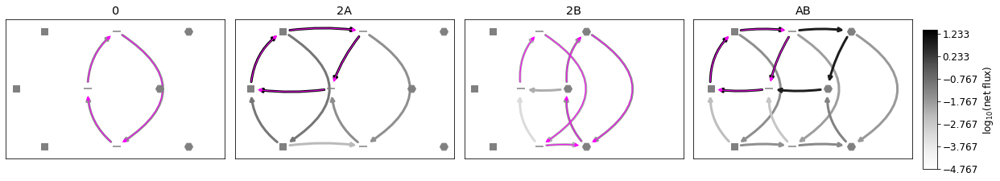

7587
[ 122.82427098    5.18881608 2443.20429644  393.34459093]
[122.82427098   5.18881608   4.20021912 393.34459093]
[ 122.82427098 4847.74181499 2443.20429644  393.34459093]
[2.6535062758959413, 0.8802891108111103, [3.9373596863115536, 4.75533864429843, 16.25447719517236, 29.920333689452256]]


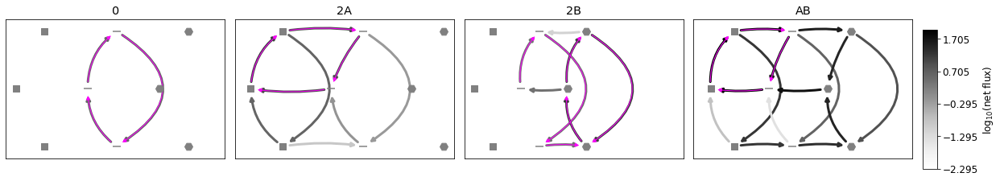

12349
[4.59682819e+02 1.26245861e+00 3.02147939e+03 3.88479281e+01]
[459.68281853   1.26245861  48.24959534  38.84792814]
[ 459.68281853  489.75663451 3021.47939042   38.84792814]
[2.970403533327894, 0.8761726767485036, [1.0108981707436049, 1.171073685204297, 5.000466566299288, 9.178353597886698]]


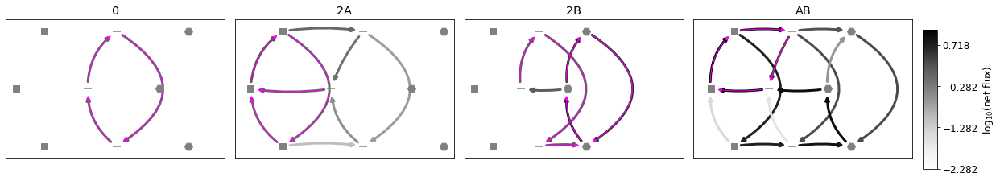

3433
[ 12.67801487   1.65621389 577.79809945 595.80456009]
[ 12.67801487   1.65621389  16.06728617 595.80456009]
[  12.67801487 1053.99809674  577.79809945  595.80456009]
[2.2076592367918786, 0.011035575666843994, [1.314345879288953, 1.3395177600491142, 6.140420137309525, 6.18757002033972]]


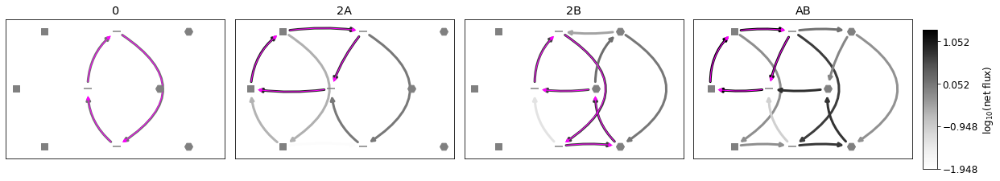

9636
[1.30794397e+01 2.81171558e+00 8.18193555e+03 9.94738008e+02]
[ 13.07943969   2.81171558 264.11625825 994.73800812]
[  13.07943969  999.11421244 8181.93555237  994.73800812]
[1.041753840161667, 1.5743096317792438, [0.9416355098207388, 2.044383237507065, 1.413341280003703, 4.208830784815227]]


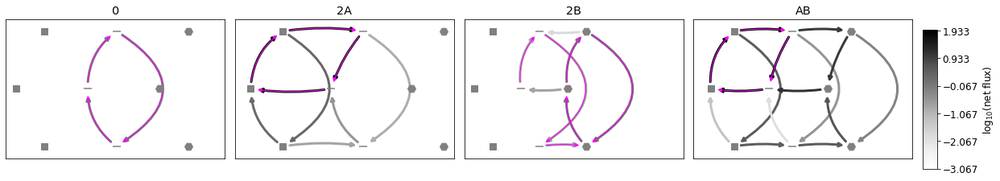

7430
[ 349.00379141    9.95391481 4599.15388762 1502.65770035]
[ 349.00379141    9.95391481    5.82883395 1502.65770035]
[ 349.00379141 2591.26502691 4599.15388762 1502.65770035]
[3.277023235871353, 0.24265930411342176, [8.868115265407495, 9.314814323559505, 76.31479879729707, 90.29350106719471]]


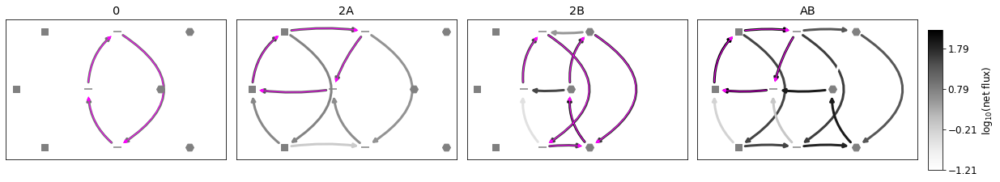

4930
[ 115.31144273   11.38268562 8877.23897701  234.50903257]
[115.31144273  11.38268562  43.99459027 234.50903257]
[ 115.31144273  502.95996601 8877.23897701  234.50903257]
[0.7119495515266149, 2.226032345453493, [2.330620620752177, 8.31251437039328, 2.910369109827739, 13.616032504973232]]


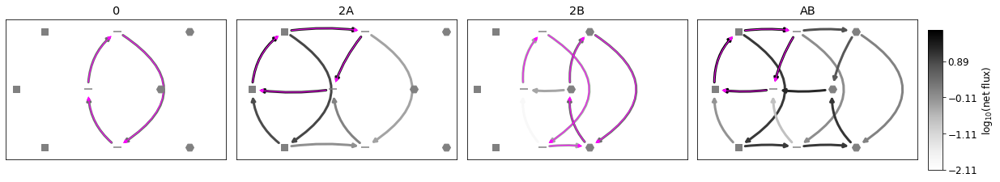

13677
[2.54060640e+01 1.69271763e+00 6.95537274e+03 5.42507762e+01]
[25.40606401  1.69271763 10.47927697 54.25077625]
[  25.40606401  267.65621403 6955.37273854   54.25077625]
[0.9332435206301196, 3.785683249660784, [0.17559552200827017, 1.4129648272610489, 0.19564170179486617, 2.6981472297353206]]


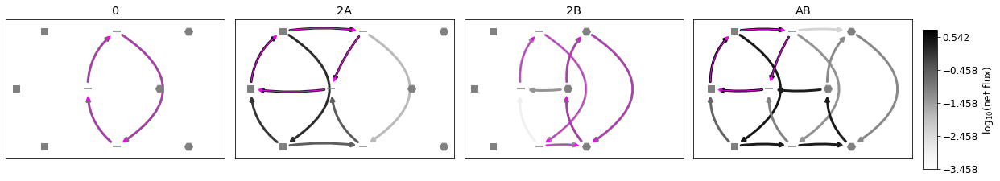

4816
[1.48970677e+02 3.57069625e+00 4.41764294e+03 3.03393581e+01]
[148.97067746   3.57069625  26.53903632  30.33935811]
[ 148.97067746  981.72023673 4417.64294095   30.33935811]
[0.4434753550948314, 1.6769585346578884, [0.770917529031728, 2.308877463202404, 0.9819411232085739, 3.1397875920544065]]


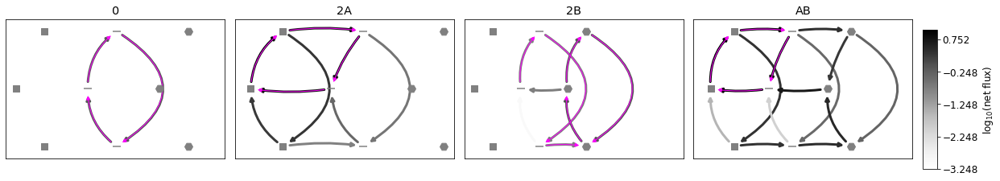

8853
[ 383.27112327   11.45410628 5184.41194893 1868.11606448]
[ 383.27112327   11.45410628    6.78918471 1868.11606448]
[ 383.27112327 1071.27484941 5184.41194893 1868.11606448]
[3.3328251732193452, 0.3382642272792804, [10.236441076821206, 10.994450208141684, 87.62462761977594, 110.77808778318064]]


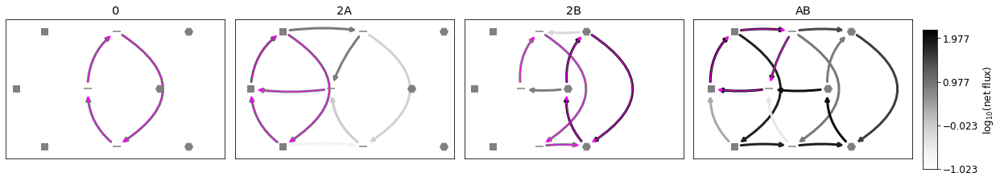

1396
[2.58857162e+00 1.79864066e+00 5.63811636e+03 1.32116040e+03]
[   2.58857162    1.79864066   36.11638753 1321.16040418]
[2.58857162e+00 1.17451586e+02 5.63811636e+03 1.32116040e+03]
[0.0892193901298571, 0.1298025522755986, [0.3858535034028806, 0.47454689035632586, 0.46138384370190527, 0.5048203394184181]]


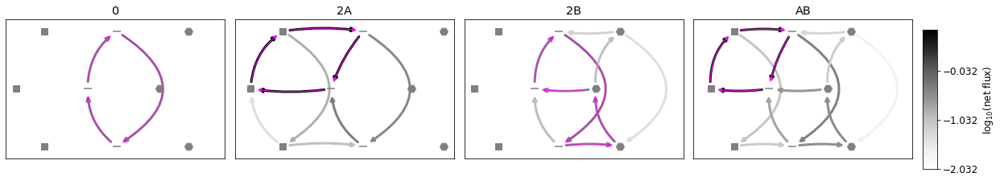

1638
[9.16033422e+00 1.99944293e+00 4.04881488e+03 3.42185989e+00]
[ 9.16033422  1.99944293 11.10071453  3.42185989]
[9.16033422e+00 4.78235865e+02 4.04881488e+03 3.42185989e+00]
*****negative SAB
[-0.7468017308790033, 1.3964897804269278, [0.0076882046357804774, 0.03409387708291543, 0.0077175838503779695, 0.020317331622260994]]


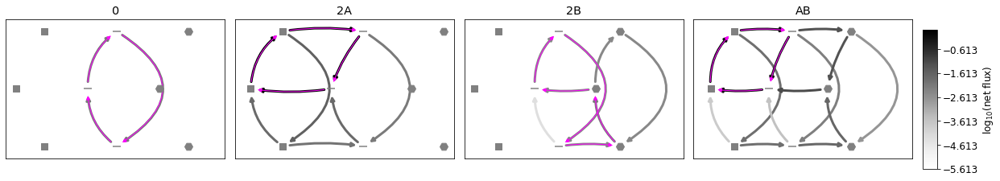

3603
[6.37486870e+00 3.48655670e+00 8.53171317e+03 2.28384582e+03]
[   6.3748687     3.4865567   111.80960766 2283.84581852]
[6.37486870e+00 9.96823859e+02 8.53171317e+03 2.28384582e+03]
[0.5065400448099507, 1.0179944840320625, [0.9707601420863228, 1.9141557323687584, 1.3428086824914465, 2.719324376593542]]


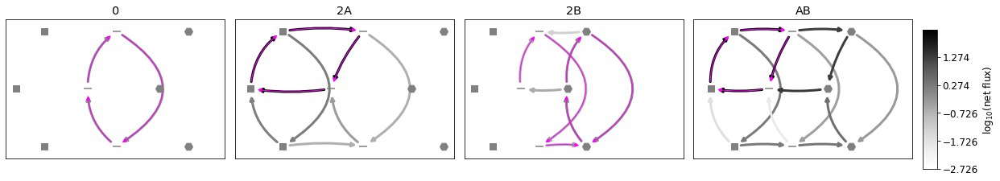

12516
[6.37712573e+01 3.37047382e+00 3.44115265e+03 2.64397477e+03]
[  63.77125731    3.37047382   14.01141193 2643.97476845]
[  63.77125731 3080.4703997  3441.1526457  2643.97476845]
[3.3776479764532645, 0.2833362091090289, [3.0015387351681215, 3.1504634525402246, 26.906369611622782, 32.74521162960261]]


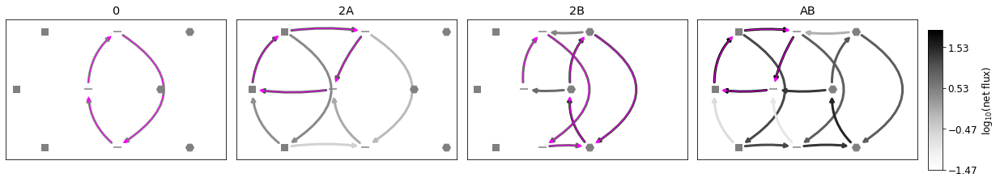

999
[  2.67378335   6.69406943 647.38607697  45.0002752 ]
[ 2.67378335  6.69406943 12.54739992 45.0002752 ]
[2.67378335e+00 3.28392186e+03 6.47386077e+02 4.50002752e+01]
*****negative SAB
[-0.9102471614739286, 1.2469229026632052, [0.1687449947663783, 0.7720725517947356, 0.17309527694276147, 0.4108151148321883]]


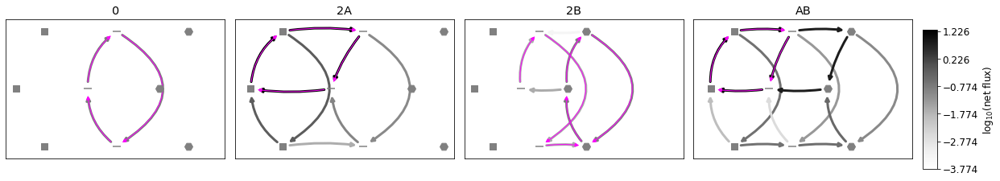

9882
[1.39765187e+01 1.11370468e+00 8.86754892e+03 9.98093714e+01]
[13.97651871  1.11370468 11.56086244 99.80937144]
[1.39765187e+01 8.29900281e+00 8.86754892e+03 9.98093714e+01]
[0.6684329151118559, 3.332213350552783, [0.13631045525585436, 0.9615496216645664, 0.15173783679876562, 1.5282347082344097]]


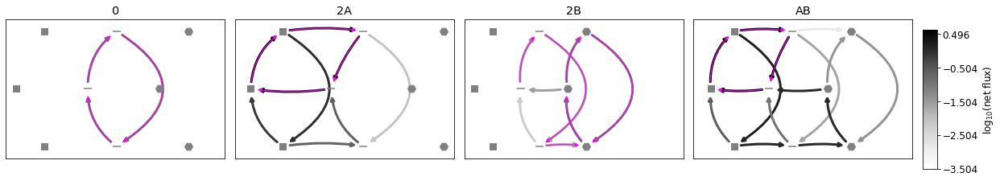

5170
[4.09740548e+01 1.07605997e+00 5.14395465e+03 2.66790067e+01]
[40.97405481  1.07605997  7.40310268 26.6790067 ]
[  40.97405481   30.93329013 5143.95464755   26.6790067 ]
[0.45446281960007806, 2.2701993997089995, [0.1755358262813451, 0.7258155026382126, 0.20617455467684598, 0.9945650202602369]]


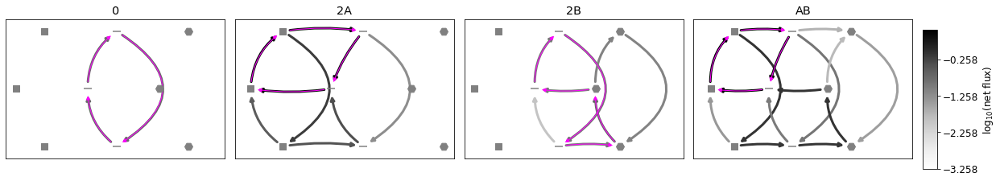

13929
[3.23314722e+01 1.83201715e+00 7.28541558e+03 2.10575937e+03]
[3.23314722e+01 1.83201715e+00 1.12981588e+02 2.10575937e+03]
[  32.33147219 1248.7242478  7285.4155841  2105.7593696 ]
[3.113303783310961, 1.0425422117838365, [1.4614330614610351, 1.7087670698529431, 7.178673693151628, 14.787021025885561]]


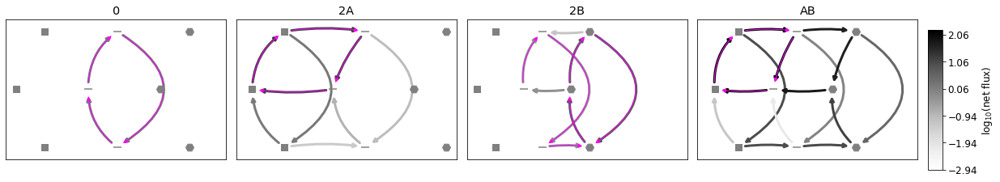

9806
[3.03098585e+01 1.49128853e+00 4.22553833e+03 1.46030505e+02]
[ 30.30985854   1.49128853  24.27460965 146.03050476]
[  30.30985854  205.68115176 4225.5383341   146.03050476]
[1.6793562989260518, 2.021871833523715, [0.6005738005840465, 1.2666985931919152, 0.9990008053215261, 4.0570457730765845]]


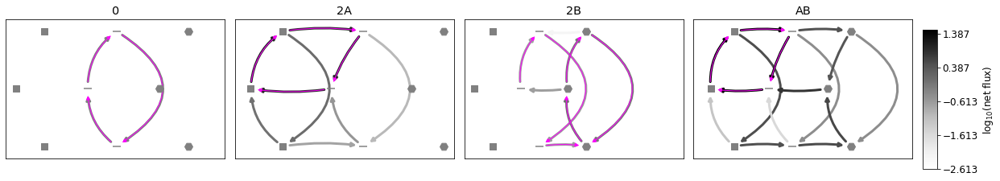

3247
[4.10458031e+01 1.76101005e+00 5.23601433e+03 3.69341332e+02]
[ 41.04580313   1.76101005 249.44734531 369.34133194]
[  41.04580313   33.15036214 5236.01433148  369.34133194]
[1.675209823676596, 1.0244234613997754, [1.0634767743532263, 1.5606982349664544, 2.450333260011123, 4.984336392895496]]


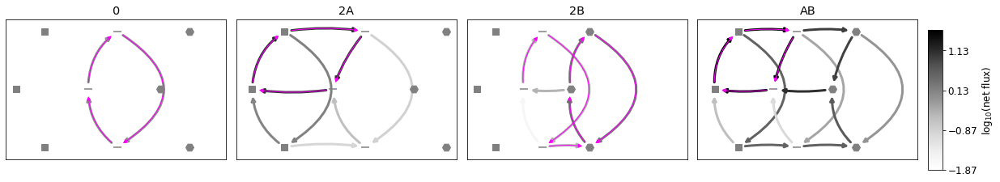

10374
[1.05284091e+02 5.71163197e+01 3.12470870e+03 1.91729907e+00]
[105.28409061  57.11631971   8.23200733   1.91729907]
[1.05284091e+02 1.70497987e+03 3.12470870e+03 1.91729907e+00]
*****negative SAB
[-1.1615888585817076, 1.7505032356796608, [0.0623905313564022, 0.4701116077357872, 0.06245596229505148, 0.2101492699475057]]


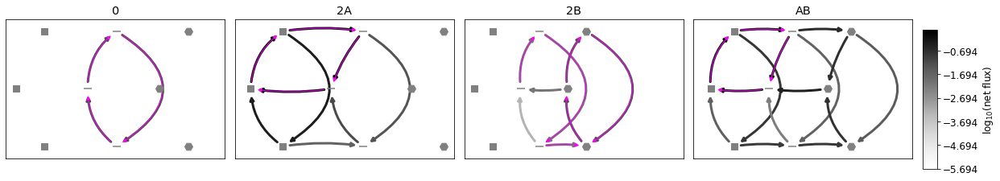

13391
[2.99797806e+01 1.40853541e+00 3.98266896e+03 8.64270302e+02]
[ 29.9797806    1.40853541   8.61461661 864.27030184]
[  29.9797806   237.99572857 3982.66895863  864.27030184]
[3.085516181028542, 1.1292943819597963, [1.1133649871984557, 1.3385928702649605, 5.194334902992097, 11.362697111043406]]


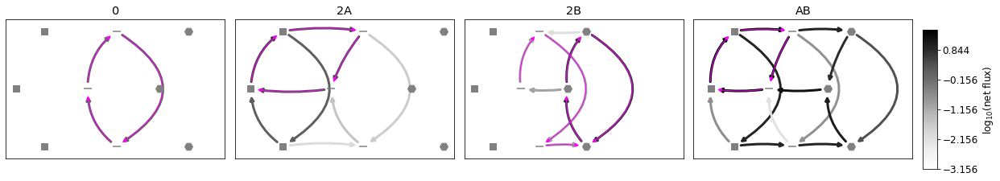

13178
[1.04882841e+02 1.03263359e+00 5.42484101e+03 3.59184386e+02]
[104.88284112   1.03263359  13.03797884 359.18438616]
[ 104.88284112  717.74335895 5424.84100648  359.18438616]
[4.272294490849132, 1.6231932397214104, [0.889112461282557, 1.0097587232448773, 6.333978018265551, 19.51220749910243]]


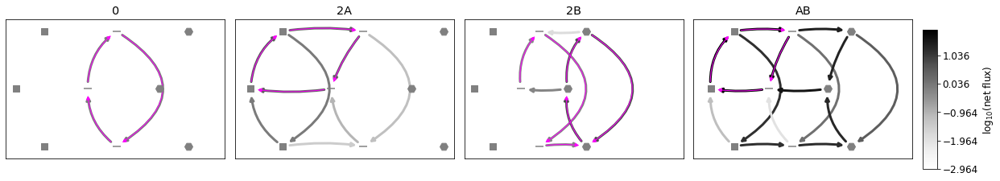

9104
[7.47514417e+00 1.04086951e+00 1.14098313e+03 6.10968293e+02]
[  7.47514417   1.04086951   2.25329658 610.96829346]
[   7.47514417   85.64960352 1140.98313492  610.96829346]
[1.8745438741186522, 0.3995625049879016, [0.7429549777391321, 0.9030696183456439, 2.510353413900488, 3.311426851195867]]


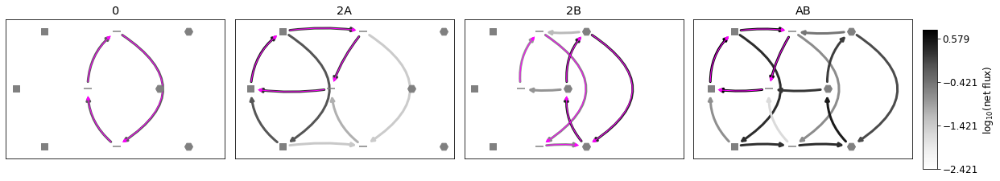

265
[   6.20333918    2.46937946  400.1383209  1004.42617987]
[   6.20333918    2.46937946    1.62101206 1004.42617987]
[   6.20333918  439.54901132  400.1383209  1004.42617987]
[1.4858403304581507, 0.15356734690072824, [1.583835790064177, 1.7321569360168558, 4.361555143415959, 4.851429731776047]]


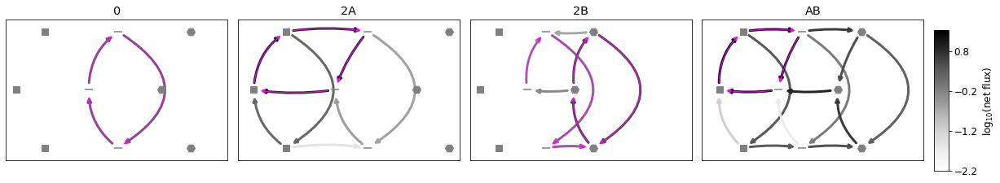

13622
[6.01415067e+01 2.78475512e+00 5.70404216e+03 1.03450306e+02]
[ 60.14150675   2.78475512  59.88934713 103.45030605]
[  60.14150675  387.59228806 5704.04216243  103.45030605]
[1.5782630032142773, 2.765348280666411, [0.7679334147305211, 2.407147712913722, 1.0571934539193193, 7.187986392510321]]


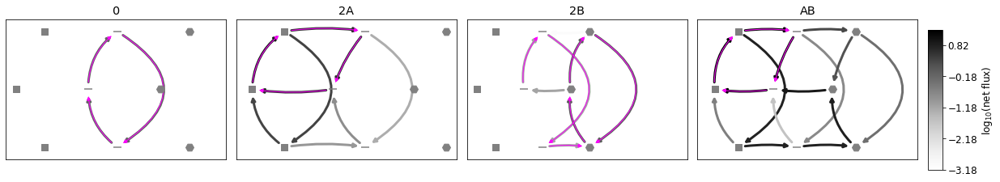

6579
[2.41254889e+00 1.43079722e+00 1.56928009e+03 7.69211903e+02]
[  2.41254889   1.43079722  74.27955456 769.21190253]
[   2.41254889  606.8148967  1569.28008892  769.21190253]
[0.6527174834189567, 0.6695533391000136, [0.5101165034409907, 0.8003294921603004, 0.7910441504302712, 1.258219356641454]]


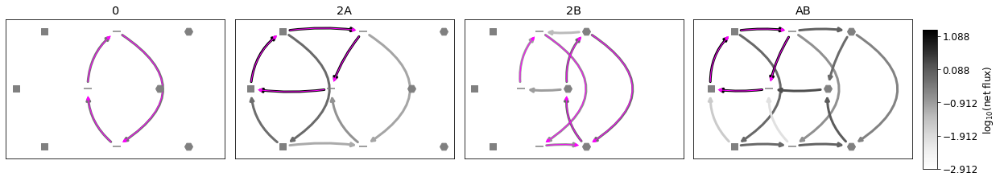

4957
[  3.44015178   1.19112903 697.18690138 231.7920519 ]
[  3.44015178   1.19112903  30.02752327 231.7920519 ]
[  3.44015178 291.20938094 697.18690138 231.7920519 ]
[0.7550338644408475, 0.37068404340974787, [0.4977937707215991, 0.6487599456840172, 0.8468078078981809, 1.0948934803079349]]


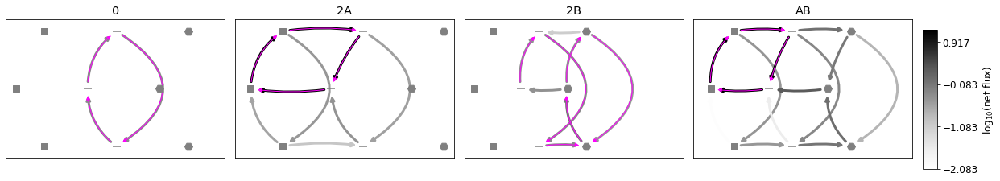

6494
[3.51664208e+02 1.01443047e+00 8.30556018e+03 1.41219372e+02]
[3.51664208e+02 1.01443047e+00 1.10354366e+03 1.41219372e+02]
[ 351.66420844  184.44264309 8305.56018433  141.21937202]
[3.4233801300965983, 0.9296870471811086, [0.8598880793140872, 0.966115551166859, 5.441335330254662, 10.364996947875943]]


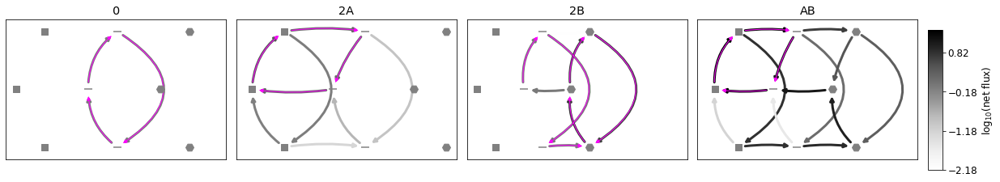

11475
[1.07986339e+01 1.15780216e+00 6.92770548e+03 1.55354290e+02]
[ 10.79863394   1.15780216  31.35229693 155.35428988]
[  10.79863394   39.93030679 6927.7054769   155.35428988]
[1.259275895176647, 3.3312368329658613, [0.1963770228218755, 0.9880810851865172, 0.23500126148433836, 2.3652246851281795]]


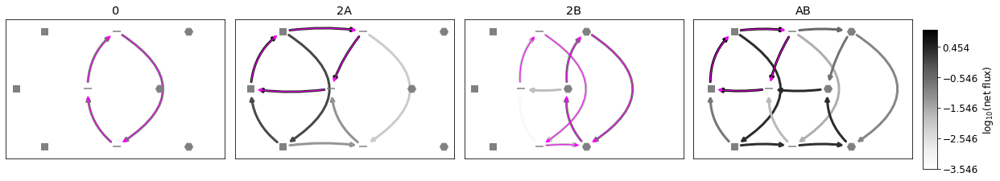

10700
[1.32590757e+02 2.21847786e+00 7.47222050e+03 4.91930066e+02]
[132.59075707   2.21847786  15.02867133 491.93006592]
[ 132.59075707  484.63249368 7472.22049683  491.93006592]
[2.530724096566773, 0.666016968939724, [1.739450065003862, 2.053738911408494, 7.479593751741963, 11.86776930071375]]


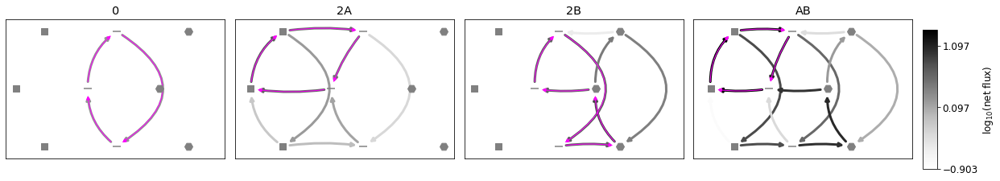

14012
[9.37216916e+00 1.15319575e+00 6.88133508e+03 9.83337999e+01]
[ 9.37216916  1.15319575  9.79469799 98.33379986]
[   9.37216916  622.93680292 6881.33507751   98.33379986]
[1.0886967275912383, 3.8719797885644303, [0.11833280342903843, 0.9075667376402776, 0.13183383411389593, 1.9302294691215058]]


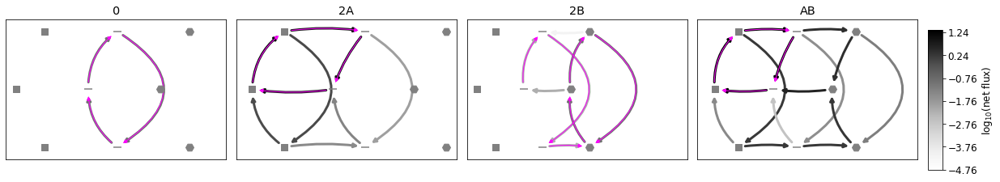

11053
[ 157.99166946    6.54515449 2918.6063145   433.05965937]
[157.99166946   6.54515449  33.61406294 433.05965937]
[ 157.99166946 2960.91699094 2918.6063145   433.05965937]
[2.4220030358613163, 0.6961382785492992, [4.90002231717675, 5.83594395627501, 19.30403841006751, 31.275673882511498]]


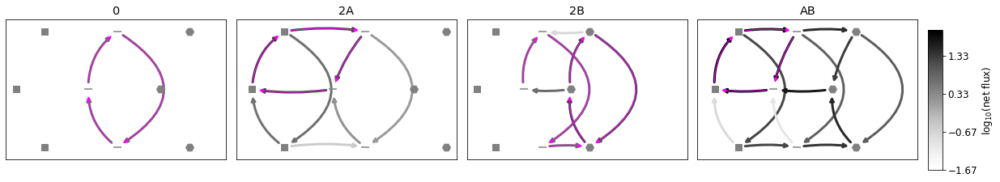

11990
[2.08508226e+02 1.33356299e+00 7.57386291e+03 1.56254607e+02]
[208.50822607   1.33356299  51.50510165 156.25460704]
[ 208.50822607  170.40652083 7573.86291458  156.25460704]
[3.0656277374013614, 1.4170708017322178, [1.006508405317745, 1.2734338967405423, 3.992468452085465, 10.661598175506569]]


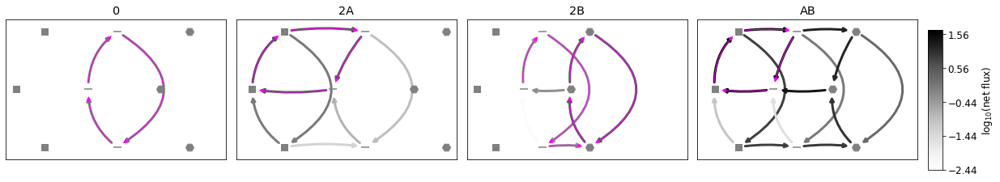

2414
[  5.39810938   1.36027729 457.28070482 154.75638138]
[  5.39810938   1.36027729 226.62155994 154.75638138]
[  5.39810938 319.97404342 457.28070482 154.75638138]
[0.9716477993596149, 0.13784488620693763, [0.6783152787480188, 0.7530049792237075, 1.3421391204815665, 1.476702400284147]]


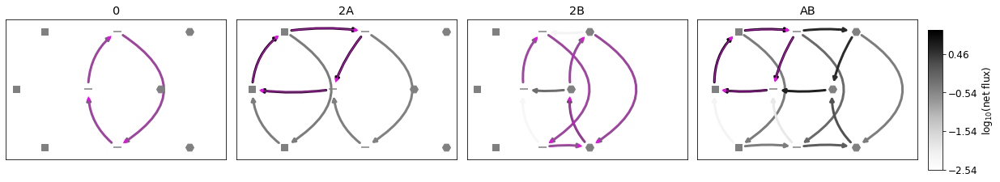

4994
[6.78702620e+00 1.37571371e+00 7.96284656e+03 2.07090915e+02]
[  6.7870262    1.37571371  22.73847428 207.0909151 ]
[6.78702620e+00 7.12096891e+02 7.96284656e+03 2.07090915e+02]
[0.0707385597978957, 2.1341801596752528, [0.15280175196112933, 0.7149771959501194, 0.1710544490308352, 0.7509078053339009]]


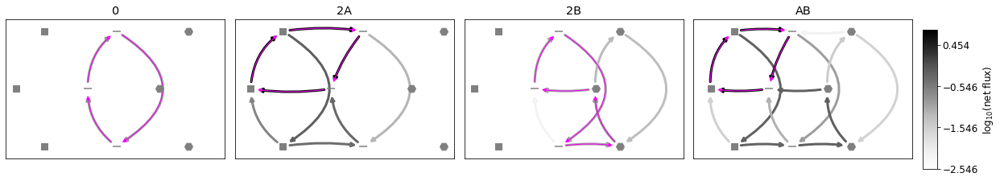

2897
[7.34923064e+00 2.88637611e+01 1.44707780e+03 1.24542282e+00]
[ 7.34923064 28.86376107 10.14666728  1.24542282]
[7.34923064e+00 2.10708890e+03 1.44707780e+03 1.24542282e+00]
*****negative SAB
[-1.3322292253267074, 1.71651100351786, [0.006286377175052548, 0.05203021355263922, 0.006287722269557504, 0.020664012243817788]]


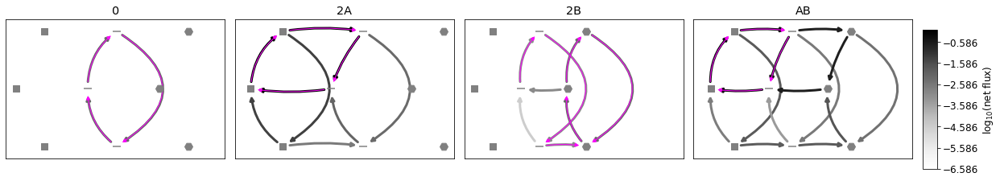

12375
[1.78230099e+01 1.99467695e+00 6.17900408e+03 2.11536561e+03]
[1.78230099e+01 1.99467695e+00 9.92578491e+01 2.11536561e+03]
[  17.82300993  136.99040748 6179.0040805  2115.36560745]
[1.9724042348192503, 0.6591017223837773, [1.3854174238643897, 1.753230036376721, 4.356947752535505, 6.880052316242783]]


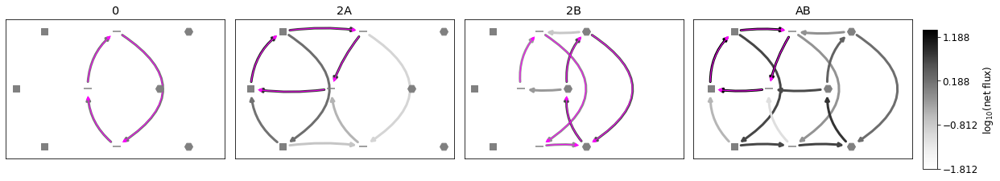

13397
[5.97514033e+01 2.20970715e+00 3.10651792e+03 2.14493515e+02]
[ 59.75140333   2.20970715 190.7661433  214.49351511]
[  59.75140333  824.13534077 3106.51792444  214.49351511]
[2.1842413031741446, 1.236573991263417, [1.3959947466846758, 1.9546059951044024, 3.7699493315210395, 8.883444154576305]]


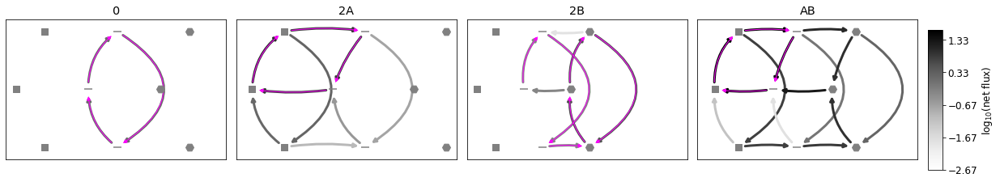

10778
[2.48919678e+02 4.86685092e+00 8.68917037e+03 2.55880164e+02]
[248.91967824   4.86685092 750.14924581 255.8801645 ]
[ 248.91967824  684.92756654 8689.17036676  255.8801645 ]
[1.566239250141846, 0.7478852627050078, [2.8586252651291146, 3.850641727378378, 6.790194430134862, 11.402973299776578]]


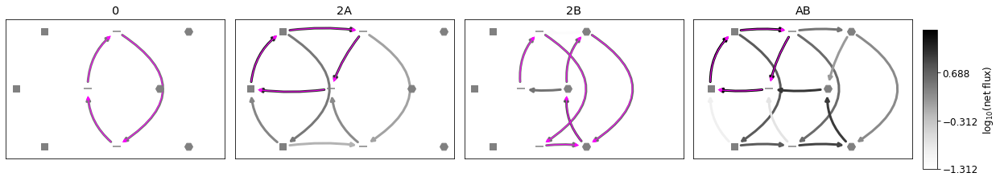

4631
[7.89759103e+01 1.07512135e+02 3.98387362e+03 1.49691978e+00]
[ 78.97591028 107.51213528 416.3622939    1.49691978]
[7.89759103e+01 1.05172367e+03 3.98387362e+03 1.49691978e+00]
*****negative SAB
[-0.7054875566992114, 0.6756941707454149, [0.02907936808622267, 0.07576381843069577, 0.029086048582542153, 0.046461041230982596]]


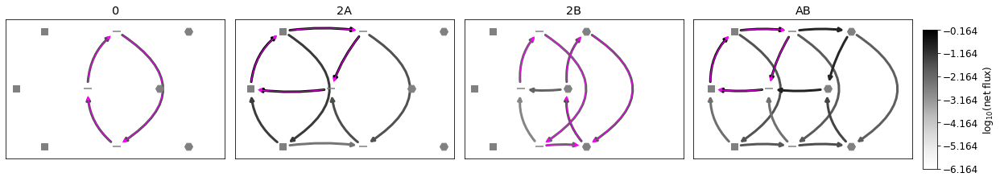

8583
[5.70044106e+01 2.22131872e+00 6.50668792e+03 1.06391943e+02]
[ 57.00441057   2.22131872  21.10064146 106.39194298]
[  57.00441057   46.253718   6506.68792394  106.39194298]
[1.3257150517575893, 2.4236050322362503, [0.6451679238762039, 1.9011638266558224, 0.8882224100853207, 4.765401955360988]]


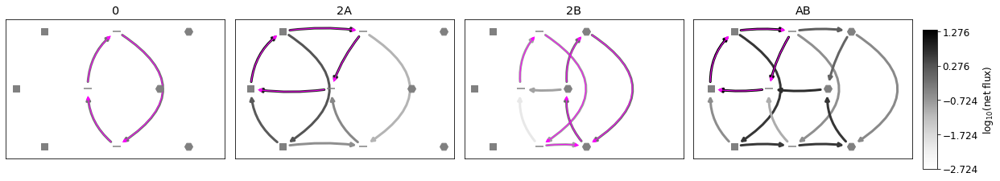

6375
[7.19812291e+00 1.93758369e+00 3.11711993e+03 3.56825235e+02]
[  7.19812291   1.93758369  39.11440165 356.82523517]
[   7.19812291   46.14160228 3117.11992559  356.82523517]
[0.39619368315315184, 1.4068280280091723, [0.5343470050749312, 1.461774783364273, 0.725519706631333, 1.9237412099773183]]


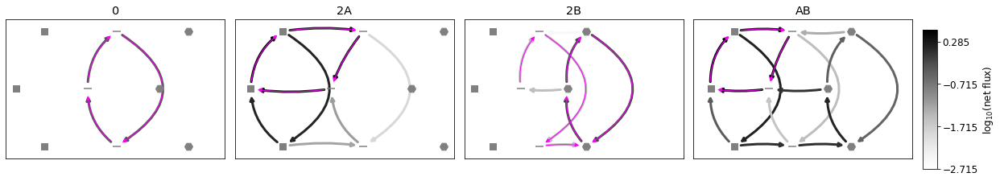

9590
[4.74668799e+00 1.14938277e+00 1.98782282e+03 2.58496267e+02]
[  4.74668799   1.14938277  20.17363642 258.49626665]
[   4.74668799  417.79194324 1987.82282343  258.49626665]
[1.120002436185861, 1.814731567062179, [0.3697349826321041, 0.8810564403043982, 0.5443389645842484, 1.9149527327179654]]


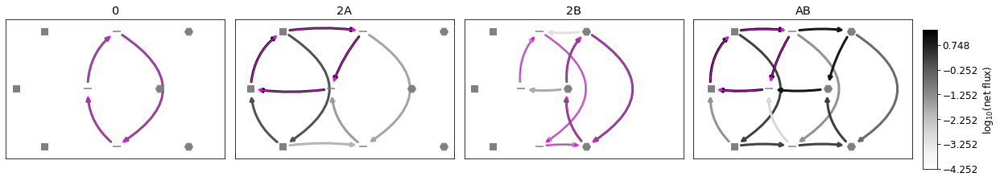

14290
[3.47356638e+02 1.30925984e+00 7.70945603e+03 5.67206146e+01]
[347.35663784   1.30925984   9.82594295  56.72061458]
[ 347.35663784  214.60701963 7709.45603203   56.72061458]
[2.8938021108191916, 1.9405390356507328, [0.8506315586593831, 1.2386811175614765, 2.398392716612767, 9.206207390732642]]


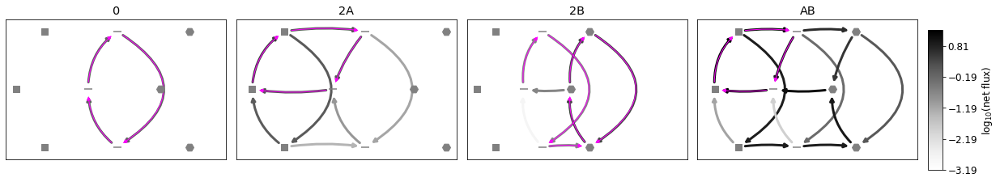

14177
[2.24105018e+02 1.12675336e+00 6.47480581e+03 3.10704780e+02]
[224.10501783   1.12675336 121.65661445 310.70477966]
[ 224.10501783  268.93460829 6474.80581335  310.70477966]
[3.834929991473012, 0.7184974207435759, [1.0119670921206114, 1.0914503387524552, 9.465502254169735, 15.57517513201864]]


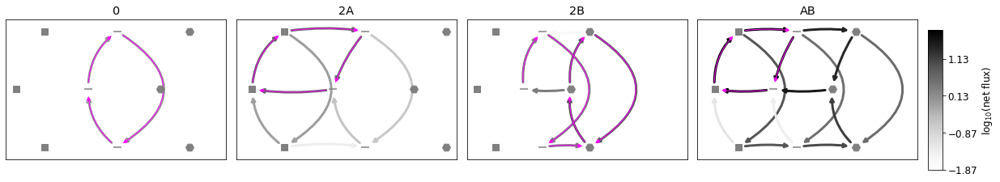

6472
[ 14.05136443   1.45490573 782.82091299 186.69423592]
[ 14.05136443   1.45490573   2.99348352 186.69423592]
[ 14.05136443 167.33609195 782.82091299 186.69423592]
[1.8583329367654549, 0.7788187835342996, [0.941386164385627, 1.2331961793227808, 2.606143416889471, 4.47142680974683]]


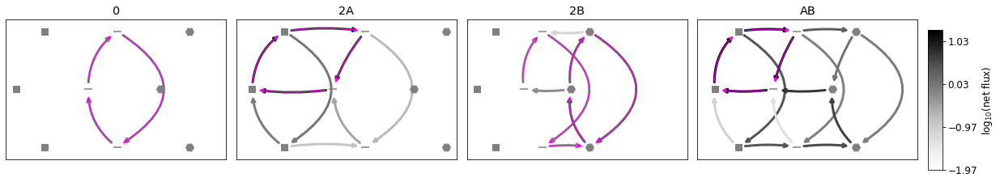

11590
[4.51349160e+01 1.71103534e+00 5.74440140e+03 3.84854077e+02]
[ 45.13491598   1.71103534  46.26896931 384.85407701]
[  45.13491598  165.6491479  5744.40139691  384.85407701]
[1.7160344251416992, 0.9313629848661302, [1.0639462996470277, 1.54954316264775, 2.6693979236026326, 5.09074699541612]]


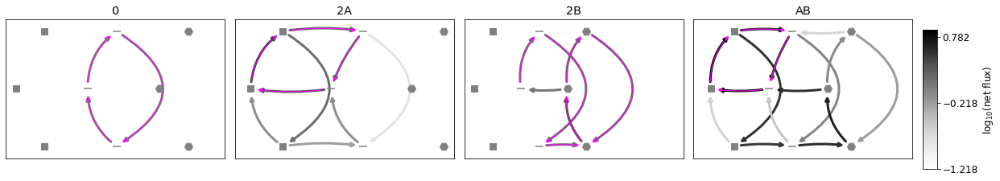

9557
[6.83041373e+01 1.58434823e+00 5.45698438e+03 1.46025476e+03]
[  68.30413733    1.58434823   23.14428146 1460.25475617]
[  68.30413733 1390.22297647 5456.98437805 1460.25475617]
[3.773765398584571, 0.5806435228767434, [1.4261044874070496, 1.5401819172912588, 14.086317876265147, 21.06631635617242]]


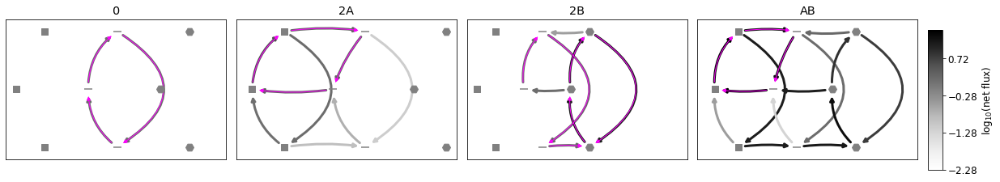

11970
[2.32101308e+01 4.92614122e+00 7.23276369e+03 2.32216826e+02]
[ 23.21013079   4.92614122   8.05051117 232.21682564]
[  23.21013079 1020.35164869 7232.76369007  232.21682564]
[0.5825378749249628, 2.8225692622721392, [0.628010797417518, 3.397491555774693, 0.7191868653244019, 5.087679675468555]]


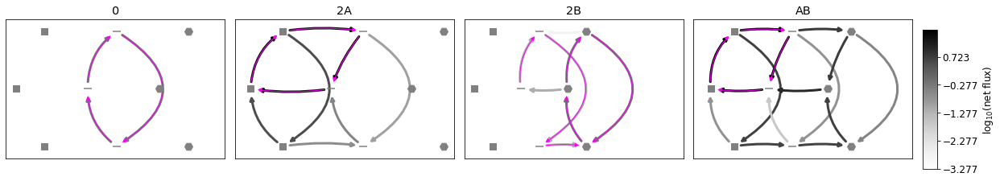

10243
[8.72928638e+01 5.52538522e+00 6.00508747e+03 3.49803733e+01]
[87.29286383  5.52538522  6.80488321 34.98037325]
[  87.29286383  258.14520739 6005.08746976   34.98037325]
[0.2759706996201286, 3.1221995773166427, [0.45711641063583713, 3.5761629879419767, 0.49729837184941156, 4.330048517491454]]


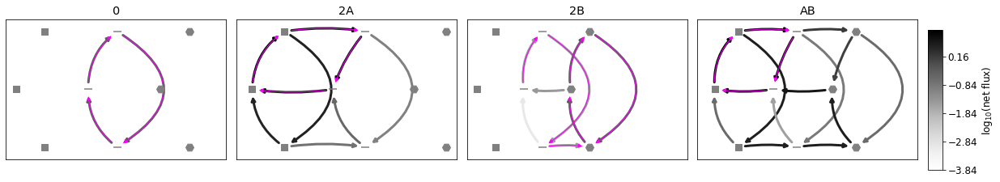

8601
[ 44.32511049   4.97015233 781.83557442 145.55581483]
[ 44.32511049   4.97015233   2.5872862  145.55581483]
[ 44.32511049 995.61334142 781.83557442 145.55581483]
[1.5103092285798454, 0.868732867901158, [2.8424167850618396, 4.224639788568433, 6.590576630686368, 12.034777503306012]]


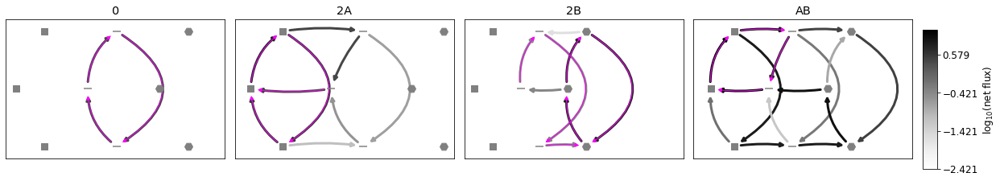

5916
[2.12286792e+00 5.58326089e+02 8.26746841e+03 3.26258112e+01]
[  2.12286792 558.32608944  10.34137393  32.62581118]
[2.12286792e+00 6.92629181e+02 8.26746841e+03 3.26258112e+01]
*****negative SAB
[-1.289534880498304, 1.423299849982181, [0.008342259940378764, 0.05469270418235615, 0.008342280139486633, 0.02237384975251675]]


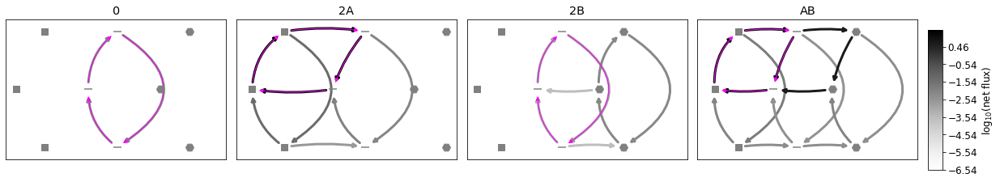

14072
[6.74144403e+01 1.14610527e+00 8.94038396e+03 7.03732410e+01]
[67.41444027  1.14610527 22.94142269 70.37324102]
[  67.41444027   21.99449773 8940.3839623    70.37324102]
[2.0575609965926014, 3.1475050021768842, [0.3589295852110695, 1.086323505696559, 0.5103326301391086, 4.522168647952796]]


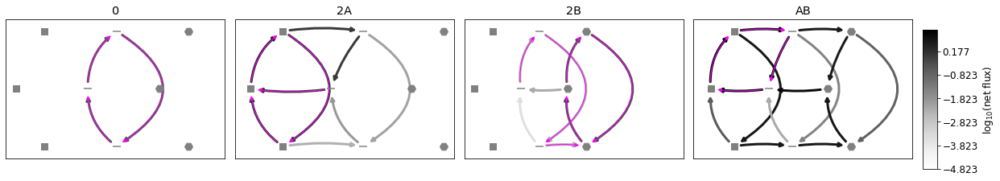

10254
[4.80081784e+01 5.30710944e+00 5.35362820e+03 2.18782384e+03]
[  48.00817843    5.30710944   25.4874427  2187.82383595]
[  48.00817843  794.77353314 5353.62819822 2187.82383595]
[2.2470796829013215, 0.7268731241217169, [3.8360612827985547, 4.739769898004086, 13.595182198775653, 22.500680124303834]]


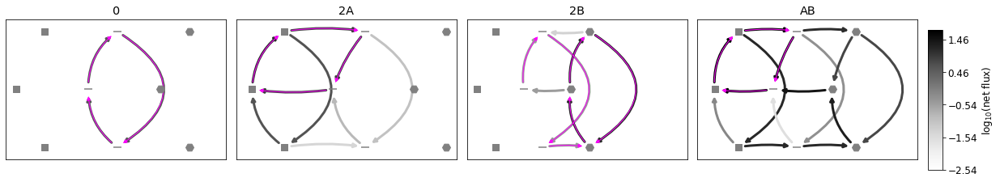

12945
[2.83750382e+02 1.02511321e+00 6.63740687e+03 2.41864578e+01]
[283.75038214   1.02511321  29.28962326  24.18645778]
[ 283.75038214  577.03452537 6637.40687365   24.18645778]
[2.140599256629108, 2.0205506625753555, [0.5031414862412718, 0.9071888325720315, 0.9859069388282239, 4.000205295115191]]


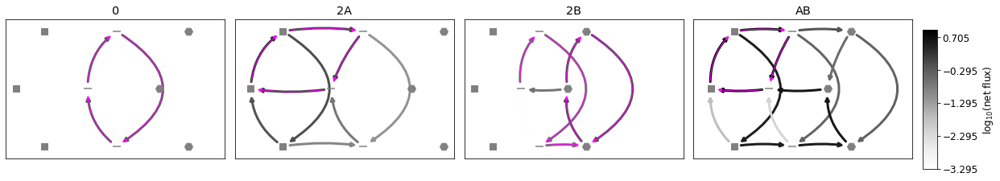

5874
[  34.0792328     1.48645808 1060.71717782   64.01281457]
[34.0792328   1.48645808  1.19523985 64.01281457]
[  34.0792328    37.47583705 1060.71717782   64.01281457]
[1.2176545842149045, 0.6695926712122041, [0.8306084957903038, 1.186520815443148, 1.7348360444850874, 2.7594715175664835]]


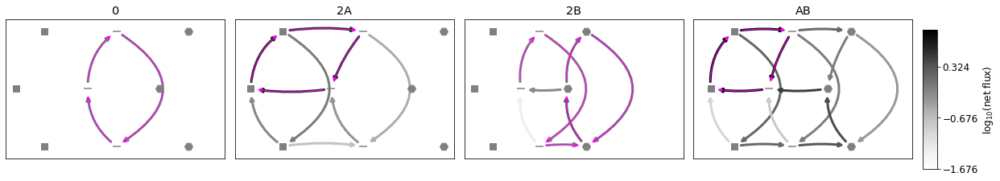

11184
[8.44175925e+01 1.93628870e+00 6.02772617e+03 5.79752853e+01]
[ 84.41759255   1.9362887  260.60752865  57.97528534]
[  84.41759255   14.27968289 6027.72617074   57.97528534]
[0.7387673913513928, 1.7937174578800603, [0.5626926438947775, 1.5547280991569006, 0.7483122139603562, 2.5944517144009462]]


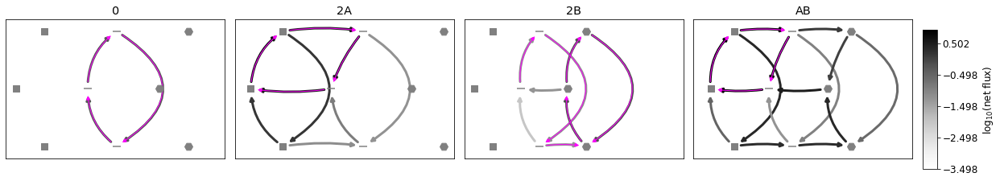

12240
[1.98012939e+01 1.25316578e+00 1.50967896e+03 3.44515916e+02]
[ 19.80129387   1.25316578  20.23112236 344.51591593]
[  19.80129387   77.498128   1509.67895585  344.51591593]
[2.4327804135186666, 0.8553678767744642, [0.9322413750633803, 1.1626469305448626, 3.4697352519612803, 6.277514531559651]]


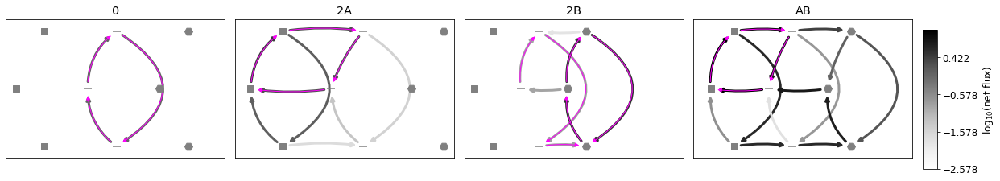

1542
[9.70933391e+00 3.23491117e+00 8.96664287e+03 1.92592169e+01]
[   9.70933391    3.23491117 1060.60379565   19.25921692]
[   9.70933391   66.57114555 8966.64287438   19.25921692]
*****negative SAB
[-0.7674193290792656, 2.0628834167869092, [0.020654541694949687, 0.14779211984961652, 0.020779986216319525, 0.08682305061792703]]


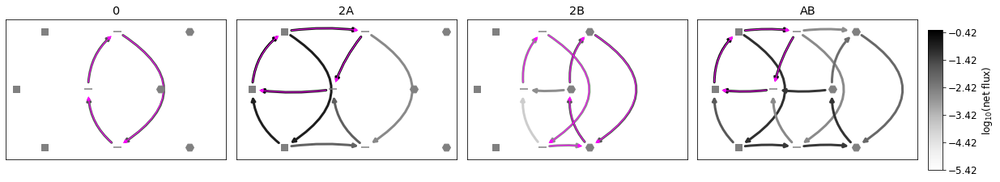

497
[ 168.54264175   17.28876398 5959.61497293 2606.96932315]
[ 168.54264175   17.28876398  105.69213602 2606.96932315]
[ 168.54264175 6917.4145291  5959.61497293 2606.96932315]
[2.2167726377302346, 0.5078488318940243, [12.866475682829654, 15.232484360185843, 49.79756036655918, 70.80856586572033]]


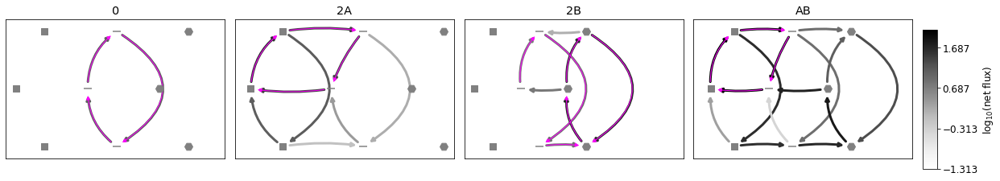

12469
[1.59041001e+01 1.55918055e+00 4.36325590e+03 5.58494530e+02]
[ 15.90410008   1.55918055   8.12592551 558.49452984]
[  15.90410008   28.8512583  4363.25590143  558.49452984]
[1.718531977595529, 1.4465394795537978, [0.8352422623251724, 1.4007430284786844, 1.6913612255123749, 4.609864322426299]]


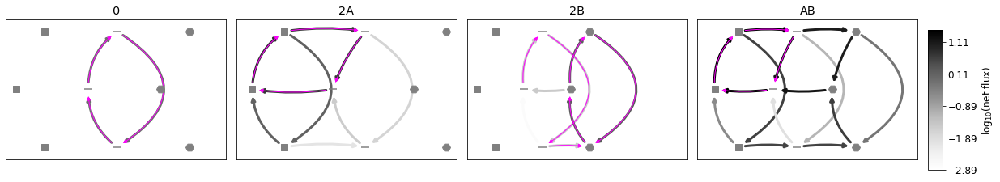

13974
[6.48226475e+01 1.04677692e+00 8.46417857e+03 7.47846859e+01]
[64.82264751  1.04677692 10.76803115 74.78468594]
[  64.82264751  251.1685892  8464.17856805   74.78468594]
[2.8600246217446217, 3.687470348365597, [0.3662847504162426, 0.9975617362375817, 0.562152050245948, 7.242574678270726]]


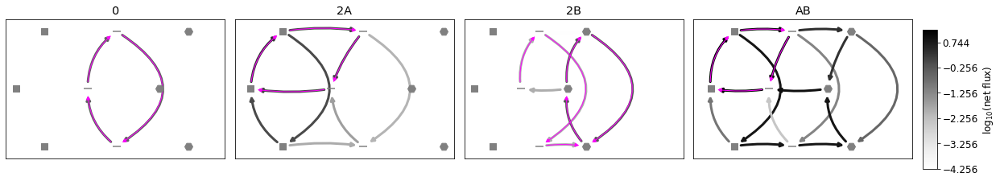

4808
[  55.65599843    4.25728469 3726.86057606  799.3823622 ]
[ 55.65599843   4.25728469   7.26882008 799.3823622 ]
[  55.65599843  128.70158646 3726.86057606  799.3823622 ]
[2.092482432665704, 0.8788551121961973, [2.9596508996942084, 3.8763818907840695, 8.990105391822162, 16.53204328303285]]


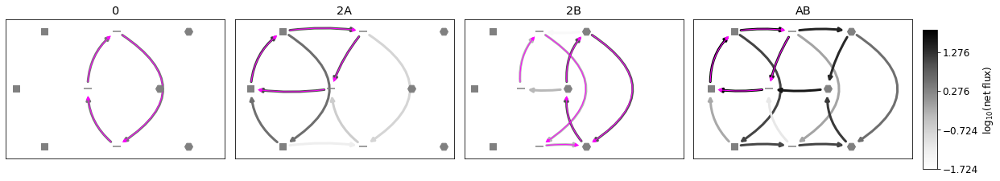

6710
[  45.06667477   57.04303053 4761.29832501   89.12784335]
[45.06667477 57.04303053  5.10627598 89.12784335]
[  45.06667477   67.75359692 4761.29832501   89.12784335]
*****negative SAB
[-0.9450631265182957, 1.4448945989804491, [0.8088541928088024, 4.246991401849288, 0.8102749598758331, 2.2059163156031802]]


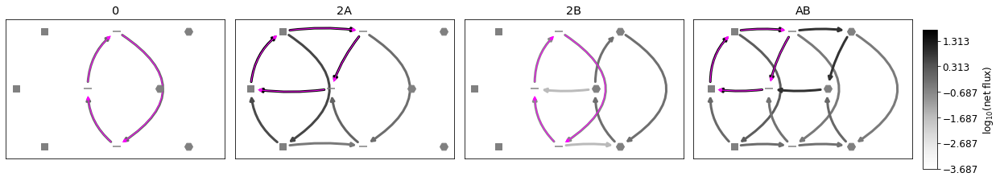

11662
[3.73405150e+01 2.58168914e+00 8.47844543e+03 3.53963510e+02]
[ 37.34051498   2.58168914 265.74741008 353.96351019]
[  37.34051498   90.69191759 8478.44542847  353.96351019]
[1.5813728631828958, 2.2076242182741668, [0.9448039711066386, 2.2624318261382887, 1.4657336512312398, 6.7704286808282985]]


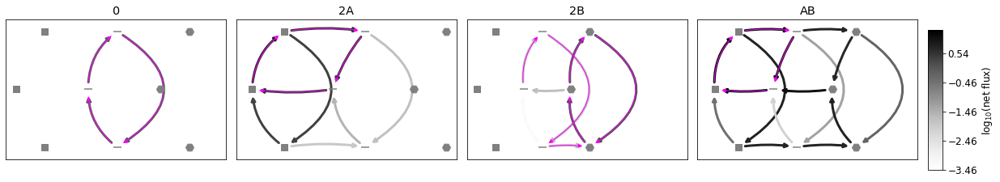

In [21]:
matd=np.asarray(allmatd[0],dtype=int)
subset=allsubsets[0]
netJ=True
columns_print=["p%d"%i for i in range(1,13)]

path1=list(map(int,list(map(float,list("0. 1. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1.".split(" "))))))
path2=list(map(int,list(map(float,list("0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1.".split(" "))))))
for path in [path1,path2]:
    print("#path")
    print(path)

    idxs=np.where(np.all(matd==np.array(path),axis=1))[0]

    #choose 100
    np.random.seed(1)
    choice=np.random.choice(idxs,size=100,replace=False)
    for idx in choice:
        print(idx)
        print(subset.iloc[idx][columns_print[0:4]].values)
        print(subset.iloc[idx][columns_print[4:8]].values)
        print(subset.iloc[idx][columns_print[8:12]].values)
        parset=subset.iloc[idx].values[0:24].copy()
        out=basic.compute_synergy(parset,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=10,fcpair=10,returnm=True,anystronger=True)
        if (out[0]<0):
            print("*****negative SAB")
        print(out)
        allGslist=[]
        allG2slist=[]
        allcolorslist=[]
        fig,axes=plt.subplots(1,4,figsize=(16,3))
        titles=["0","2A","2B","AB"]
        for i in range(4):
            if i==0:
                A=0
                B=0
            elif i==1:
                A=2
                B=0
            elif i==2:
                A=0
                B=2
            else:
                A=1
                B=1
            rhos=PolAB_A_allpars.interface_rhos_GRF_PolAB_A_A(parset,np.array([B]),A)
            P=rhos/np.sum(rhos)
            J=fluxes.get_fluxes(edges_,A,B,parset,P,netJ=netJ)
            Js_ar=J.flatten()
            #print(Js_ar)
            #keep only those columns with nonzero fluxes
            mask=[]
            for col in range(nnodes*nnodes):
                if np.any(Js_ar[col]>1e-15):
                    mask.append(col)
            #mat=np.log10(all_Js)[:,mask]
            Js_ar=Js_ar[mask]
            names_ar=all_fnames[mask]
            G=fluxes.get_graph_fromJarray(np.log10(Js_ar),names_ar,min_=-15)
            Gs=[G]
            G2=fluxes.get_dominant_path_G(G,node0)
            all_G2s=[G2]
            allGslist.append(Gs)
            allG2slist.append(all_G2s)
            colors_=[[G[e[0]][e[1]]["weight"] for e in G.edges()] for G in Gs]
            allcolorslist.append(colors_)

        vmin_nflog=min([min([min(x) for x in colors_]) for colors_ in allcolorslist])
        vmax_nflog=max([max([max(x) for x in colors_]) for colors_ in allcolorslist])

        color_args={"edge_cmap":cmap,"edge_vmin":vmin_nflog,"edge_vmax":vmax_nflog,"width":3}


        for i in range(4):
            axes[i].set_title(titles[i])
            #axes[i].set_frame_on(False)
            Gs=allGslist[i]
            all_G2s=allG2slist[i]
            colors_=allcolorslist[i]
            fluxes.plot_graphs(Gs,[axes[i]],coords=coords,dominant=all_G2s,color_lists=colors_,color_args=color_args,colord="magenta")

        cbax=fig.add_axes([1,0,0.015,0.8])
        norm=mpl.colors.Normalize(vmin=vmin_nflog,vmax=vmax_nflog)
        mpl.colorbar.ColorbarBase(cbax,cmap=cmap,norm=norm,ticks=np.arange(vmin_nflog,vmax_nflog,1),label="log$_{10}$(net flux)")
        plt.tight_layout()
        plt.show()
       
